<a href="https://colab.research.google.com/github/pak0vskiy/mental_state_prediction_EEG/blob/main/mental_states_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preprocessing Testing

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("inancigdem/eeg-data-for-mental-attention-state-detection")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/eeg-data-for-mental-attention-state-detection


In [ ]:
import os
import scipy.io as sio
path_to_data = path +"/EEG Data"
print(os.listdir(path_to_data))

temp = path_to_data + "/" + os.listdir(path_to_data)[0]
temp_data = sio.loadmat(temp)


['eeg_record25.mat', 'eeg_record26.mat', 'eeg_record17.mat', 'eeg_record1.mat', 'eeg_record3.mat', 'eeg_record22.mat', 'eeg_record20.mat', 'eeg_record15.mat', 'eeg_record13.mat', 'eeg_record14.mat', 'eeg_record10.mat', 'eeg_record23.mat', 'eeg_record8.mat', 'eeg_record28.mat', 'eeg_record21.mat', 'eeg_record16.mat', 'eeg_record19.mat', 'eeg_record4.mat', 'eeg_record18.mat', 'eeg_record33.mat', 'eeg_record2.mat', 'eeg_record27.mat', 'eeg_record32.mat', 'eeg_record24.mat', 'eeg_record11.mat', 'eeg_record6.mat', 'eeg_record31.mat', 'eeg_record12.mat', 'eeg_record29.mat', 'eeg_record9.mat', 'eeg_record7.mat', 'eeg_record30.mat', 'eeg_record5.mat', 'eeg_record34.mat']


In [ ]:
import pandas as pd
cols = [
    "ED_COUNTER",
    'ED_INTERPOLATED',
  'ED_RAW_CQ',
'ED_AF3',
'ED_F7',
'ED_F3',
'ED_FC5',
'ED_T7',
'ED_P7',
'ED_O1',
'ED_O2',
'ED_P8',
'ED_T8',
'ED_FC6',
'ED_F4',
'ED_F8',
'ED_AF4',
'ED_GYROX',
'ED_GYROY',
'ED_TIMESTAMP',
'ED_ES_TIMESTAMP',
'ED_FUNC_ID',
'ED_FUNC_VALUE',
'ED_MARKER',
'ED_SYNC_SIGNAL'
]
temp_df = pd.DataFrame(temp_data["o"]["data"][0,0], columns=cols)

In [ ]:
def get_labels(df):
  start_time = df["ED_TIMESTAMP"].iloc[0]
  def get_mental_state(x):
    if x["ED_TIMESTAMP"] <= start_time + 600:
      return 2
    elif x["ED_TIMESTAMP"] > start_time + 600 and x["ED_TIMESTAMP"] <= start_time + 1200:
      return 1
    else:
      return 0

  df["Mental_State"] = df.apply(get_mental_state, axis=1)
  return df

temp_df = get_labels(temp_df)

In [ ]:
temp_df.head()

,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,ED_O1,...,ED_AF4,ED_GYROX,ED_GYROY,ED_TIMESTAMP,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL,Mental_State
0,125.0,0.0,0.0,4435.384615,4005.641026,4998.461538,3816.410256,4042.051282,4355.384615,4312.820513,...,4146.153846,1565.0,1726.0,2114.962,0.031277,0.0,0.0,0.0,0.0,2
1,126.0,0.0,0.0,4434.358974,4005.128205,4995.384615,3819.487179,4044.615385,4353.846154,4312.307692,...,4144.102564,1565.0,1727.0,2114.970,0.031277,0.0,0.0,0.0,0.0,2
2,127.0,0.0,420.0,4433.333333,4006.153846,5001.538462,3824.102564,4052.307692,4357.435897,4316.923077,...,4145.128205,1566.0,1726.0,2114.978,0.031277,0.0,0.0,0.0,0.0,2
3,128.0,0.0,0.0,4432.820513,4007.179487,5006.153846,3820.512821,4043.589744,4356.923077,4318.461538,...,4152.820513,1565.0,1726.0,2114.986,0.031277,0.0,0.0,0.0,0.0,2
4,0.0,0.0,376.0,4433.333333,4004.615385,4999.487179,3824.102564,4034.871795,4351.794872,4311.794872,...,4156.410256,1566.0,1726.0,2114.994,0.031277,0.0,0.0,0.0,0.0,2


In [ ]:
temp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 349008 entries, 0 to 349007
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   ED_COUNTER       349008 non-null  float64
 1   ED_INTERPOLATED  349008 non-null  float64
 2   ED_RAW_CQ        349008 non-null  float64
 3   ED_AF3           349008 non-null  float64
 4   ED_F7            349008 non-null  float64
 5   ED_F3            349008 non-null  float64
 6   ED_FC5           349008 non-null  float64
 7   ED_T7            349008 non-null  float64
 8   ED_P7            349008 non-null  float64
 9   ED_O1            349008 non-null  float64
 10  ED_O2            349008 non-null  float64
 11  ED_P8            349008 non-null  float64
 12  ED_T8            349008 non-null  float64
 13  ED_FC6           349008 non-null  float64
 14  ED_F4            349008 non-null  float64
 15  ED_F8            349008 non-null  float64
 16  ED_AF4           349008 non-null  floa

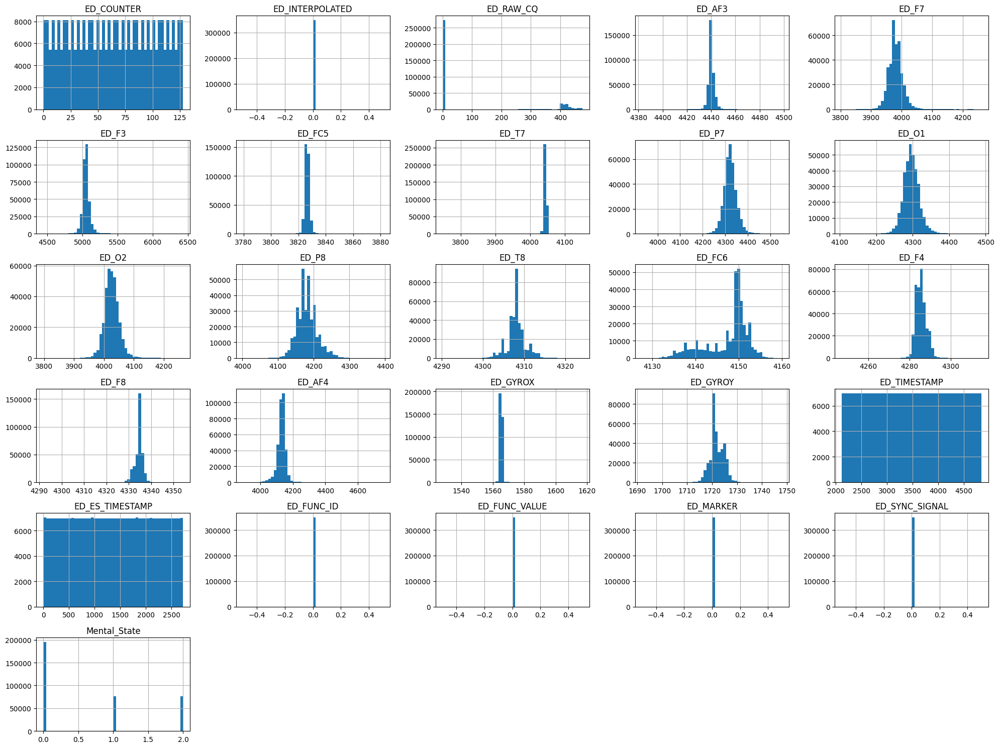

In [ ]:
import matplotlib.pyplot as plt
temp_df.hist(bins=50, figsize=(20,15))
plt.tight_layout()
plt.show()

In [ ]:
temp_df.describe()

,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,ED_O1,...,ED_AF4,ED_GYROX,ED_GYROY,ED_TIMESTAMP,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL,Mental_State
count,349008.000000,349008.0,349008.000000,349008.000000,349008.000000,349008.000000,349008.000000,349008.000000,349008.000000,349008.000000,...,349008.000000,349008.000000,349008.000000,349008.000000,349008.000000,349008.0,349008.0,349008.0,349008.0,349008.000000
mean,63.994800,0.0,89.928205,4439.977948,3980.384874,5051.469714,3826.360302,4043.974842,4321.773005,4296.273038,...,4130.409556,1565.372765,1721.977614,3479.448726,1364.375671,0.0,0.0,0.0,0.0,0.659592
std,37.238706,0.0,171.654643,2.644501,23.763064,68.734451,1.821720,3.309819,30.961367,22.187346,...,29.680988,1.599753,2.922579,787.789472,787.782918,0.0,0.0,0.0,0.0,0.815021
min,0.000000,0.0,0.000000,4383.076923,3804.102564,4444.615385,3779.487179,3747.692308,3931.794872,4105.128205,...,3892.820513,1528.000000,1692.000000,2114.962000,0.031277,0.0,0.0,0.0,0.0,0.000000
25%,32.000000,0.0,0.000000,4438.461538,3966.153846,5023.076923,3825.128205,4041.538462,4305.128205,4282.564103,...,4118.461538,1565.000000,1720.000000,2797.206000,682.125244,0.0,0.0,0.0,0.0,0.000000
50%,64.000000,0.0,0.000000,4440.000000,3978.974359,5047.692308,3826.153846,4043.589744,4321.538462,4295.897436,...,4132.307692,1565.000000,1722.000000,3479.447000,1364.203613,0.0,0.0,0.0,0.0,0.000000
75%,96.000000,0.0,0.000000,4441.025641,3992.820513,5074.358974,3827.179487,4046.153846,4338.461538,4309.230769,...,4144.615385,1566.000000,1724.000000,4161.691000,2046.798096,0.0,0.0,0.0,0.0,1.000000
max,128.000000,0.0,475.000000,4498.461538,4262.051282,6433.333333,3881.538462,4151.282051,4550.769231,4488.717949,...,4753.333333,1617.000000,1748.000000,4843.936000,2728.899902,0.0,0.0,0.0,0.0,2.000000


In [ ]:
final_df = pd.DataFrame()
for record in os.listdir(path_to_data):
  temp_data = sio.loadmat(path_to_data + "/" + record)
  temp_df = pd.DataFrame(temp_data["o"]["data"][0,0], columns=cols)
  temp_df = get_labels(temp_df)
  final_df = pd.concat([final_df, temp_df])



KeyboardInterrupt: 

In [ ]:
#final_df.to_csv("final_df.csv", index=False)

In [ ]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12512552 entries, 0 to 424607
Data columns (total 26 columns):
 #   Column           Dtype  
---  ------           -----  
 0   ED_COUNTER       float64
 1   ED_INTERPOLATED  float64
 2   ED_RAW_CQ        float64
 3   ED_AF3           float64
 4   ED_F7            float64
 5   ED_F3            float64
 6   ED_FC5           float64
 7   ED_T7            float64
 8   ED_P7            float64
 9   ED_O1            float64
 10  ED_O2            float64
 11  ED_P8            float64
 12  ED_T8            float64
 13  ED_FC6           float64
 14  ED_F4            float64
 15  ED_F8            float64
 16  ED_AF4           float64
 17  ED_GYROX         float64
 18  ED_GYROY         float64
 19  ED_TIMESTAMP     float64
 20  ED_ES_TIMESTAMP  float64
 21  ED_FUNC_ID       float64
 22  ED_FUNC_VALUE    float64
 23  ED_MARKER        float64
 24  ED_SYNC_SIGNAL   float64
 25  Mental_State     int64  
dtypes: float64(25), int64(1)
memory usage: 2.5 GB


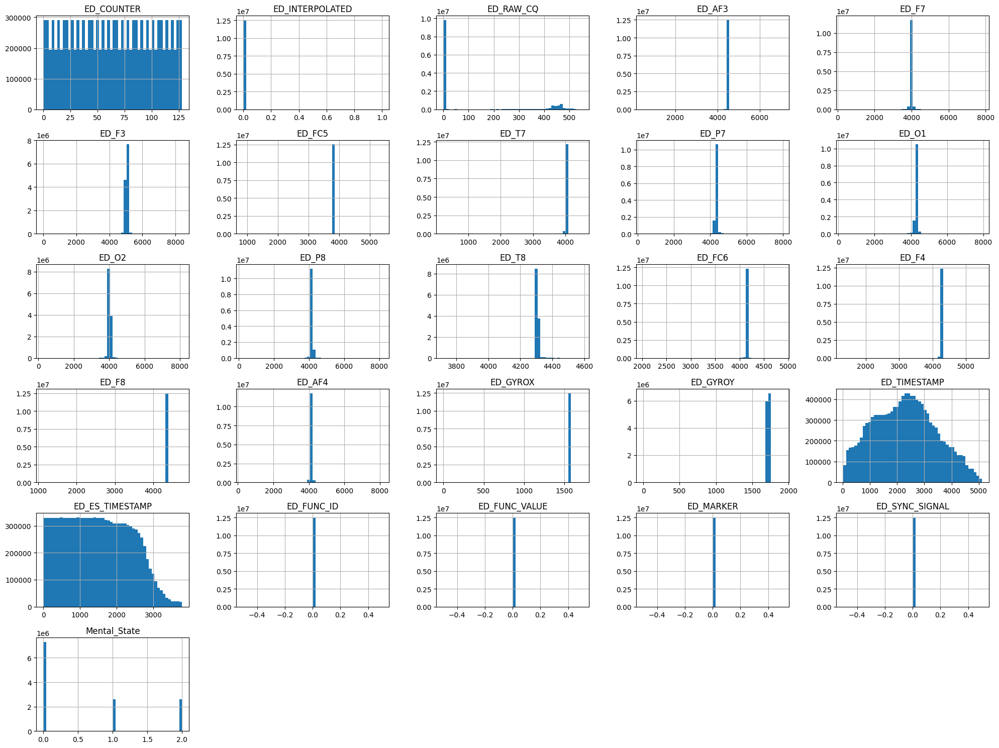

In [ ]:
final_df.hist(bins=50, figsize=(20,15))
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score

X = temp_df.drop(["Mental_State", "ED_COUNTER", "ED_INTERPOLATED", "ED_FUNC_ID", "ED_FUNC_VALUE", "ED_MARKER", "ED_SYNC_SIGNAL", "ED_TIMESTAMP", "ED_ES_TIMESTAMP"], axis=1)
y = temp_df["Mental_State"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=400, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred, average="weighted"))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.9597395256823908
F1 Score: 0.9590620631617461
Confusion Matrix:
 [[53567   680    90]
 [ 2086 12996   217]
 [  103   243 14940]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.97     54337
           1       0.93      0.85      0.89     15299
           2       0.98      0.98      0.98     15286

    accuracy                           0.96     84922
   macro avg       0.96      0.94      0.95     84922
weighted avg       0.96      0.96      0.96     84922



In [ ]:
temp_data_2 = sio.loadmat(path_to_data + "/" + os.listdir(path_to_data)[1])
temp_df_2 = pd.DataFrame(temp_data_2["o"]["data"][0,0], columns=cols)
temp_df_2.head()

,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,ED_O1,...,ED_F8,ED_AF4,ED_GYROX,ED_GYROY,ED_TIMESTAMP,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL
0,110.0,0.0,0.0,4441.025641,3974.871795,5026.153846,3822.564103,4031.282051,4348.205128,4280.512821,...,4336.410256,4137.435897,1559.0,1722.0,43.419,0.031277,0.0,0.0,0.0,0.0
1,111.0,0.0,471.0,4440.000000,3972.307692,5020.512821,3827.692308,4034.358974,4342.051282,4271.282051,...,4335.897436,4126.666667,1560.0,1722.0,43.426,0.031277,0.0,0.0,0.0,0.0
2,112.0,0.0,0.0,4441.538462,3966.153846,5018.974359,3829.743590,4030.769231,4339.487179,4264.615385,...,4335.897436,4124.102564,1558.0,1720.0,43.434,0.031277,0.0,0.0,0.0,0.0
3,113.0,0.0,0.0,4440.000000,3967.692308,5025.641026,3826.666667,4028.205128,4344.615385,4272.820513,...,4336.410256,4133.333333,1559.0,1720.0,43.442,0.031277,0.0,0.0,0.0,0.0
4,114.0,0.0,0.0,4441.025641,3972.307692,5027.179487,3828.205128,4031.794872,4341.538462,4274.871795,...,4336.410256,4132.307692,1558.0,1720.0,43.450,0.031277,0.0,0.0,0.0,0.0


In [ ]:
temp_df_2 = get_labels(temp_df_2)

X = temp_df_2.drop(["Mental_State", "ED_COUNTER", "ED_INTERPOLATED", "ED_FUNC_ID", "ED_FUNC_VALUE", "ED_MARKER", "ED_SYNC_SIGNAL", "ED_TIMESTAMP", "ED_ES_TIMESTAMP"], axis=1)
y = temp_df_2["Mental_State"]
preds = rf.predict(X)

print("Accuracy:", accuracy_score(y, preds))
print("F1 Score:", f1_score(y, preds, average="weighted"))
print("Confusion Matrix:\n", confusion_matrix(y, preds))
print("Classification Report:\n", classification_report(y, preds))

Accuracy: 0.45719579956671746
F1 Score: 0.41089890351564284
Confusion Matrix:
 [[174850  44963  25535]
 [ 62094   7476   7164]
 [ 69701   7022     11]]
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.71      0.63    245348
           1       0.13      0.10      0.11     76734
           2       0.00      0.00      0.00     76734

    accuracy                           0.46    398816
   macro avg       0.23      0.27      0.25    398816
weighted avg       0.38      0.46      0.41    398816



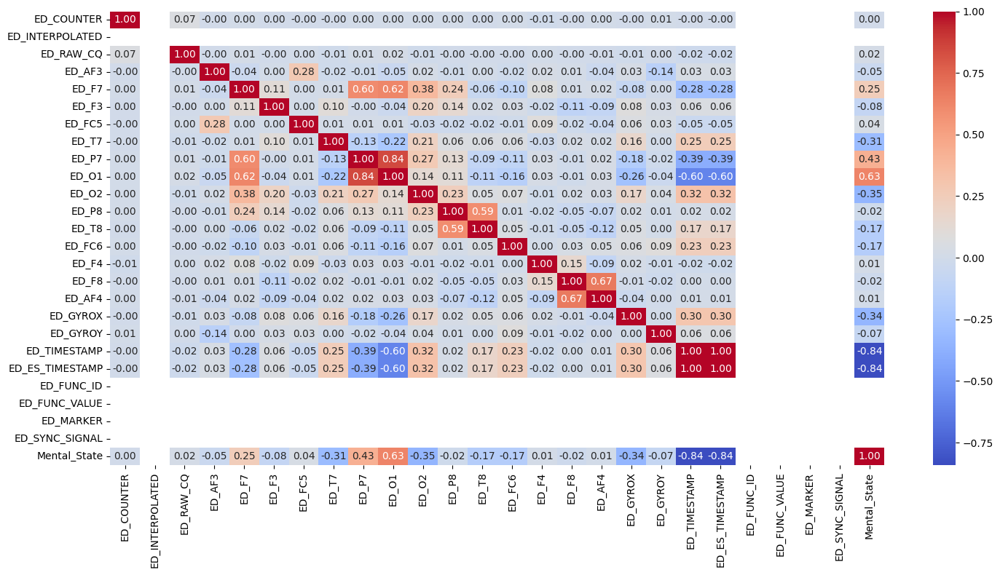

In [ ]:
import seaborn as sns
plt.figure(figsize=(15, 8))
sns.heatmap(temp_df.corr(), annot=True, fmt=".2f", cmap="coolwarm")
plt.tight_layout()
plt.show()

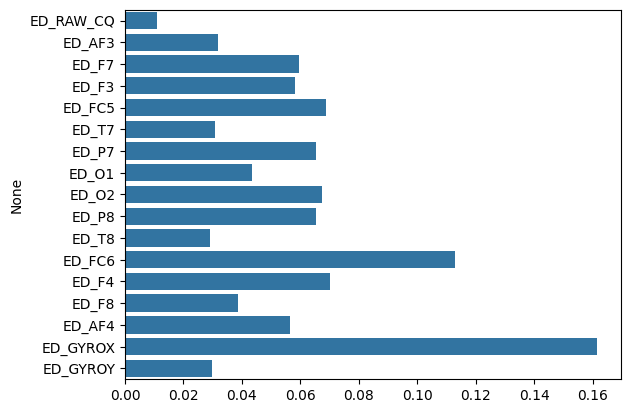

In [ ]:
sns.barplot(x=rf.feature_importances_, y=X.columns)
plt.show()

In [ ]:
temp_df.set_index("ED_TIMESTAMP").head()

,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,ED_O1,...,ED_F8,ED_AF4,ED_GYROX,ED_GYROY,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL,Mental_State
ED_TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
781.160,25.0,0.0,0.0,4432.820513,3955.384615,4859.487179,3829.743590,4041.538462,4350.256410,4352.307692,...,4332.307692,4050.256410,1566.0,1723.0,0.031277,0.0,0.0,0.0,0.0,2
781.167,26.0,0.0,0.0,4434.871795,3957.435897,4863.589744,3833.333333,4041.538462,4349.230769,4353.333333,...,4333.846154,4050.769231,1567.0,1723.0,0.031277,0.0,0.0,0.0,0.0,2
781.175,27.0,0.0,0.0,4435.897436,3955.897436,4862.051282,3827.179487,4042.564103,4341.025641,4348.717949,...,4334.358974,4047.179487,1567.0,1723.0,0.031277,0.0,0.0,0.0,0.0,2
781.183,28.0,0.0,0.0,4433.333333,3948.205128,4851.282051,3824.102564,4042.051282,4331.794872,4336.923077,...,4331.282051,4041.538462,1567.0,1724.0,0.031277,0.0,0.0,0.0,0.0,2
781.191,29.0,0.0,0.0,4434.871795,3943.076923,4842.051282,3828.205128,4040.000000,4327.692308,4332.307692,...,4331.282051,4037.948718,1566.0,1723.0,0.031277,0.0,0.0,0.0,0.0,2


In [ ]:
temp_df.columns

Index(['ED_COUNTER', 'ED_INTERPOLATED', 'ED_RAW_CQ', 'ED_AF3', 'ED_F7',
       'ED_F3', 'ED_FC5', 'ED_T7', 'ED_P7', 'ED_O1', 'ED_O2', 'ED_P8', 'ED_T8',
       'ED_FC6', 'ED_F4', 'ED_F8', 'ED_AF4', 'ED_GYROX', 'ED_GYROY',
       'ED_TIMESTAMP', 'ED_ES_TIMESTAMP', 'ED_FUNC_ID', 'ED_FUNC_VALUE',
       'ED_MARKER', 'ED_SYNC_SIGNAL', 'Mental_State'],
      dtype='object')

In [ ]:
!pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 28.5 MB/s eta 0:00:00


In [ ]:
import mne


# Map your column names to standard 10-20 names
rename_dict = {
    'ED_AF3': 'AF3',
    'ED_F7': 'F7',
    'ED_F3': 'F3',
    'ED_FC5': 'FC5',
    'ED_T7': 'T7',
    'ED_P7': 'P7',
    'ED_O1': 'O1',
    'ED_O2': 'O2',
    'ED_P8': 'P8',
    'ED_T8': 'T8',
    'ED_FC6': 'FC6',
    'ED_F4': 'F4',
    'ED_F8': 'F8',
    'ED_AF4': 'AF4'
}

# 1. Rename columns in DataFrame
temp_df_renamed = temp_df.rename(columns=rename_dict)
temp_df_filtered = temp_df_renamed.iloc[:, 3:17]

# 2. Define channel names
channel_names = list(temp_df_filtered.columns)  # ['AF3', 'F7', ...]

# 3. Create info
sfreq = 128.0
channel_types = ['eeg'] * len(channel_names)
info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types=channel_types)

# 4. Apply montage after matching names
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

# 5. Create Raw object
raw = mne.io.RawArray(data=temp_df_renamed[channel_names].T, info=info)

# 2. Re-reference to average
raw.set_eeg_reference('average', projection=False)

# 3. Resample
raw.resample(128, npad="auto")

# 4. Band-pass filter
raw.filter(2., 40.)

raw_original = raw.copy()

# 5. ICA for artifact removal
ica = mne.preprocessing.ICA(n_components=14, random_state=97)
ica.fit(raw_original)
# assume you identify ica.exclude manually or via automated methods
cleaned = ica.apply(raw)

# 6. Channel selection
#pick_channels = ['F7','F3','P7','O1','O2','P8','AF4']
#cleaned = cleaned.copy().pick_channels(pick_channels)


Creating RawArray with float64 data, n_channels=14, n_times=424608
    Range : 0 ... 424607 =      0.000 ...  3317.242 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.7s finished


Selecting by number: 14 components


<ipython-input-131-6be87e013b5c>:54: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.5) and smallest (1.6e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 21.3s.
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components


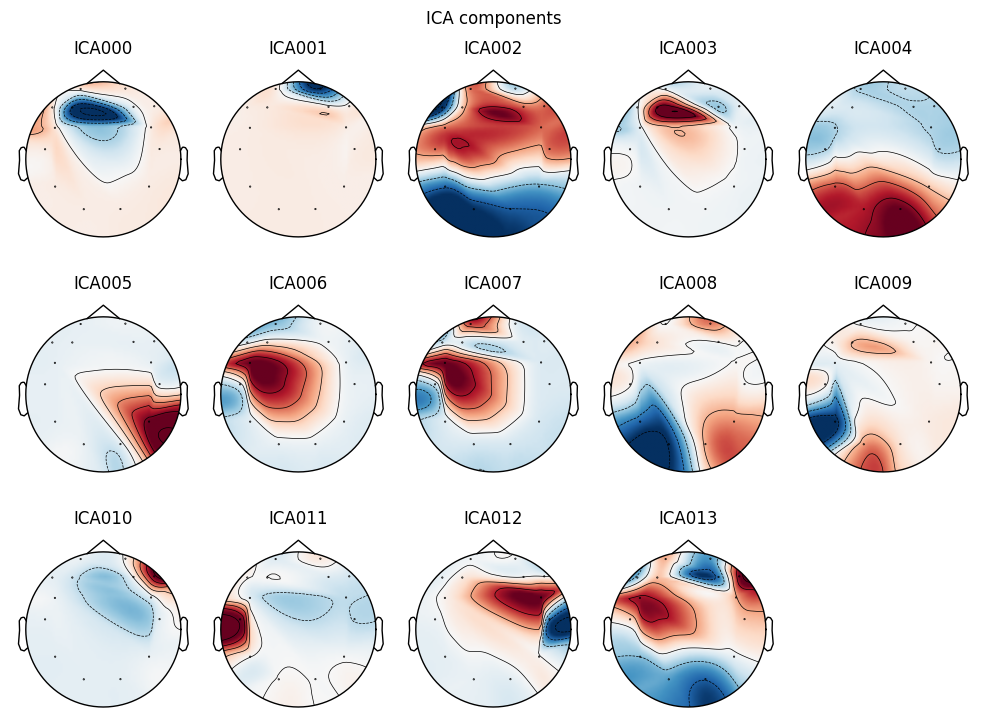

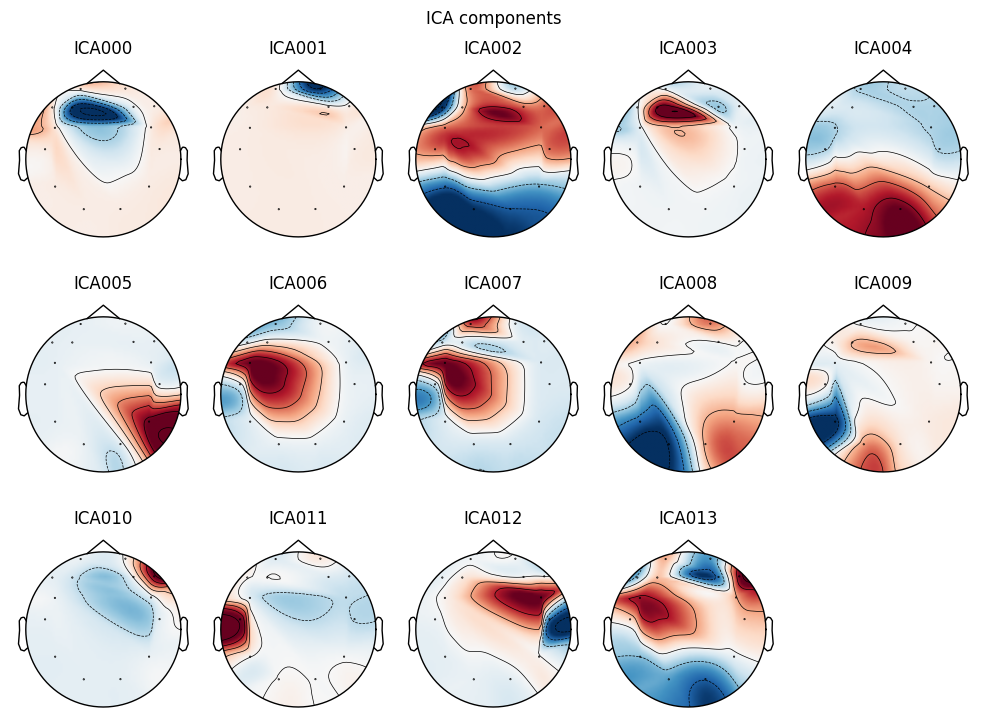

In [ ]:
ica.plot_components()


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1658 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1658 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1658 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1658 matching events found
No baseline correction applied
0 projection items activated


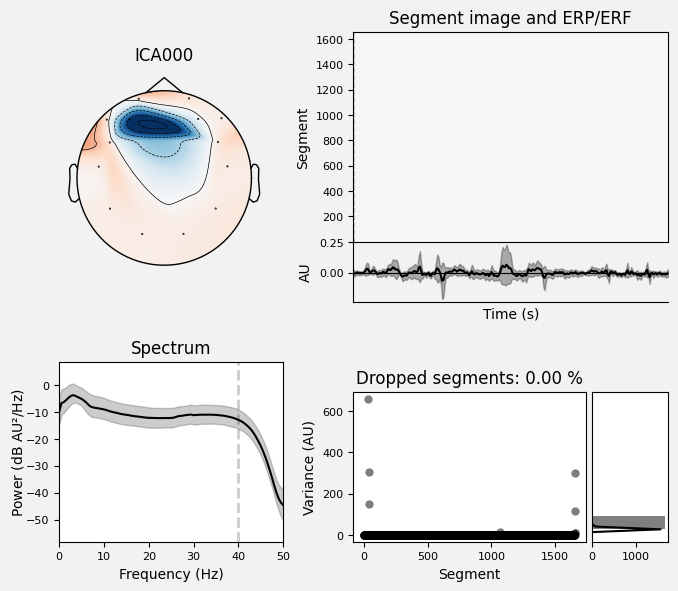

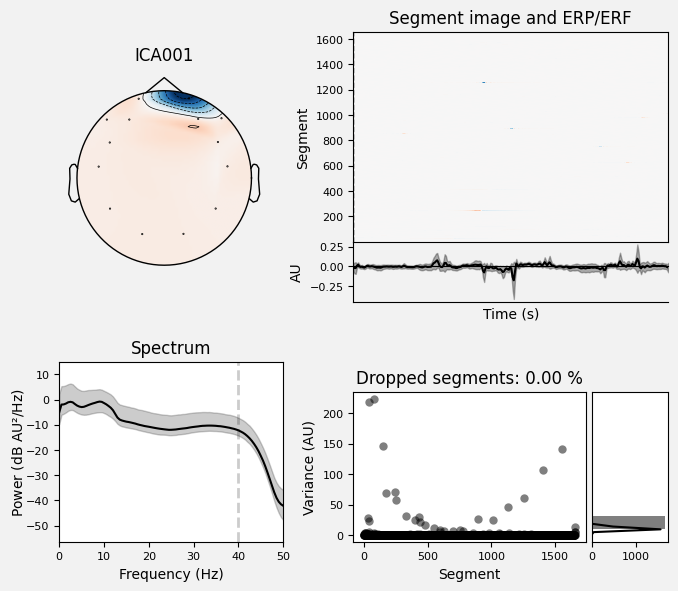

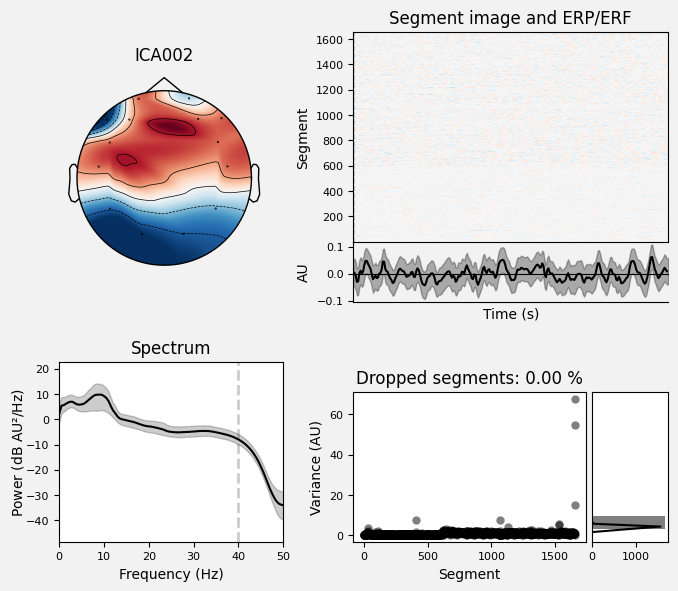

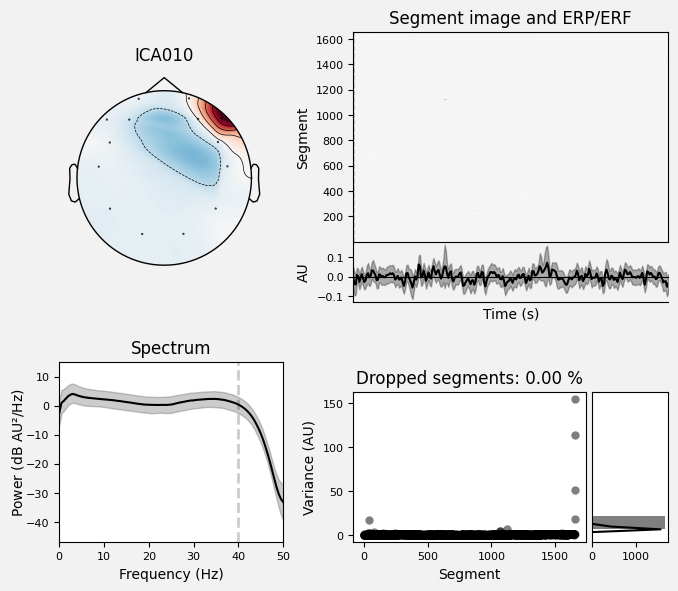

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(raw_original, picks=[0, 1, 2, 10])


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


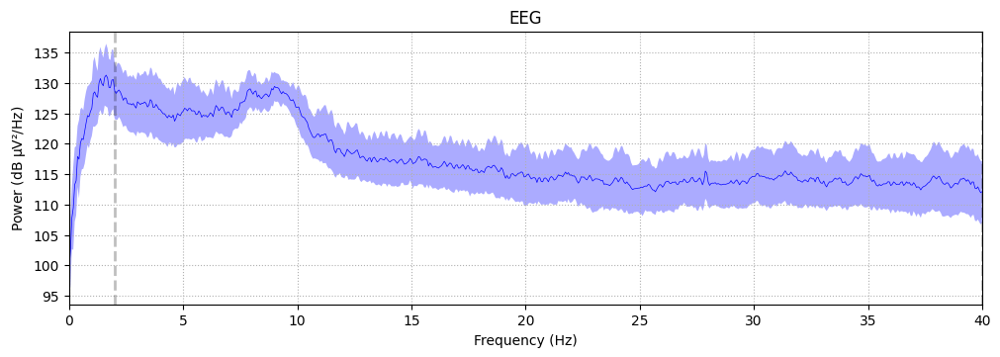

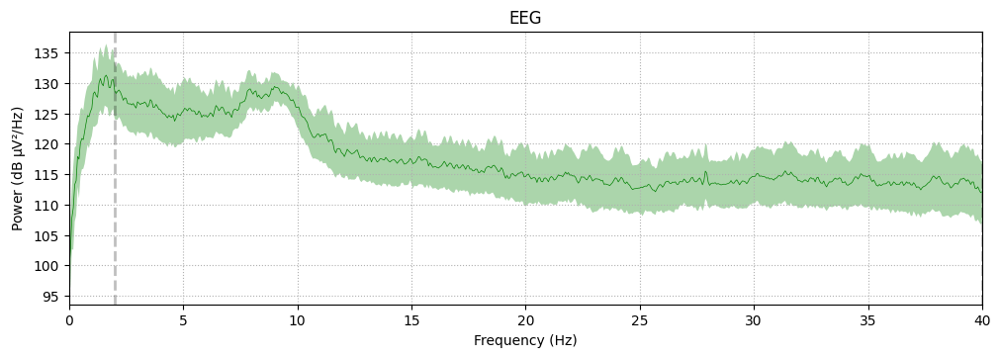

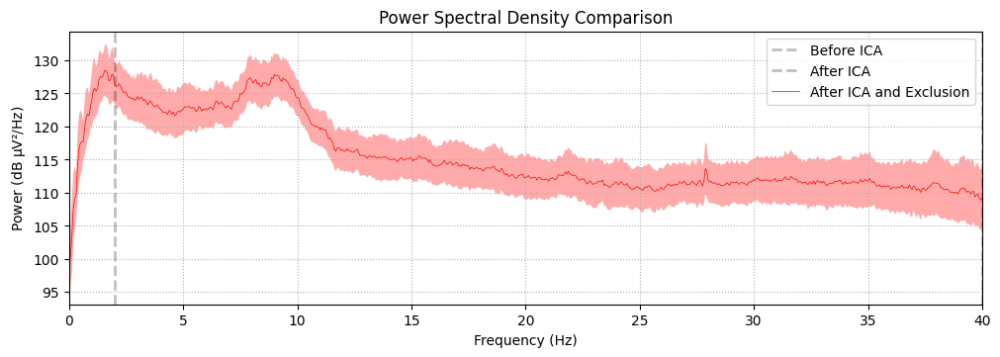

In [ ]:
import matplotlib.pyplot as plt

# Compute and plot PSD for uncleaned data
raw_original.plot_psd(fmax=40, picks='eeg', average=True, show=False, color='blue')

# Compute and plot PSD for cleaned data
cleaned.plot_psd(fmax=40, picks='eeg', average=True, show=False, color='green')

ica.exclude = [0,1, 10]
ica.apply(raw_original.copy()).plot_psd(fmax=40, picks='eeg', average=True, show=False, color='red')


plt.legend(['Before ICA', 'After ICA', 'After ICA and Exclusion'])
plt.title('Power Spectral Density Comparison')
plt.show()


In [ ]:
pick_channels = ['F7','F3','P7','O1','O2','P8', "T8", 'AF4']
ica.exclude = [0, 1, 10]
raw_clean = ica.apply(raw_original.copy())

from mne import make_fixed_length_epochs

epochs = make_fixed_length_epochs(raw_clean, duration=12.0, overlap=1.0)

import numpy as np
import pandas as pd

# Compute PSD using Welch method
psd = epochs.compute_psd(method="welch", fmin=2, fmax=40)


# Convert to dB
data = 10* np.log10(psd.get_data())
freqs = psd.freqs

# Define function to extract mean power in a band
def bandpower(data, freqs, fmin, fmax):
    band_idx = np.logical_and(freqs >= fmin, freqs <= fmax)
    return data[:, :, band_idx].mean(axis=2)

# Compute features
features = {
    'delta': bandpower(data, freqs, 2, 4),
    'theta': bandpower(data, freqs, 4, 8),
    'alpha': bandpower(data, freqs, 8, 12),
    'beta': bandpower(data, freqs, 12, 30),
    'gamma': bandpower(data, freqs, 30, 40),
}

# Flatten features
X = np.hstack([features[band] for band in features])
feature_names = [f"{band}_{ch}" for band in features for ch in raw_clean.ch_names]
df_features = pd.DataFrame(X, columns=feature_names)


Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components
Not setting metadata
301 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 301 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)


In [ ]:
start_times = epochs.events[:, 0] / raw.info['sfreq']  # convert sample indices to seconds
labels = []
for t in start_times:
    if t < 600:
        labels.append(2)
    elif t < 1200:
        labels.append(1)
    else:
        labels.append(0)


df_features['Mental_State'] = labels

label_map = {'focused': 2, 'unfocused': 1, 'drowsy': 0}
df_features['label_id'] = df_features['label'].map(label_map)


In [ ]:
df_features.label.value_counts()

,count
label,
drowsy,191
focused,55
unfocused,55


In [ ]:
df_features.head()

,delta_AF3,delta_F7,delta_F3,delta_FC5,delta_T7,delta_P7,delta_O1,delta_O2,delta_P8,delta_T8,...,gamma_O1,gamma_O2,gamma_P8,gamma_T8,gamma_FC6,gamma_F4,gamma_F8,gamma_AF4,label,label_id
0,1.373638,-2.593780,-4.766462,1.094191,0.909793,7.300815,7.668371,8.686982,1.365284,1.051811,...,-10.366186,-10.076638,-11.218236,-17.272237,-17.452703,-12.551841,-17.276436,-16.507162,focused,2
1,1.621840,1.388803,-3.182816,1.651443,2.185272,7.092347,9.129349,11.121178,4.003349,2.147833,...,-10.374235,-8.428371,-10.927314,-16.445597,-16.982856,-12.381136,-16.440014,-16.114248,focused,2
2,1.115774,0.727444,-5.802565,1.094073,1.561026,6.355444,6.795149,9.964624,6.865067,1.607728,...,-9.252894,-10.714902,-10.596314,-17.787248,-17.754179,-13.699118,-17.492846,-15.487922,focused,2
3,1.273054,-0.356077,-1.429079,1.135259,0.426966,8.000574,8.864054,10.056005,3.217492,0.521411,...,-11.408005,-11.434020,-11.212603,-18.511057,-18.704360,-12.941064,-18.137282,-16.668585,focused,2
4,2.880212,0.812869,-6.720900,1.669249,4.118744,7.206273,8.455984,11.752947,5.208800,2.653055,...,-10.103074,-9.067016,-9.287890,-17.293993,-17.412619,-16.386295,-17.651534,-15.655267,focused,2


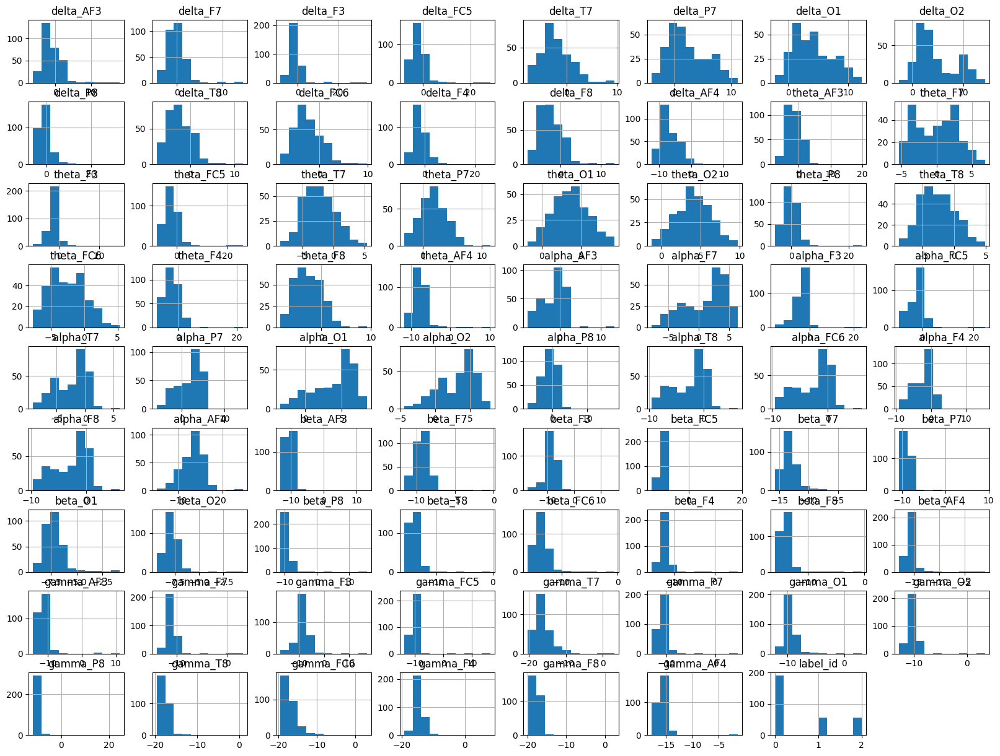

In [ ]:
df_features.hist(figsize=(20,15))
plt.show()

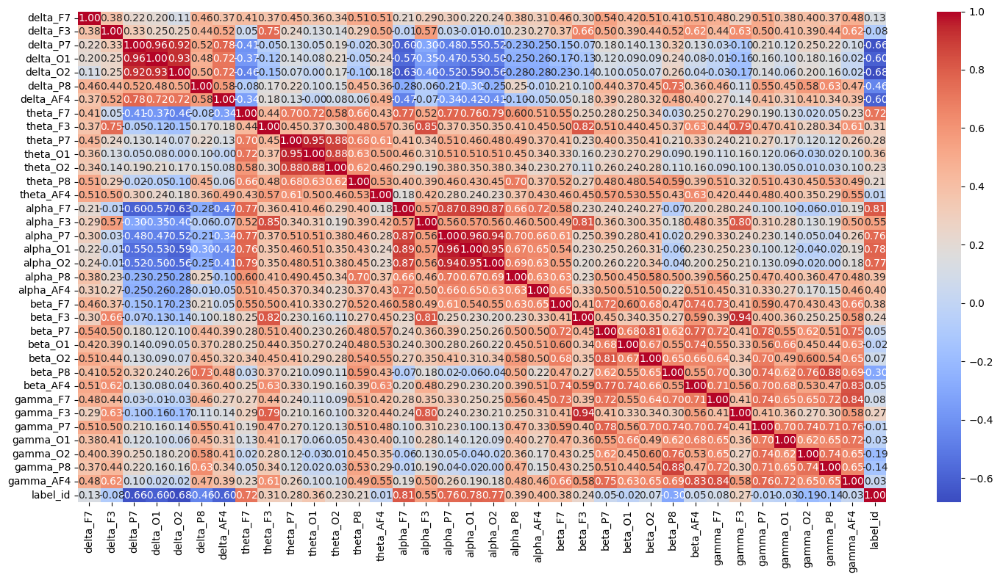

In [ ]:
import seaborn as sns
plt.figure(figsize=(15, 8))
sns.heatmap(df_features.corr(numeric_only=True), annot=True, fmt=".2f", cmap="coolwarm")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X = df_features.drop(["label", "label_id"], axis=1)
y = df_features["label_id"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=400, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))

Accuracy: 0.9180327868852459
F1: 0.9145710350427994
              precision    recall  f1-score   support

           0       0.90      1.00      0.95        36
           1       0.93      0.87      0.90        15
           2       1.00      0.70      0.82        10

    accuracy                           0.92        61
   macro avg       0.94      0.86      0.89        61
weighted avg       0.92      0.92      0.91        61



In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel="linear")

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.9672131147540983
F1: 0.9668939922228657
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        36
           1       0.93      0.93      0.93        15
           2       1.00      0.90      0.95        10

    accuracy                           0.97        61
   macro avg       0.97      0.94      0.96        61
weighted avg       0.97      0.97      0.97        61

[[36  0  0]
 [ 1 14  0]
 [ 0  1  9]]


In [ ]:
df_features.columns

Index(['delta_AF3', 'delta_F7', 'delta_F3', 'delta_FC5', 'delta_T7',
       'delta_P7', 'delta_O1', 'delta_O2', 'delta_P8', 'delta_T8', 'delta_FC6',
       'delta_F4', 'delta_F8', 'delta_AF4', 'theta_AF3', 'theta_F7',
       'theta_F3', 'theta_FC5', 'theta_T7', 'theta_P7', 'theta_O1', 'theta_O2',
       'theta_P8', 'theta_T8', 'theta_FC6', 'theta_F4', 'theta_F8',
       'theta_AF4', 'alpha_AF3', 'alpha_F7', 'alpha_F3', 'alpha_FC5',
       'alpha_T7', 'alpha_P7', 'alpha_O1', 'alpha_O2', 'alpha_P8', 'alpha_T8',
       'alpha_FC6', 'alpha_F4', 'alpha_F8', 'alpha_AF4', 'beta_AF3', 'beta_F7',
       'beta_F3', 'beta_FC5', 'beta_T7', 'beta_P7', 'beta_O1', 'beta_O2',
       'beta_P8', 'beta_T8', 'beta_FC6', 'beta_F4', 'beta_F8', 'beta_AF4',
       'gamma_AF3', 'gamma_F7', 'gamma_F3', 'gamma_FC5', 'gamma_T7',
       'gamma_P7', 'gamma_O1', 'gamma_O2', 'gamma_P8', 'gamma_T8', 'gamma_FC6',
       'gamma_F4', 'gamma_F8', 'gamma_AF4', 'label', 'label_id'],
      dtype='object')

In [ ]:
df_features_extracted = pd.DataFrame(df_features[[col for col in df_features.columns if "theta" in col]].mean(axis=1), columns=["theta"])
df_features_extracted["alpha"] = df_features[[col for col in df_features.columns if "alpha" in col]].mean(axis=1)
df_features_extracted["beta"] = df_features[[col for col in df_features.columns if "beta" in col]].mean(axis=1)
df_features_extracted["gamma"] = df_features[[col for col in df_features.columns if "gamma" in col]].mean(axis=1)

df_features_extracted["label_id"] = df_features["label_id"]

df_features_extracted.head()

,theta,alpha,beta,gamma,label_id
0,-1.453656,-5.332934,-11.385730,-13.042378,2
1,-0.663977,-5.505674,-11.404075,-12.724437,2
2,-2.099993,-7.018662,-12.457597,-13.236430,2
3,-3.406514,-5.966057,-11.356582,-13.735855,2
4,-3.470086,-4.174126,-10.591077,-12.834870,2


In [ ]:
df_features_extracted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 301 entries, 0 to 300
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   theta     301 non-null    float64
 1   alpha     301 non-null    float64
 2   beta      301 non-null    float64
 3   gamma     301 non-null    float64
 4   label_id  301 non-null    int64  
dtypes: float64(4), int64(1)
memory usage: 11.9 KB


In [ ]:
X = df_features_extracted.drop("label_id", axis=1)
y = df_features_extracted["label_id"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=400, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.8032786885245902
F1: 0.7900420450032184
              precision    recall  f1-score   support

           0       0.90      1.00      0.95        36
           1       0.69      0.60      0.64        15
           2       0.50      0.40      0.44        10

    accuracy                           0.80        61
   macro avg       0.70      0.67      0.68        61
weighted avg       0.78      0.80      0.79        61

[[36  0  0]
 [ 2  9  4]
 [ 2  4  4]]


In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel="linear", random_state=42)

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.819672131147541
F1: 0.8033961516154846
              precision    recall  f1-score   support

           0       0.88      1.00      0.94        36
           1       0.71      0.67      0.69        15
           2       0.67      0.40      0.50        10

    accuracy                           0.82        61
   macro avg       0.75      0.69      0.71        61
weighted avg       0.80      0.82      0.80        61

[[36  0  0]
 [ 3 10  2]
 [ 2  4  4]]


In [ ]:
df_features_extracted_engineered = df_features_extracted.copy()

#FE

df_features_extracted_engineered["ABTR"] = df_features_extracted_engineered["beta"] / (df_features_extracted_engineered["theta"] + df_features_extracted_engineered["alpha"])
df_features_extracted_engineered["AGR"] = df_features_extracted_engineered["alpha"] / df_features_extracted_engineered["gamma"]
df_features_extracted_engineered["TBR"] = df_features_extracted_engineered["theta"] / df_features_extracted_engineered["beta"]
df_features_extracted_engineered["BTR"] = df_features_extracted_engineered["beta"] / df_features_extracted_engineered["theta"]
df_features_extracted_engineered["BAR"] = df_features_extracted_engineered["beta"] / df_features_extracted_engineered["alpha"]

df_features_extracted_engineered.head()

,theta,alpha,beta,gamma,label_id,ABTR,AGR,TBR,BTR,BAR
0,-1.453656,-5.332934,-11.385730,-13.042378,2,1.677680,0.408893,0.127674,7.832477,2.134984
1,-0.663977,-5.505674,-11.404075,-12.724437,2,1.848415,0.432685,0.058223,17.175407,2.071331
2,-2.099993,-7.018662,-12.457597,-13.236430,2,1.366166,0.530253,0.168571,5.932208,1.774925
3,-3.406514,-5.966057,-11.356582,-13.735855,2,1.211683,0.434342,0.299959,3.333784,1.903532
4,-3.470086,-4.174126,-10.591077,-12.834870,2,1.385503,0.325218,0.327642,3.052108,2.537316


In [ ]:
X = df_features_extracted_engineered.drop("label_id", axis=1)
y = df_features_extracted_engineered["label_id"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=500, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.8032786885245902
F1: 0.7884250348443619
              precision    recall  f1-score   support

           0       0.86      1.00      0.92        36
           1       0.80      0.53      0.64        15
           2       0.56      0.50      0.53        10

    accuracy                           0.80        61
   macro avg       0.74      0.68      0.70        61
weighted avg       0.79      0.80      0.79        61

[[36  0  0]
 [ 3  8  4]
 [ 3  2  5]]


In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel="linear", random_state=42)

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1_score(y_test, y_pred, average="weighted"))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.7704918032786885
F1: 0.7483454079403936
              precision    recall  f1-score   support

           0       0.86      1.00      0.92        36
           1       0.67      0.53      0.59        15
           2       0.43      0.30      0.35        10

    accuracy                           0.77        61
   macro avg       0.65      0.61      0.62        61
weighted avg       0.74      0.77      0.75        61

[[36  0  0]
 [ 3  8  4]
 [ 3  4  3]]


In [ ]:
def sort_strings_by_number(string_list):
    return sorted(string_list, key=lambda x: int(''.join(filter(str.isdigit, x))))
sorted_files = sort_strings_by_number(os.listdir(path_to_data))

df_subject5 = pd.DataFrame()

for file in sorted_files[-6:]:
  file_path = os.path.join(path_to_data, file)
  temp_data = sio.loadmat(file_path)
  temp_df = pd.DataFrame(temp_data["o"]["data"][0,0], columns=cols)

  df_subject5 = pd.concat((df_subject5, temp_df))

df_subject5.head()

,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,ED_O1,...,ED_F8,ED_AF4,ED_GYROX,ED_GYROY,ED_TIMESTAMP,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL
0,25.0,0.0,0.0,4432.820513,3955.384615,4859.487179,3829.743590,4041.538462,4350.256410,4352.307692,...,4332.307692,4050.256410,1566.0,1723.0,781.160,0.031277,0.0,0.0,0.0,0.0
1,26.0,0.0,0.0,4434.871795,3957.435897,4863.589744,3833.333333,4041.538462,4349.230769,4353.333333,...,4333.846154,4050.769231,1567.0,1723.0,781.167,0.031277,0.0,0.0,0.0,0.0
2,27.0,0.0,0.0,4435.897436,3955.897436,4862.051282,3827.179487,4042.564103,4341.025641,4348.717949,...,4334.358974,4047.179487,1567.0,1723.0,781.175,0.031277,0.0,0.0,0.0,0.0
3,28.0,0.0,0.0,4433.333333,3948.205128,4851.282051,3824.102564,4042.051282,4331.794872,4336.923077,...,4331.282051,4041.538462,1567.0,1724.0,781.183,0.031277,0.0,0.0,0.0,0.0
4,29.0,0.0,0.0,4434.871795,3943.076923,4842.051282,3828.205128,4040.000000,4327.692308,4332.307692,...,4331.282051,4037.948718,1566.0,1723.0,781.191,0.031277,0.0,0.0,0.0,0.0


In [ ]:
df_subject5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2578548 entries, 0 to 408975
Data columns (total 25 columns):
 #   Column           Dtype  
---  ------           -----  
 0   ED_COUNTER       float64
 1   ED_INTERPOLATED  float64
 2   ED_RAW_CQ        float64
 3   ED_AF3           float64
 4   ED_F7            float64
 5   ED_F3            float64
 6   ED_FC5           float64
 7   ED_T7            float64
 8   ED_P7            float64
 9   ED_O1            float64
 10  ED_O2            float64
 11  ED_P8            float64
 12  ED_T8            float64
 13  ED_FC6           float64
 14  ED_F4            float64
 15  ED_F8            float64
 16  ED_AF4           float64
 17  ED_GYROX         float64
 18  ED_GYROY         float64
 19  ED_TIMESTAMP     float64
 20  ED_ES_TIMESTAMP  float64
 21  ED_FUNC_ID       float64
 22  ED_FUNC_VALUE    float64
 23  ED_MARKER        float64
 24  ED_SYNC_SIGNAL   float64
dtypes: float64(25)
memory usage: 511.5 MB


In [ ]:
def apply_ica(df):
  rename_dict = {
      'ED_AF3': 'AF3',
      'ED_F7': 'F7',
      'ED_F3': 'F3',
      'ED_FC5': 'FC5',
      'ED_T7': 'T7',
      'ED_P7': 'P7',
      'ED_O1': 'O1',
      'ED_O2': 'O2',
      'ED_P8': 'P8',
      'ED_T8': 'T8',
      'ED_FC6': 'FC6',
      'ED_F4': 'F4',
      'ED_F8': 'F8',
      'ED_AF4': 'AF4'
  }

  # 1. Rename columns in DataFrame
  temp_df_renamed = df.rename(columns=rename_dict)
  temp_df_filtered = temp_df_renamed.iloc[:, 3:17]

  # 2. Define channel names
  channel_names = list(temp_df_filtered.columns)  # ['AF3', 'F7', ...]

  # 3. Create info
  sfreq = 128.0
  channel_types = ['eeg'] * len(channel_names)
  info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types=channel_types)

  # 4. Apply montage after matching names
  montage = mne.channels.make_standard_montage('standard_1020')
  info.set_montage(montage)

  # 5. Create Raw object
  raw = mne.io.RawArray(data=temp_df_renamed[channel_names].T, info=info)

  # 2. Re-reference to average
  raw.set_eeg_reference('average', projection=False)

  # 3. Resample
  raw.resample(128, npad="auto")

  # 4. Band-pass filter
  raw.filter(2., 40.)

  raw_original = raw.copy()

  # 5. ICA for artifact removal
  ica = mne.preprocessing.ICA(n_components=14, random_state=97)
  ica.fit(raw_original)

  return (ica, raw_original)

In [ ]:
ica, raw_original = apply_ica(df_subject5)

Creating RawArray with float64 data, n_channels=14, n_times=2578548
    Range : 0 ... 2578547 =      0.000 ... 20144.898 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    8.6s finished


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


<ipython-input-233-627597c4b49b>:51: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (5) and smallest (1.7e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 215.3s.


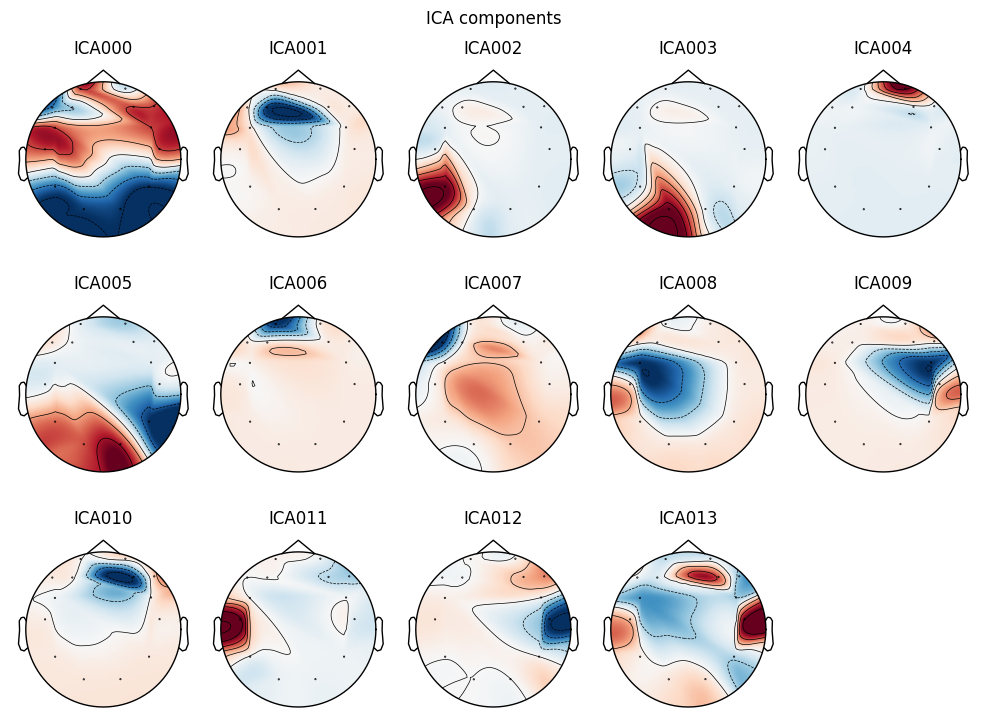

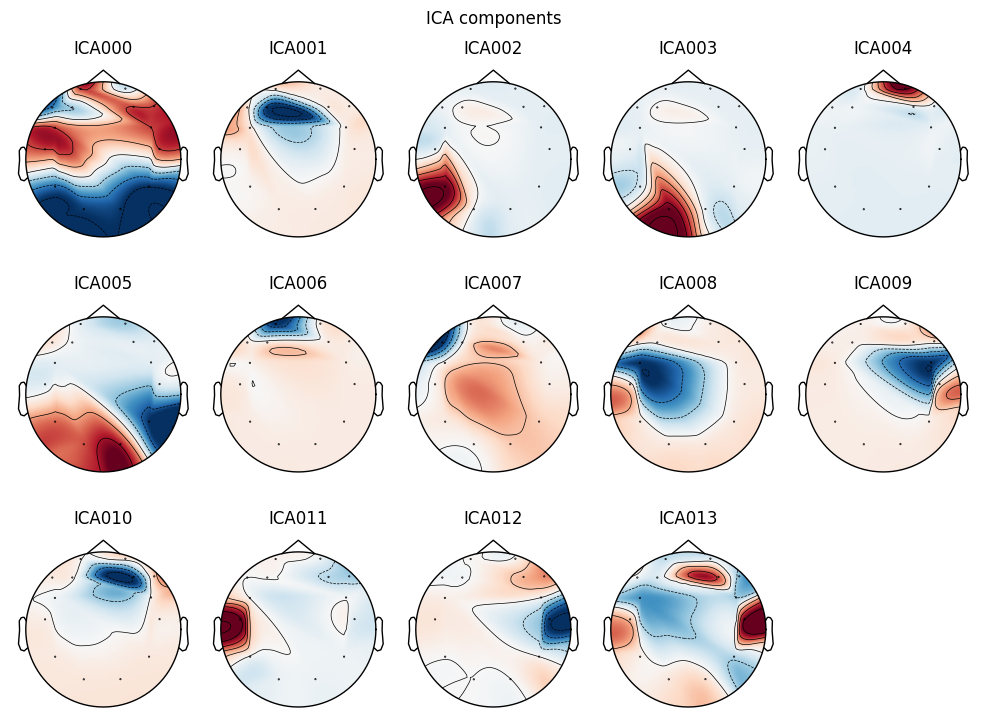

In [ ]:
ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
10072 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
10072 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
10072 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
10072 matching events found
No baseline correction applied
0 projection items activated


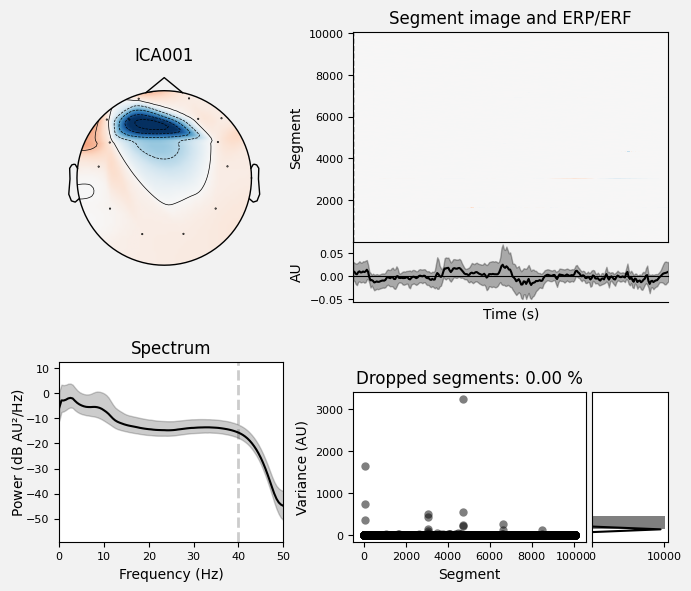

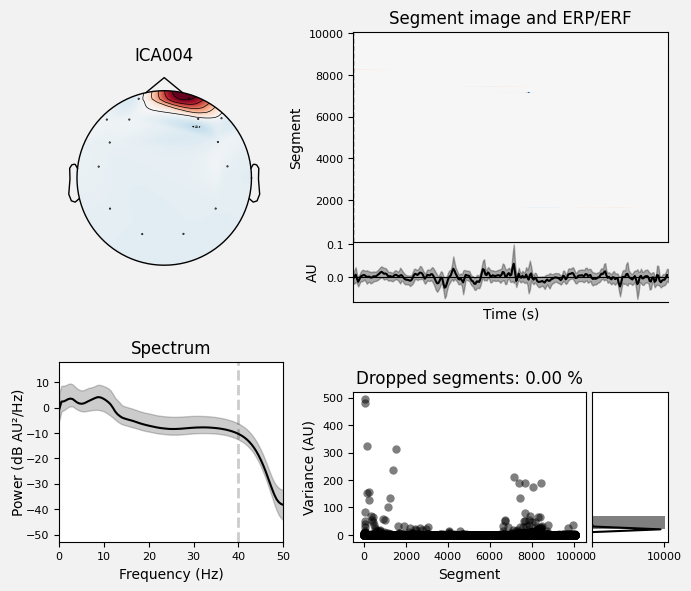

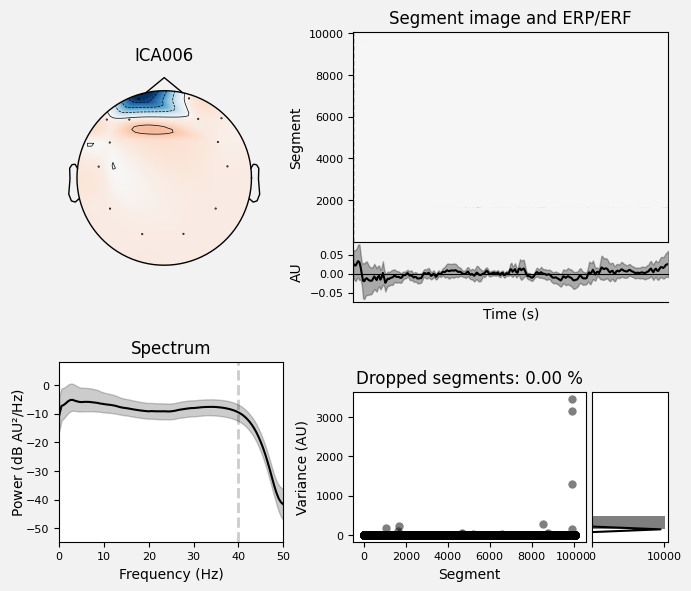

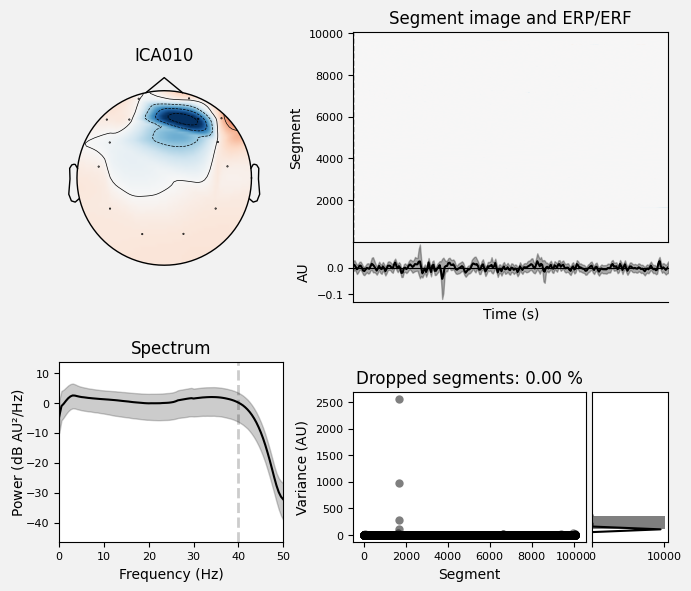

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(raw_original, picks=[1, 4, 6, 10])

In [ ]:
os.listdir(path_to_data)

['eeg_record30.mat',
 'eeg_record7.mat',
 'eeg_record26.mat',
 'eeg_record22.mat',
 'eeg_record18.mat',
 'eeg_record19.mat',
 'eeg_record23.mat',
 'eeg_record15.mat',
 'eeg_record34.mat',
 'eeg_record21.mat',
 'eeg_record1.mat',
 'eeg_record5.mat',
 'eeg_record27.mat',
 'eeg_record8.mat',
 'eeg_record16.mat',
 'eeg_record11.mat',
 'eeg_record31.mat',
 'eeg_record17.mat',
 'eeg_record6.mat',
 'eeg_record24.mat',
 'eeg_record25.mat',
 'eeg_record28.mat',
 'eeg_record14.mat',
 'eeg_record12.mat',
 'eeg_record33.mat',
 'eeg_record13.mat',
 'eeg_record4.mat',
 'eeg_record9.mat',
 'eeg_record3.mat',
 'eeg_record32.mat',
 'eeg_record10.mat',
 'eeg_record2.mat',
 'eeg_record20.mat',
 'eeg_record29.mat']

# Clean Notebook: Loading Data

In [ ]:
# Library Import
from google.colab import drive
from collections import Counter
import kagglehub
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly

import scipy.io as sio

!pip install mne
!pip install mne_icalabel
!pip install optuna
import mne
import optuna
from mne_icalabel import label_components
from mne import make_fixed_length_epochs
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

import joblib

drive.mount('/content/drive')


def compute_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="weighted")
    classification_rep = classification_report(y_true, y_pred)
    confusion = confusion_matrix(y_true, y_pred)

    return accuracy, f1, classification_rep, confusion


def average_bands(df):
    df_features_extracted = df.copy()

    df_features_extracted["theta"] = df_features_extracted[[col for col in df_features_extracted.columns if "theta" in col]].mean(axis=1)
    df_features_extracted["alpha"] = df_features_extracted[[col for col in df_features_extracted.columns if "alpha" in col]].mean(axis=1)
    df_features_extracted["beta"] = df_features_extracted[[col for col in df_features_extracted.columns if "beta" in col]].mean(axis=1)
    df_features_extracted["gamma"] = df_features_extracted[[col for col in df_features_extracted.columns if "gamma" in col]].mean(axis=1)

    return df_features_extracted



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.6/21.6 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 17.8 MB/s eta 0:00:00
Mounted at /content/drive


In [ ]:
# Download latest version
path = kagglehub.dataset_download("inancigdem/eeg-data-for-mental-attention-state-detection")

print("Path to dataset files:", path)

path_to_data = path +"/EEG Data"
print(os.listdir(path_to_data))

100%|██████████| 557M/557M [00:18<00:00, 32.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1
['eeg_record29.mat', 'eeg_record16.mat', 'eeg_record27.mat', 'eeg_record22.mat', 'eeg_record10.mat', 'eeg_record32.mat', 'eeg_record9.mat', 'eeg_record2.mat', 'eeg_record21.mat', 'eeg_record3.mat', 'eeg_record13.mat', 'eeg_record1.mat', 'eeg_record26.mat', 'eeg_record33.mat', 'eeg_record17.mat', 'eeg_record14.mat', 'eeg_record15.mat', 'eeg_record30.mat', 'eeg_record12.mat', 'eeg_record25.mat', 'eeg_record19.mat', 'eeg_record6.mat', 'eeg_record20.mat', 'eeg_record28.mat', 'eeg_record31.mat', 'eeg_record18.mat', 'eeg_record24.mat', 'eeg_record5.mat', 'eeg_record34.mat', 'eeg_record11.mat', 'eeg_record4.mat', 'eeg_record7.mat', 'eeg_record23.mat', 'eeg_record8.mat']


In [ ]:
# Define DataTransformer for easy data retrieval
class Subject():
  def __init__(self, subject_id):
    self.subject_id = subject_id
    self.df_subject = None
    self.ica = None
    self.raw_original = None
    self.epoch = None
    self.exp_durations_sec = None

  def __str__(self):
    return f"Subject {self.subject_id}"

  def get_df(self):
    return self.df_subject if self.df_subject else f"There is no dataframe for Subject {str(self.subject_id)}"

  def get_ica(self):
    return self.ica if self.ica else f"There is no ICA for Subject {str(self.subject_id)}"

  def get_raw_original(self):
    return self.raw_original if self.raw_original else f"There is no raw_original for Subject {str(self.subject_id)}"


class DataTransformer():
  def __init__(self, path_to_data):
    self.path_to_data = path_to_data
    self.ica = None
    self.raw_original = None
    self.df_cols = cols = [
        "ED_COUNTER",
        'ED_INTERPOLATED',
      'ED_RAW_CQ',
    'AF3',
    'F7',
    'F3',
    'FC5',
    'T7',
    'P7',
    'O1',
    'O2',
    'P8',
    'T8',
    'FC6',
    'F4',
    'F8',
    'AF4',
    'ED_GYROX',
    'ED_GYROY',
    'ED_TIMESTAMP',
    'ED_ES_TIMESTAMP',
    'ED_FUNC_ID',
    'ED_FUNC_VALUE',
    'ED_MARKER',
    'ED_SYNC_SIGNAL'
    ]
    self.subjects = [Subject(i) for i in range (1,6)]

  def _sort_strings_by_number(self, string_list):
    return sorted(string_list, key=lambda x: int(''.join(filter(str.isdigit, x))))

  def get_subject_data(self, subject_id, include_habituation=True):
    """
    This function retrieves the data per requested subject of the experiments
    Args:
    subject_id: int - the id of the subject
    include_habituation: - whether to include the data from first 2 experiments
                            which were used for habituation of the subject
    """

    subject = self.subjects[subject_id - 1]
    subject.exp_durations_sec = []

    if subject.df_subject is None:
      if include_habituation:
        start_index = (subject_id - 1) * 7
        end_index = start_index + 8
      else:
        start_index = (subject_id - 1) * 7 + 3
        end_index = start_index + 5
        # print((start_index, end_index))
      sorted_files = self._sort_strings_by_number(os.listdir(path_to_data))
      df_subject = pd.DataFrame()
      for file_id in range(start_index, end_index):
        # print(file_id)
        try:
          file = sorted_files[file_id-1]
          file_path = os.path.join(path_to_data, file)
          # print(file_path)
          temp_df = pd.DataFrame(sio.loadmat(file_path)["o"]["data"][0,0], columns=self.df_cols)
          duration = temp_df.shape[0] / 128.0
          subject.exp_durations_sec.append(duration)
          # print(f"Temporal df length: {len(temp_df)}")
          # print("-------------")
          df_subject = pd.concat((df_subject, temp_df))
          # print(f"Concatenated df length: {len(df_subject)}")
        except Exception as e:
          print(e)
          continue
      subject.df_subject = df_subject
      print(f"Data for Subject {str(subject_id)} is successfully retrieved")
      print(f"Subject {subject_id} has {len(df_subject)} rows")
    else:
      df_subject = subject.df_subject
      print(f"Data for Subject {str(subject_id)} has already been retrieved")
      print(f"Subject {subject_id} has {len(df_subject)} rows")



    return df_subject


  def preprocess_apply_ica(self, subject_id):
    """
    This function will apply the preprocessing steps and ICA to the requested subject
    NOTE: it will only do so if the dataframe exists
    Args:
    subject_id: int - the id of the subject

    """
    subject = self.subjects[subject_id - 1]
    if subject.df_subject is None:
      subject.df_subject = self.get_subject_data(subject_id)
      temp_df = subject.df_subject
    else:
      temp_df = subject.df_subject

    if not subject.ica and not subject.raw_original:
      temp_df_filtered = temp_df.iloc[:, 3:17]


      channel_names = list(temp_df_filtered.columns)  # ['AF3', 'F7', ...]

      # create info
      sfreq = 128.0
      channel_types = ['eeg'] * len(channel_names)
      info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types=channel_types)

      # set up montage for data viz
      montage = mne.channels.make_standard_montage('standard_1020')
      info.set_montage(montage)

      # create raw
      raw = mne.io.RawArray(data=temp_df[channel_names].T, info=info)

      # average the signals
      raw.set_eeg_reference('average', projection=False)

      # resample to 128hz
      raw.resample(128, npad="auto")

      # filter the signals from 2 to 40 since there is no significant info after 40
      raw.filter(2., 40.)

      raw_original = raw.copy()

      # apply ica for artifact removal
      ica = mne.preprocessing.ICA(n_components=14, random_state=97)
      ica.fit(raw_original)
      subject.ica = ica
      subject.raw_original = raw_original

    else:
      ica = subject.ica
      raw_original = subject.raw_original

    return "Done"

  def extract_features_df(self, subject_id, pick_channels=None, exclude_ica = None, epoch_duration = 12, average_bands=False):
    subject = self.subjects[subject_id - 1]
    if subject.df_subject is None:
      raise TypeError("No data for the subject")
      return None

    if subject.ica is None or subject.raw_original is None:
      raise TypeError("No ICA for the subject")
      return None

    if pick_channels:
      raw_clean = subject.raw_original.copy()
      raw_clean.pick_channels(pick_channels)
    else:
      raw_clean = subject.raw_original.copy()

    if exclude_ica is not None:
      #subject.ica.exclude = exclude_ica
      subject.ica.apply(raw_clean, exclude=exclude_ica)

    subject.epoch = make_fixed_length_epochs(raw_clean, duration=epoch_duration, overlap=1.0)


    # Compute PSD using Welch method
    psd = subject.epoch.compute_psd(method="welch", fmin=2, fmax=40)


    # Convert to dB
    data = 10* np.log10(psd.get_data())
    freqs = psd.freqs


    # Compute features
    features = {
        'delta': self._bandpower(data, freqs, 2, 4),
        'theta': self._bandpower(data, freqs, 4, 8),
        'alpha': self._bandpower(data, freqs, 8, 12),
        'beta': self._bandpower(data, freqs, 12, 30),
        'gamma': self._bandpower(data, freqs, 30, 40),
    }

    # Flatten features
    X = np.hstack([features[band] for band in features])
    feature_names = [f"{band}_{ch}" for band in features for ch in raw_clean.ch_names]
    df_features = pd.DataFrame(X, columns=feature_names)





    start_times = subject.epoch.events[:, 0] / raw_clean.info['sfreq']  # convert sample indices to seconds
    labels = []
    exp_starts = np.cumsum([0] + subject.exp_durations_sec[:-1])  # cumulative start times per experiment

    for t in start_times:
        for i, exp_start in enumerate(exp_starts):
            exp_end = exp_start + subject.exp_durations_sec[i]
            if exp_start <= t < exp_end:
                rel_t = t - exp_start
                if rel_t < 600:
                    labels.append(2)
                elif rel_t < 1200:
                    labels.append(1)
                else:
                    labels.append(0)
                break
    df_features["Mental_State"] = labels
    print(f"Label counts for Subject {subject_id}: {Counter(labels)}")

    if average_bands:
      df_features_extracted = pd.DataFrame(df_features[[col for col in df_features.columns if "theta" in col]].mean(axis=1), columns=["theta"])
      df_features_extracted["alpha"] = df_features[[col for col in df_features.columns if "alpha" in col]].mean(axis=1)
      df_features_extracted["beta"] = df_features[[col for col in df_features.columns if "beta" in col]].mean(axis=1)
      df_features_extracted["gamma"] = df_features[[col for col in df_features.columns if "gamma" in col]].mean(axis=1)
      df_features_extracted["Mental_State"] = df_features["Mental_State"]
      return df_features_extracted


    return df_features

  def _bandpower(self, data, freqs, fmin, fmax):
    """
    This functions calculates the bandpower for each source within fmin and fmax frequencies
    from precomputed Power Spectrum Density
    Args:
    data: np.array - data
    freqs: np.array - frequencies only array
    fmin: float - minimum frequency
    fmax: float - maximum frequency

    """
    band_idx = np.logical_and(freqs >= fmin, freqs <= fmax)
    return data[:, :, band_idx].mean(axis=2)

# Baseline Model

## Window 12s

In [ ]:
dfs = []

dt = DataTransformer(path_to_data)

for i in range(1, 6):
  dt.get_subject_data(i, include_habituation=False)

for i in range(1, 6):
  dt.preprocess_apply_ica(i)

for i in range(1, 6):
  _ = dt.extract_features_df(i, epoch_duration=12, average_bands=False)
  dfs.append(_)

del _


df_features = pd.concat(dfs)



In [ ]:
df_features.head()

,delta_AF3,delta_F7,delta_F3,delta_FC5,delta_T7,delta_P7,delta_O1,delta_O2,delta_P8,delta_T8,...,gamma_P7,gamma_O1,gamma_O2,gamma_P8,gamma_T8,gamma_FC6,gamma_F4,gamma_F8,gamma_AF4,Mental_State
0,6.868219,8.645127,5.948693,5.078062,6.149558,2.827056,11.933742,11.161580,7.135535,6.271216,...,-9.342495,-7.315985,-6.280513,-6.998829,-9.906787,-8.686138,-10.460230,-9.370567,-8.236102,2
1,5.255060,8.691159,2.853877,4.770451,4.273028,9.542024,9.192182,12.518804,6.175780,3.726922,...,-9.868849,-7.649291,-8.041114,-7.372442,-11.386907,-7.878739,-11.575677,-11.186844,-8.745388,2
2,5.158439,4.997527,12.767639,9.579654,2.245923,10.786830,3.750235,5.630856,7.209139,0.455524,...,-5.763129,-8.815993,-7.627404,-4.428491,-9.751120,-7.851284,-10.461566,-10.401332,-9.282501,2
3,3.427413,6.663341,3.850163,2.325007,1.949176,5.736412,9.830448,7.806459,6.884996,3.196790,...,-8.877388,-6.385105,-8.592322,-9.403317,-11.666088,-9.568971,-12.946126,-12.491798,-8.974430,2
4,5.175155,8.203344,5.070730,4.546223,4.835093,7.754887,10.552698,12.124705,9.874860,4.855701,...,-9.893338,-8.807057,-6.447332,-9.071056,-11.941788,-9.555921,-12.249083,-12.259013,-7.377616,2


In [ ]:
df_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6391 entries, 0 to 1280
Data columns (total 71 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   delta_AF3     6391 non-null   float64
 1   delta_F7      6391 non-null   float64
 2   delta_F3      6391 non-null   float64
 3   delta_FC5     6391 non-null   float64
 4   delta_T7      6391 non-null   float64
 5   delta_P7      6391 non-null   float64
 6   delta_O1      6391 non-null   float64
 7   delta_O2      6391 non-null   float64
 8   delta_P8      6391 non-null   float64
 9   delta_T8      6391 non-null   float64
 10  delta_FC6     6391 non-null   float64
 11  delta_F4      6391 non-null   float64
 12  delta_F8      6391 non-null   float64
 13  delta_AF4     6391 non-null   float64
 14  theta_AF3     6391 non-null   float64
 15  theta_F7      6391 non-null   float64
 16  theta_F3      6391 non-null   float64
 17  theta_FC5     6391 non-null   float64
 18  theta_T7      6391 non-null   flo

In [ ]:
df_features.Mental_State.value_counts()

,count
Mental_State,
0,3768
1,1314
2,1309


In [ ]:
X, y = df_features.drop(columns=["Mental_State"]), df_features["Mental_State"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(n_estimators=350, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)
print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_rep)
print(confusion)

svc = SVC(kernel='linear', C=1)
svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_rep)
print(confusion)

Accuracy: 0.7857701329163409
F1: 0.7643848685808752
              precision    recall  f1-score   support

           0       0.77      0.96      0.86       732
           1       0.85      0.38      0.53       288
           2       0.79      0.73      0.76       259

    accuracy                           0.79      1279
   macro avg       0.81      0.69      0.72      1279
weighted avg       0.79      0.79      0.76      1279

[[706   9  17]
 [146 110  32]
 [ 59  11 189]]
Accuracy: 0.6591086786551994
F1: 0.5697955158882694
              precision    recall  f1-score   support

           0       0.66      0.95      0.78       732
           1       0.00      0.00      0.00       288
           2       0.64      0.58      0.61       259

    accuracy                           0.66      1279
   macro avg       0.44      0.51      0.46      1279
weighted avg       0.51      0.66      0.57      1279

[[692   0  40]
 [244   0  44]
 [108   0 151]]


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Window 12s - Focused and Unfocused class

In [ ]:
import pandas as pd
import numpy as np
from sklearn.utils import resample
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

df_features = average_bands(df_features)
df_features["ABTR"] = df_features["beta"] / (df_features["theta"] + df_features["alpha"])

X = df_features.drop(columns='Mental_State').values
y = df_features['Mental_State']
y = y.apply(lambda x: 1 if x == 2 else 0).values

# Prepare cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Track metrics across folds
all_y_true = []
all_y_pred = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    # Split data
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Create train DataFrame for upsampling
    df_train = pd.DataFrame(X_train)
    df_train['label'] = y_train

    # Separate classes
    df_majority = df_train[df_train['label'] == 0]
    df_minority = df_train[df_train['label'] == 1]

    # Upsample minority class
    df_minority_upsampled = resample(
        df_minority,
        replace=True,
        n_samples=len(df_majority),
        random_state=42
    )

    # Combine and shuffle
    df_train_bal = pd.concat([df_majority, df_minority_upsampled])
    df_train_bal = df_train_bal.sample(frac=1, random_state=42).reset_index(drop=True)

    # Split features and labels
    X_train_bal = df_train_bal.drop(columns='label').values
    y_train_bal = df_train_bal['label'].values

    # Train model
    clf = RandomForestClassifier(n_estimators=350, random_state=42)
    clf.fit(X_train_bal, y_train_bal)

    # Predict
    y_pred = clf.predict(X_test)

    # Track for full report
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"\nFold {fold} Report:")
    print(classification_report(y_test, y_pred, digits=3))

# Final cross-validation report
print("\n=== Overall Cross-Validation Report ===")
print(classification_report(all_y_true, all_y_pred, digits=3))



Fold 1 Report:
              precision    recall  f1-score   support

           0      0.903     0.970     0.935      1017
           1      0.834     0.595     0.695       262

    accuracy                          0.893      1279
   macro avg      0.869     0.782     0.815      1279
weighted avg      0.889     0.893     0.886      1279


Fold 2 Report:
              precision    recall  f1-score   support

           0      0.915     0.965     0.939      1016
           1      0.826     0.653     0.729       262

    accuracy                          0.901      1278
   macro avg      0.871     0.809     0.834      1278
weighted avg      0.897     0.901     0.896      1278


Fold 3 Report:
              precision    recall  f1-score   support

           0      0.914     0.957     0.935      1016
           1      0.795     0.653     0.717       262

    accuracy                          0.894      1278
   macro avg      0.855     0.805     0.826      1278
weighted avg      0.890   

# Model with Noise exclusion

in this section we will try to exclude artifacts from each subject data
such as: Blinks, Muscle Movements. Firstly, we need to inspect ICA components and PSD plots to identify artifacts

In [ ]:
dt = DataTransformer(path_to_data)


for i in range(1, 6):
  dt.get_subject_data(i, include_habituation=False)

for i in range(1, 6):
  dt.preprocess_apply_ica(i)

for i in range(1, 6):
  _ = dt.extract_features_df(i, average_bands=False)

del _

Data for Subject 1 is successfully retrieved
Subject 1 has 1776340 rows
Data for Subject 2 is successfully retrieved
Subject 2 has 1848160 rows
Data for Subject 3 is successfully retrieved
Subject 3 has 1872140 rows
Data for Subject 4 is successfully retrieved
Subject 4 has 1701412 rows
list index out of range
Data for Subject 5 is successfully retrieved
Subject 5 has 1804932 rows
Creating RawArray with float64 data, n_channels=14, n_times=1776340
    Range : 0 ... 1776339 =      0.000 ... 13877.648 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB sto

[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    3.1s finished


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.1) and smallest (3.4e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 77.4s.
Creating RawArray with float64 data, n_channels=14, n_times=1848160
    Range : 0 ... 1848159 =      0.000 ... 14438.742 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.2s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.7) and smallest (3.7e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 132.7s.
Creating RawArray with float64 data, n_channels=14, n_times=1872140
    Range : 0 ... 1872139 =      0.000 ... 14626.086 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.3s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.4) and smallest (2.9e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 124.8s.
Creating RawArray with float64 data, n_channels=14, n_times=1701412
    Range : 0 ... 1701411 =      0.000 ... 13292.273 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.1s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.4) and smallest (1.1e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 78.6s.
Creating RawArray with float64 data, n_channels=14, n_times=1804932
    Range : 0 ... 1804931 =      0.000 ... 14101.023 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.2s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.1) and smallest (1.5e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 108.6s.
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 2: Counter({0: 765, 2: 274, 1: 273})
Not setting metadata
1329 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1329 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 3: Counter({0: 782, 1: 274, 2: 273})
Not setting metadata
1208 matching events found
No baseli

## Subject 1 Artifact Removal

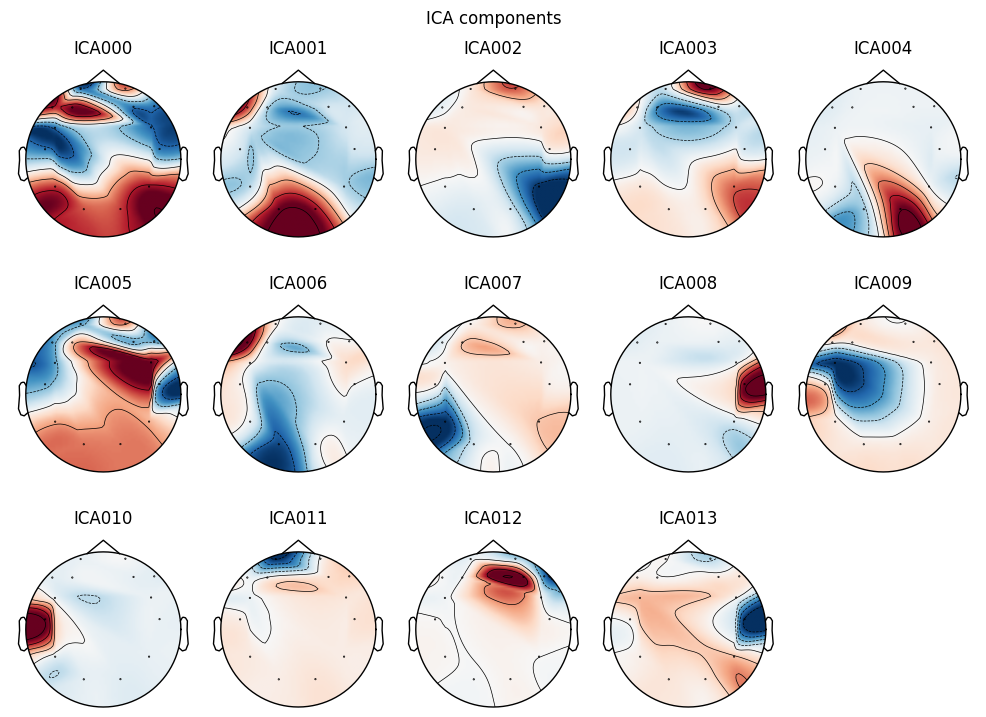

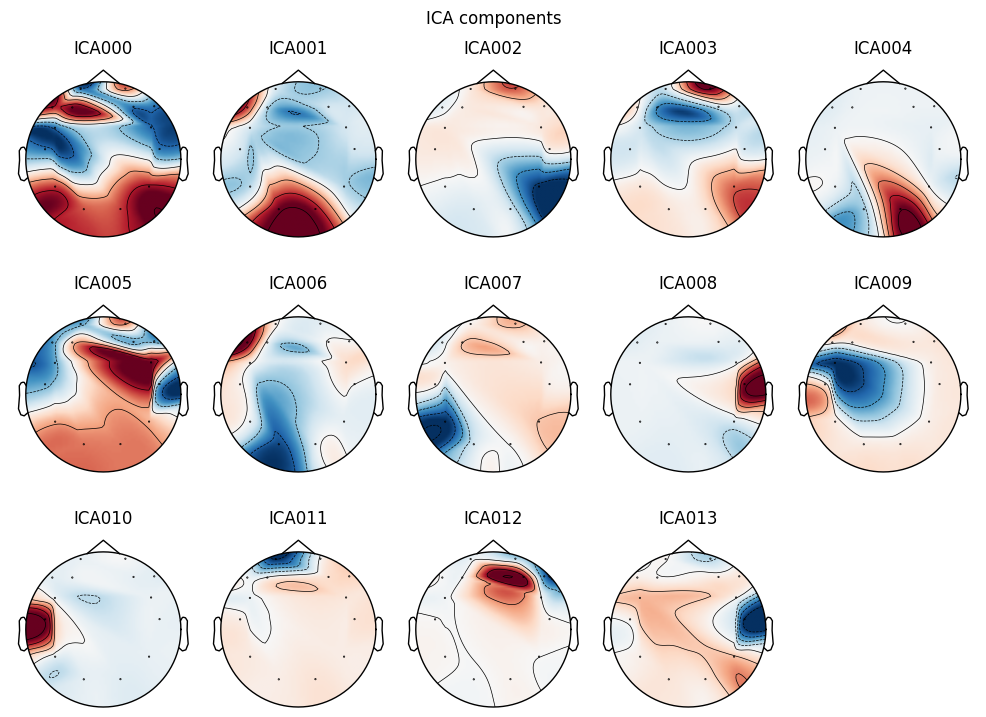

In [ ]:
dt.subjects[0].ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6938 matching events found
No baseline correction applied
0 projection items activated


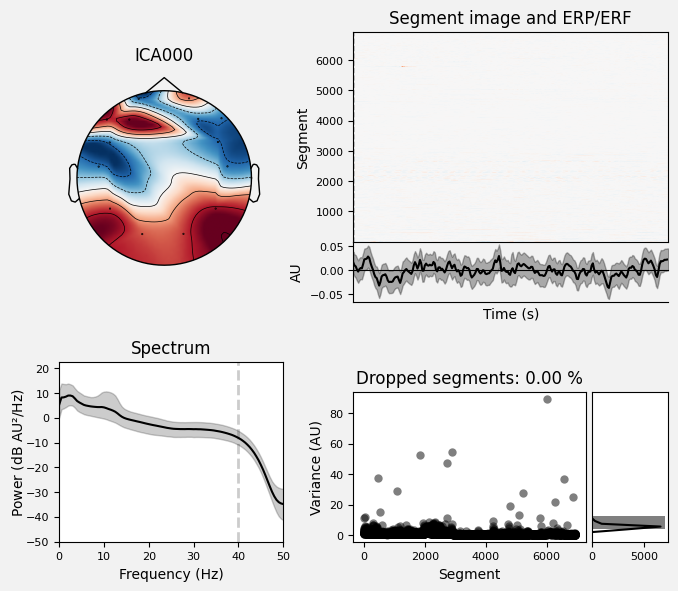

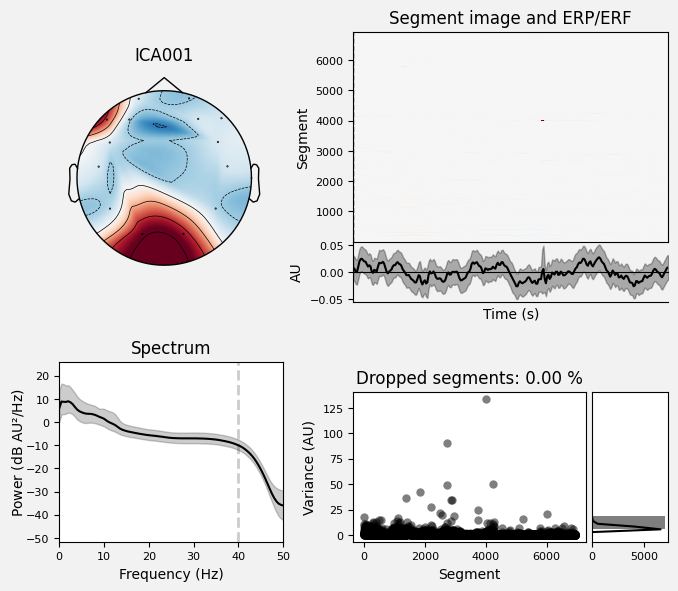

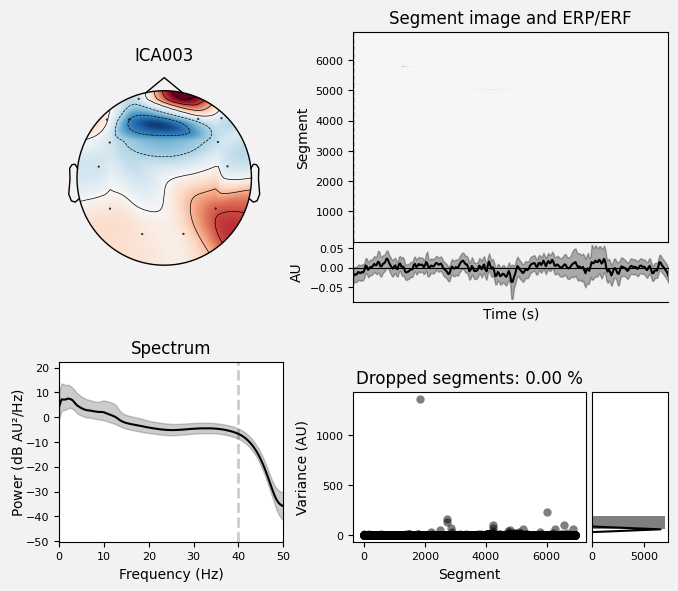

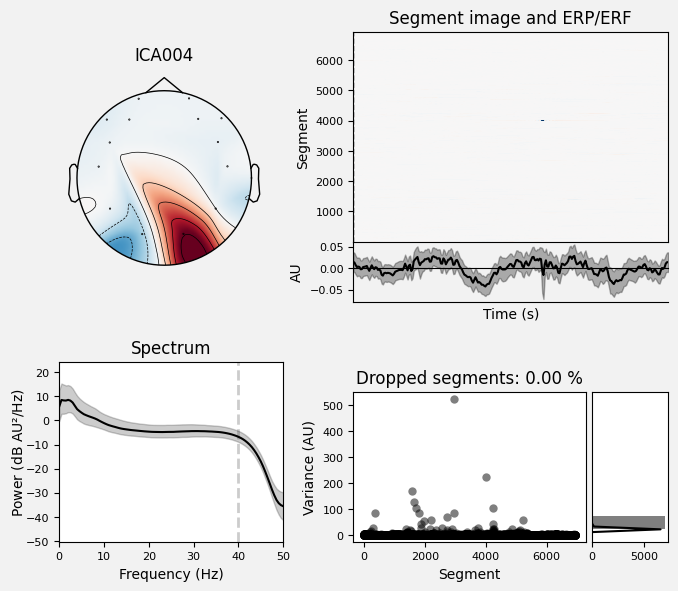

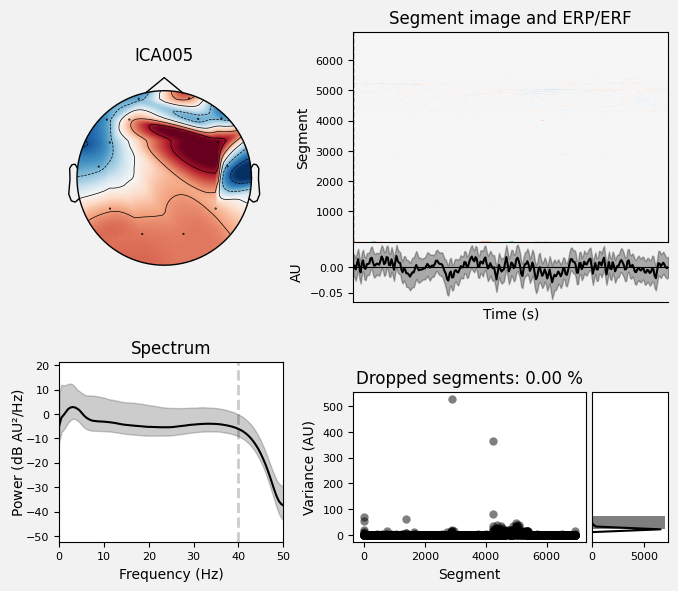

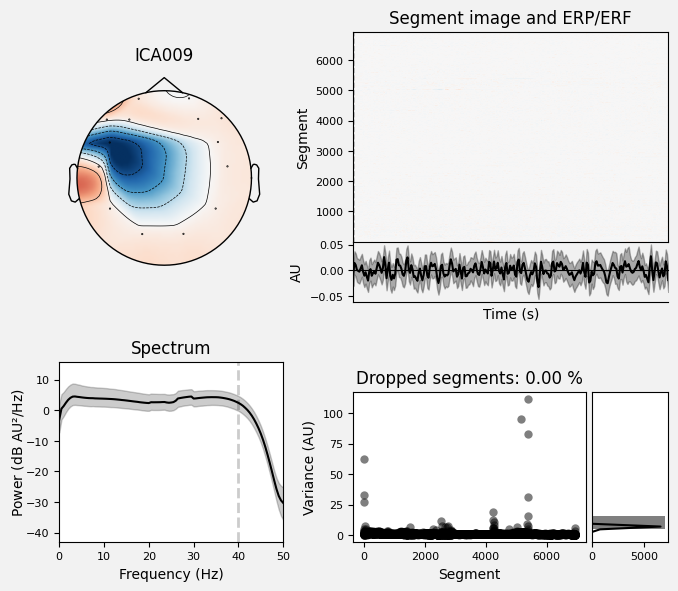

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
dt.subjects[0].ica.plot_properties(dt.subjects[0].raw_original, picks=[0, 1,3,4,5,9])

Using data from preloaded Raw for 1261 events and 1536 original time points ...
Effective window size : 12.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


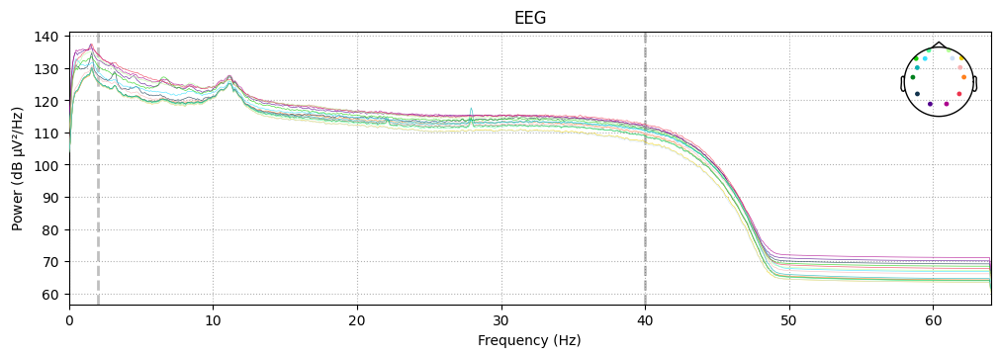

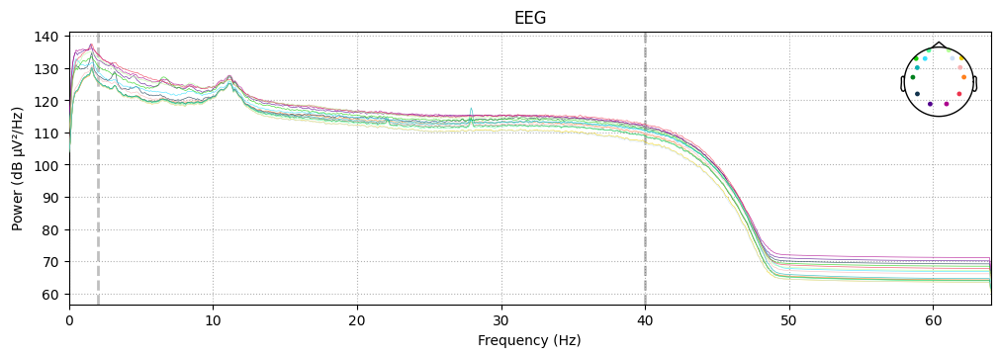

In [ ]:
dt.subjects[0].epoch.compute_psd(method="welch").plot()

Creating RawArray with float64 data, n_channels=4, n_times=1776340
    Range : 0 ... 1776339 =      0.000 ... 13877.648 secs
Ready.


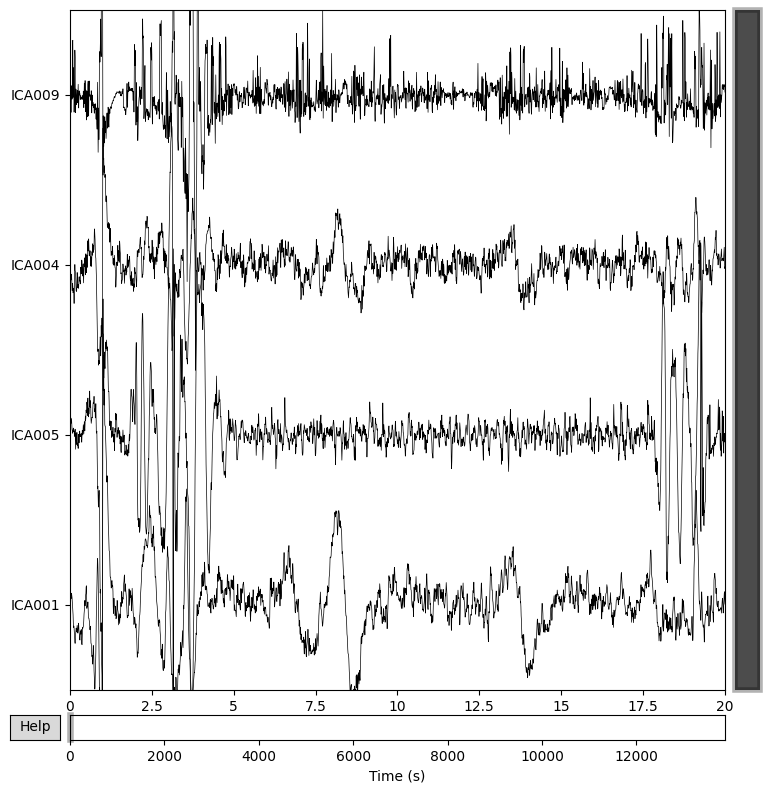

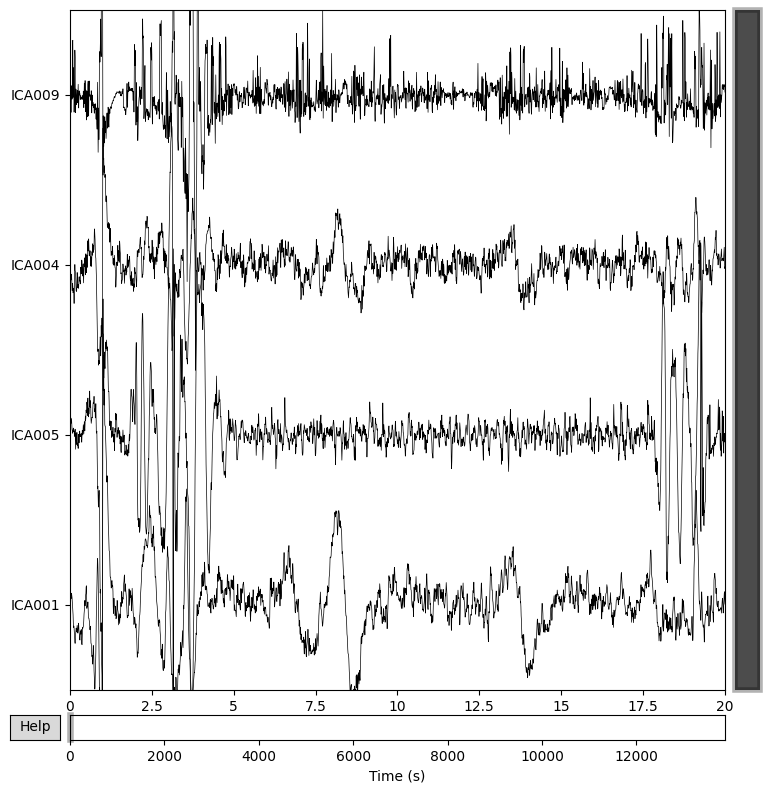

In [ ]:
dt.subjects[0].ica.plot_sources(dt.subjects[0].raw_original, picks=[9, 4, 5, 1])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components


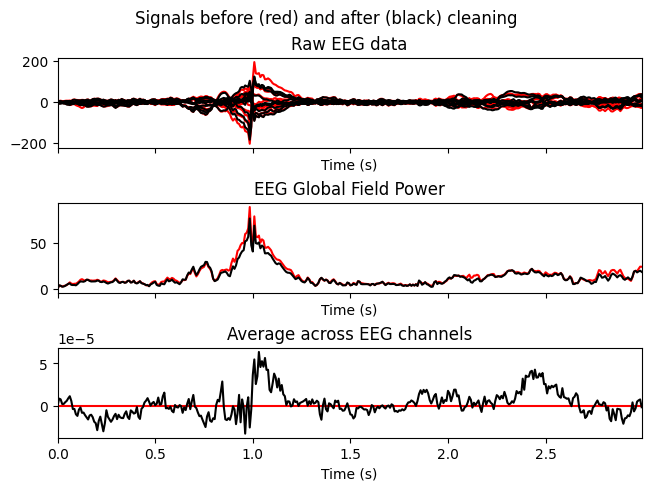

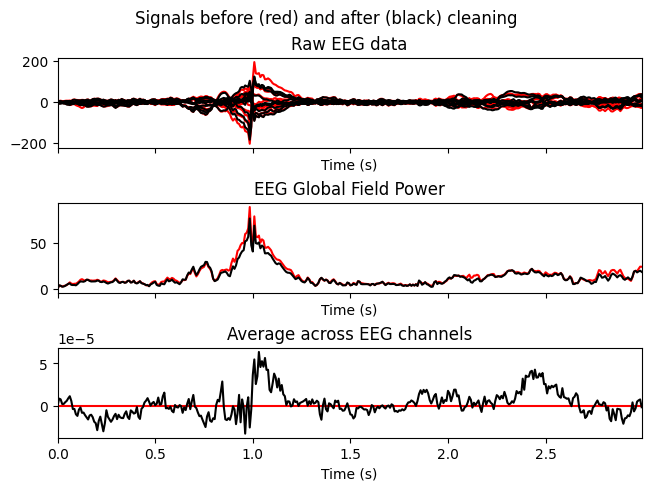

In [ ]:
dt.subjects[0].ica.plot_overlay(dt.subjects[0].raw_original, exclude=[9,4, 5])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})


In [ ]:
exclude_ica_grid = [
    [],
    [1],
    [9],
    [4],
    [5],
    [9,1],
    [9,1,3],
    [9,3],
    [9, 4],
    [9, 5],
    [4, 5],
    [9, 4, 5],
    [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],

]

results = {}
for exclude_ica in exclude_ica_grid:
  subject1_df_fe = dt.extract_features_df(1, exclude_ica=exclude_ica, average_bands=False)
  X = subject1_df_fe.drop(columns=["Mental_State"])
  y = subject1_df_fe["Mental_State"]
  y = y.apply(lambda x: 1 if x == 2 else 0)

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

  rf = RandomForestClassifier(n_estimators=350, random_state=42)

  rf.fit(X_train, y_train)

  y_pred = rf.predict(X_test)

  accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)
  results[str(exclude_ica)] = {
      "accuracy": accuracy,
      "f1": f1,
      "classification_rep": classification_rep,
      "confusion": confusion
  }

  print(f"Exclude ICA: {exclude_ica}")
  print("Accuracy:", accuracy)
  print("F1:", f1)
  print(classification_rep)
  print(confusion)


Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Exclude ICA: []
Accuracy: 0.8932806324110671
F1: 0.8821666364633536
              precision    recall  f1-score   support

           0       0.88      0.99      0.93       194
           1       0.97      0.56      0.71        59

    accuracy                           0.89       253
   macro avg       0.93      0.78      0.82       253
weighted avg       0.90      0.89      0.88       253

[[193   1]
 [ 26  33]]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting ba

In [ ]:
results_df = pd.DataFrame(results).T
results_df.sort_values(by="f1", ascending=False)

,accuracy,f1,classification_rep,confusion
[9],0.901186,0.891989,precision recall f1-score ...,"[[193, 1], [24, 35]]"
[5],0.897233,0.889266,precision recall f1-score ...,"[[191, 3], [23, 36]]"
"[9, 1, 3]",0.897233,0.889266,precision recall f1-score ...,"[[191, 3], [23, 36]]"
[4],0.897233,0.887107,precision recall f1-score ...,"[[193, 1], [25, 34]]"
"[9, 5]",0.893281,0.883348,precision recall f1-score ...,"[[192, 2], [25, 34]]"
[],0.893281,0.882167,precision recall f1-score ...,"[[193, 1], [26, 33]]"
"[9, 3]",0.893281,0.882167,precision recall f1-score ...,"[[193, 1], [26, 33]]"
"[9, 1]",0.889328,0.879616,precision recall f1-score ...,"[[191, 3], [25, 34]]"
"[9, 4, 5]",0.889328,0.879616,precision recall f1-score ...,"[[191, 3], [25, 34]]"
[1],0.889328,0.877165,precision recall f1-score ...,"[[193, 1], [27, 32]]"


## Subject 2 Artifact Removal

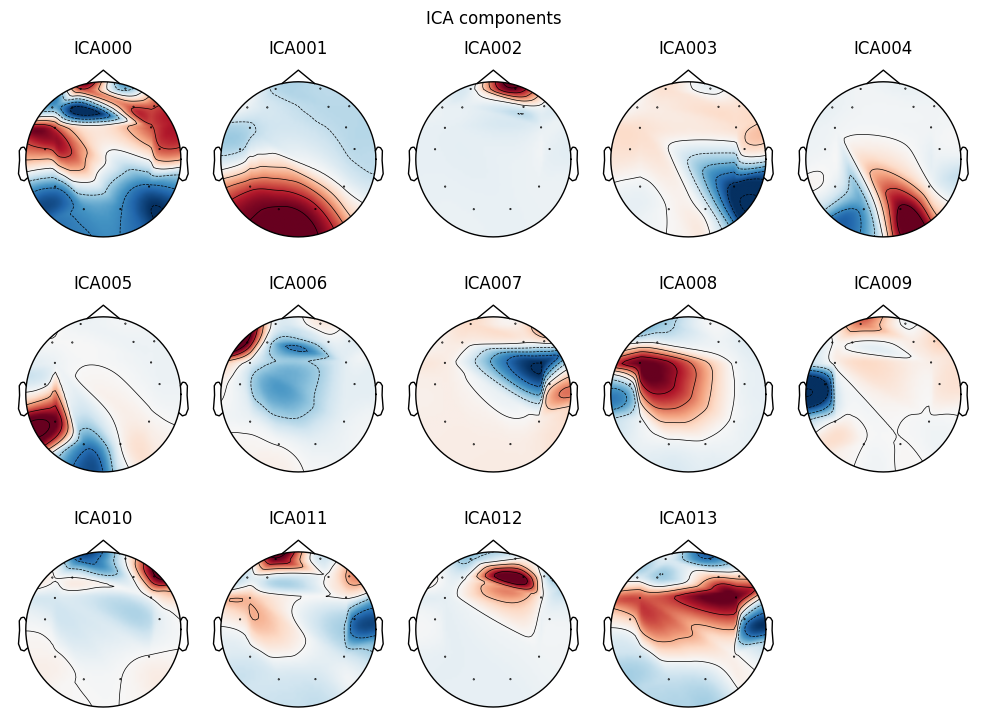

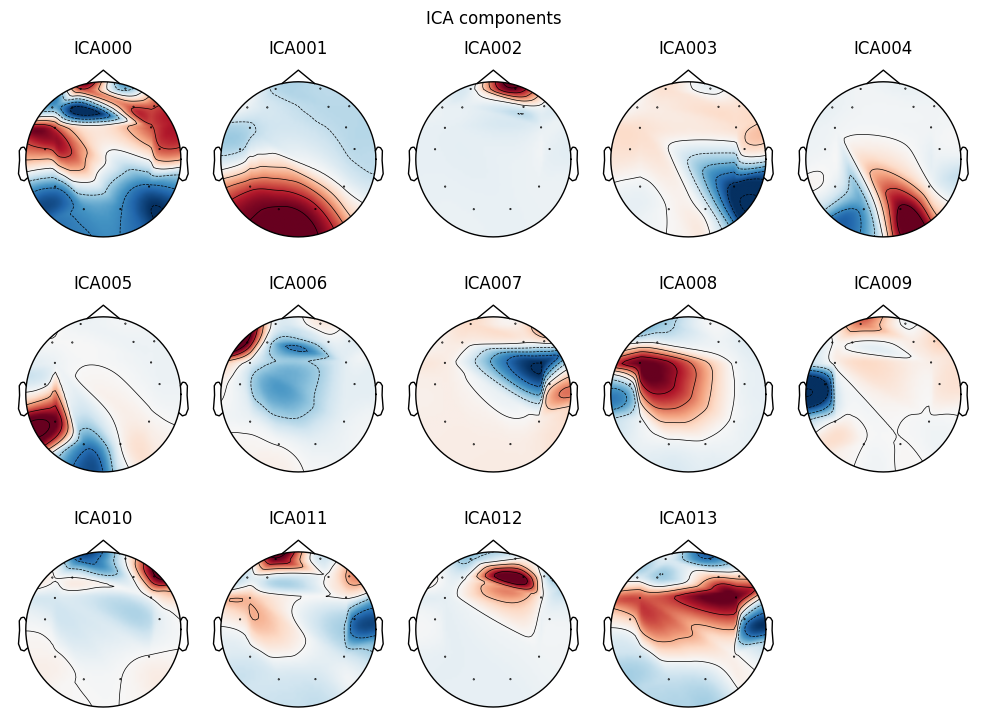

In [ ]:
dt.subjects[1].ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7219 matching events found
No baseline correction applied
0 projection items activated


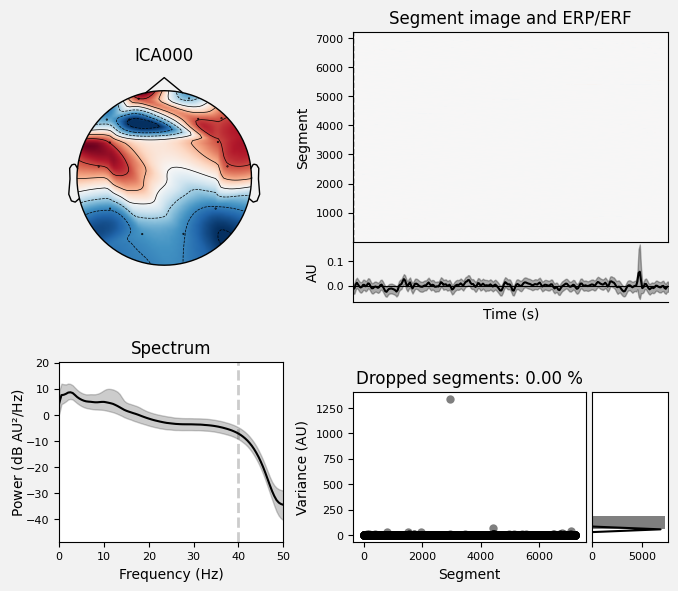

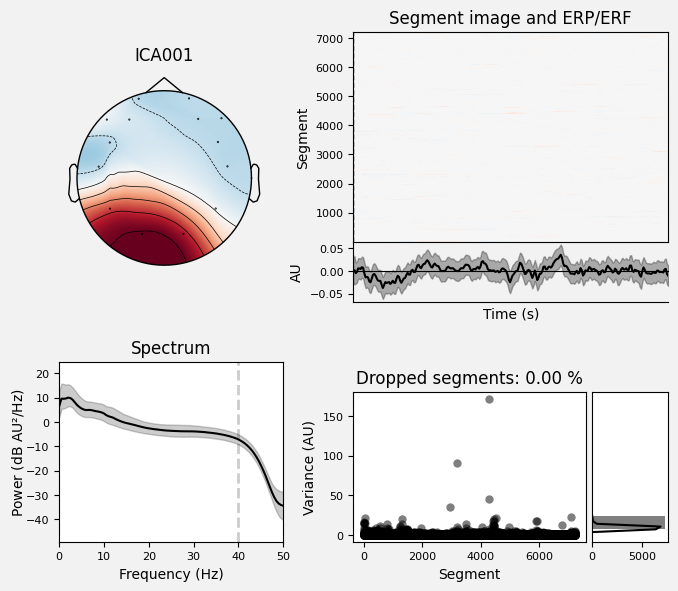

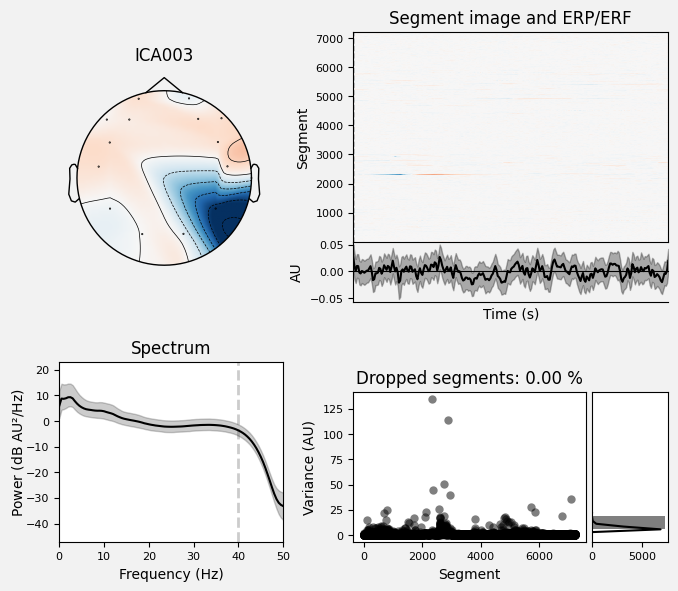

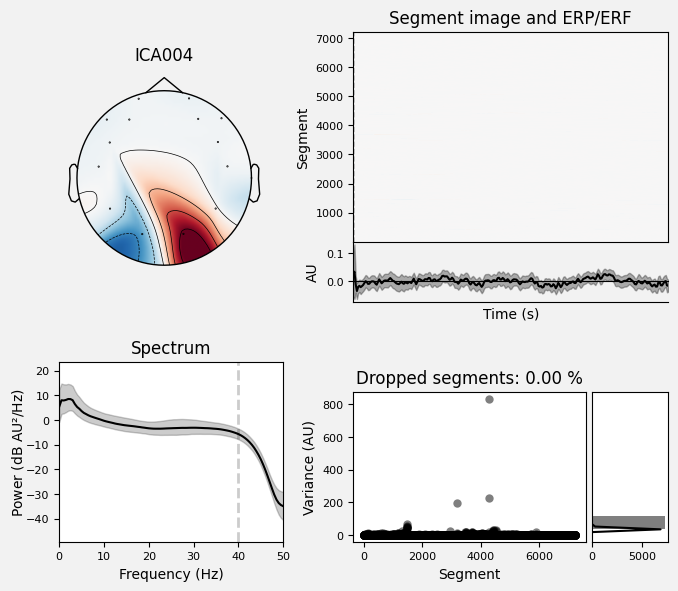

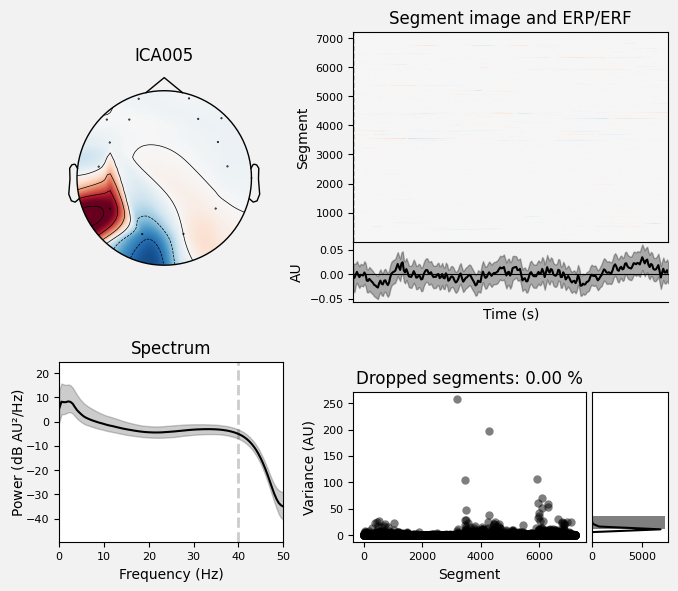

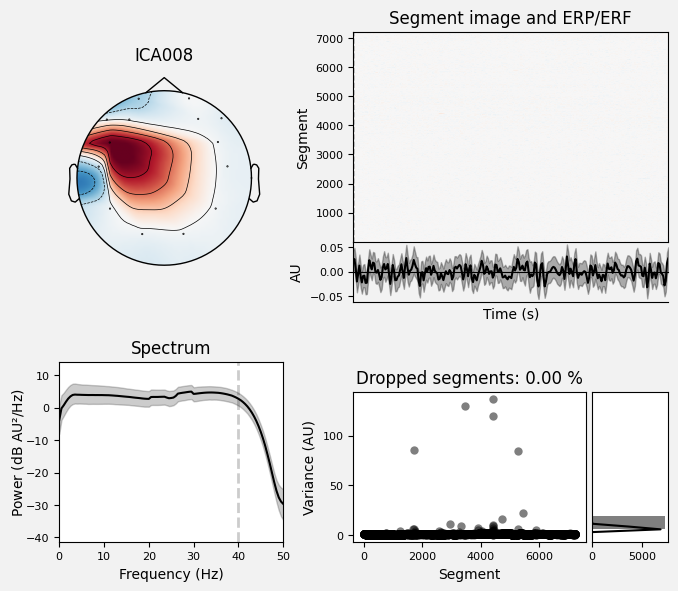

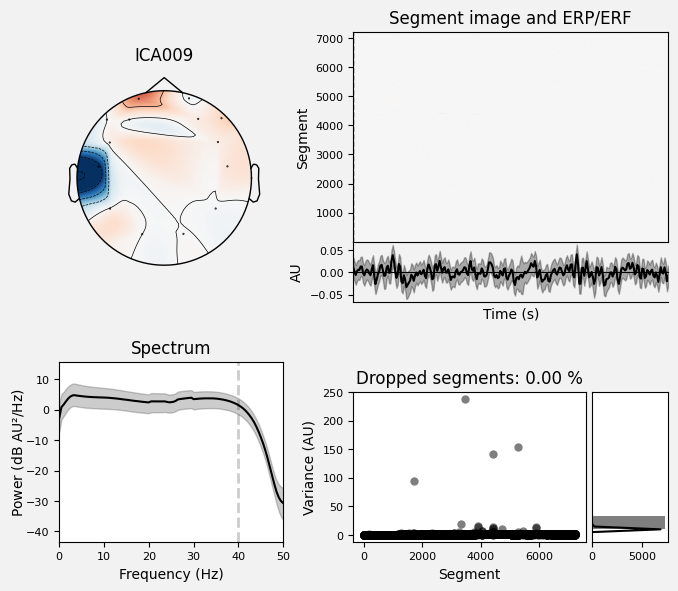

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
dt.subjects[1].ica.plot_properties(dt.subjects[1].raw_original, picks=[0,1,3,4,5,8,9])

Creating RawArray with float64 data, n_channels=7, n_times=1848160
    Range : 0 ... 1848159 =      0.000 ... 14438.742 secs
Ready.


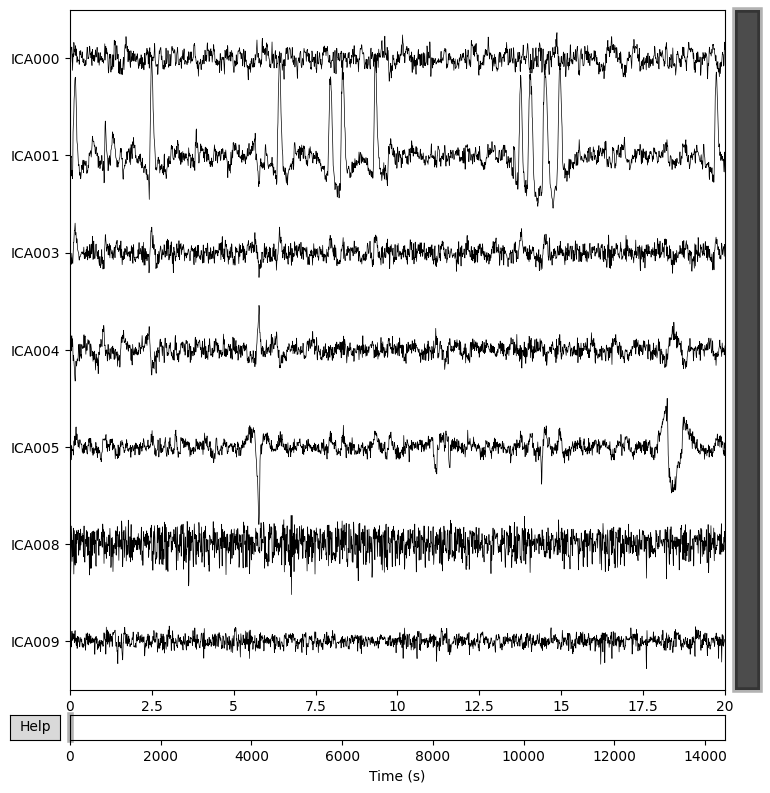

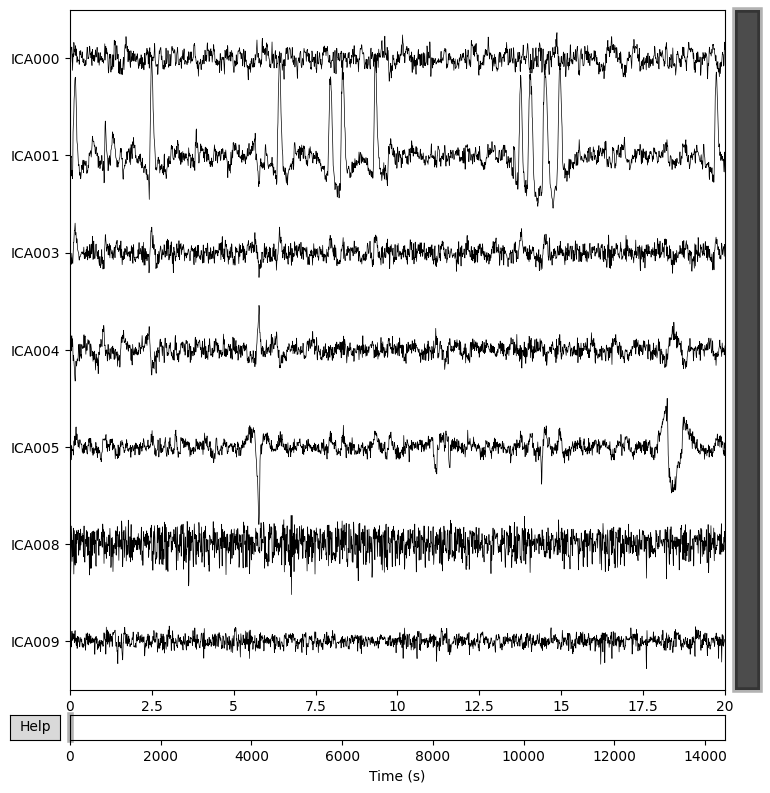

In [ ]:
dt.subjects[1].ica.plot_sources(dt.subjects[1].raw_original, picks=[0,1,3,4,5,8,9])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


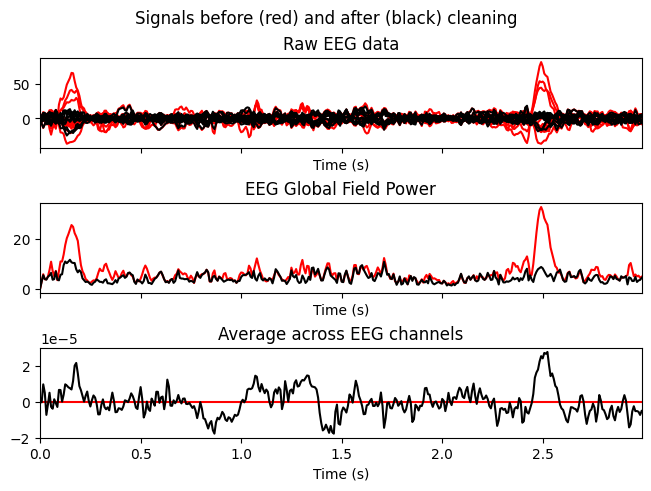

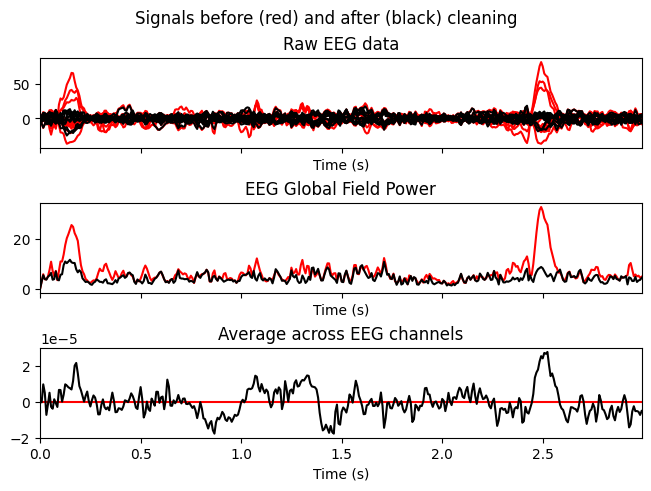

In [ ]:
dt.subjects[1].ica.plot_overlay(dt.subjects[1].raw_original, exclude=[1])

Using data from preloaded Raw for 1312 events and 1536 original time points ...
Effective window size : 12.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


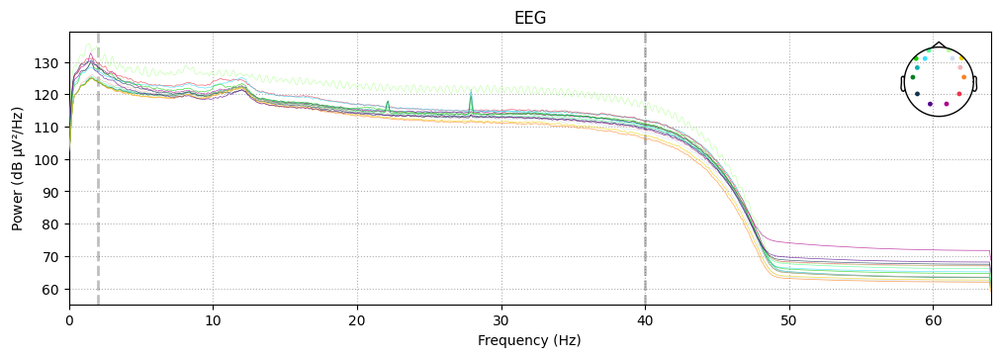

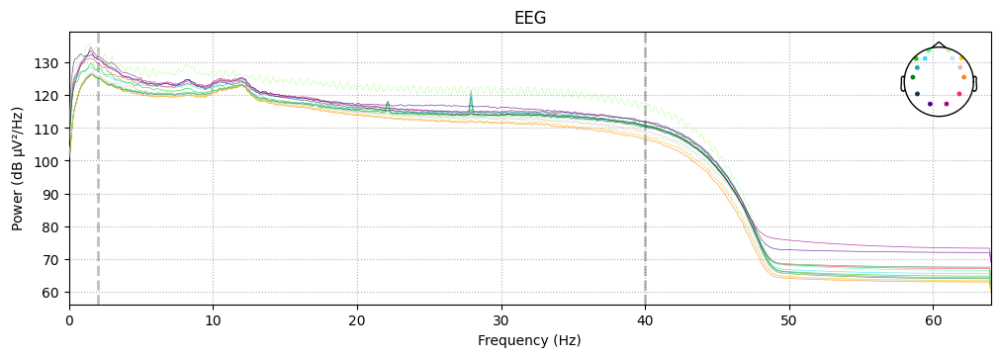

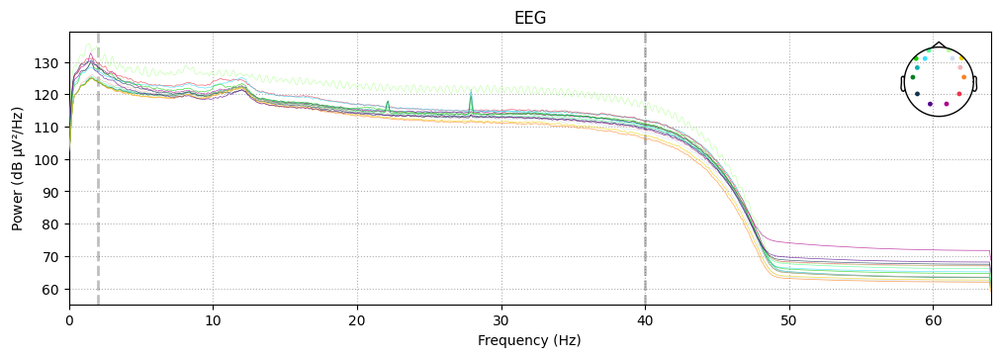

In [ ]:
dt.subjects[1].epoch.compute_psd(method="welch").plot()

raw_clean = dt.subjects[1].ica.apply(dt.subjects[1].raw_original.copy(), exclude=[1])
epoch = make_fixed_length_epochs(raw_clean, duration=12, overlap=1.0)

epoch.compute_psd(method="welch").plot()

## Intermediate model

In [ ]:
final_df = []

for i in range(1, 6):
  if i == 1:
    subject_df = dt.extract_features_df(i, exclude_ica=[9], average_bands=False)
  elif i == 2:
    subject_df = dt.extract_features_df(i, exclude_ica=[1], average_bands=False)
  else:
    subject_df = dt.extract_features_df(i, average_bands=False)
  final_df.append(subject_df)

final_df = pd.concat(final_df)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 2: Counter({0: 765, 2: 274, 1: 273})
Not setting metadata
1329 matching events found
No baseline correction applied
0 proje

In [ ]:
X = final_df.drop(columns=["Mental_State"])
y = final_df["Mental_State"]
y = y.apply(lambda x: 1 if x == 2 else 0)

print(y.value_counts())

rf = RandomForestClassifier(n_estimators=500, random_state=42, class_weight="balanced")

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_rep)
print(confusion)




Mental_State
0    5082
1    1309
Name: count, dtype: int64
Accuracy: 0.8983580922595777
F1: 0.8877930597706389
              precision    recall  f1-score   support

           0       0.90      0.99      0.94      1020
           1       0.92      0.54      0.68       259

    accuracy                           0.90      1279
   macro avg       0.91      0.77      0.81      1279
weighted avg       0.90      0.90      0.89      1279

[[1008   12]
 [ 118  141]]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.utils import resample
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

df_features = average_bands(final_df)
df_features["ABTR"] = df_features["beta"] / (df_features["theta"] + df_features["alpha"])

X = df_features.drop(columns='Mental_State').values
y = df_features['Mental_State']
y = y.apply(lambda x: 1 if x == 2 else 0).values

# Prepare cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Track metrics across folds
all_y_true = []
all_y_pred = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    # Split data
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # Create train DataFrame for upsampling
    df_train = pd.DataFrame(X_train)
    df_train['label'] = y_train

    # Separate classes
    df_majority = df_train[df_train['label'] == 0]
    df_minority = df_train[df_train['label'] == 1]

    # Upsample minority class
    df_minority_upsampled = resample(
        df_minority,
        replace=True,
        n_samples=len(df_majority),
        random_state=42
    )

    # Combine and shuffle
    df_train_bal = pd.concat([df_majority, df_minority_upsampled])
    df_train_bal = df_train_bal.sample(frac=1, random_state=42).reset_index(drop=True)

    # Split features and labels
    X_train_bal = df_train_bal.drop(columns='label').values
    y_train_bal = df_train_bal['label'].values

    # Train model
    clf = RandomForestClassifier(n_estimators=350, random_state=42)
    clf.fit(X_train_bal, y_train_bal)

    # Predict
    y_pred = clf.predict(X_test)

    # Track for full report
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"\nFold {fold} Report:")
    print(classification_report(y_test, y_pred, digits=3))

# Final cross-validation report
print("\n=== Overall Cross-Validation Report ===")
print(classification_report(all_y_true, all_y_pred, digits=3))



Fold 1 Report:
              precision    recall  f1-score   support

           0      0.902     0.973     0.937      1017
           1      0.852     0.592     0.698       262

    accuracy                          0.895      1279
   macro avg      0.877     0.783     0.817      1279
weighted avg      0.892     0.895     0.888      1279


Fold 2 Report:
              precision    recall  f1-score   support

           0      0.914     0.971     0.942      1016
           1      0.854     0.645     0.735       262

    accuracy                          0.905      1278
   macro avg      0.884     0.808     0.838      1278
weighted avg      0.902     0.905     0.899      1278


Fold 3 Report:
              precision    recall  f1-score   support

           0      0.908     0.958     0.932      1016
           1      0.791     0.622     0.697       262

    accuracy                          0.889      1278
   macro avg      0.849     0.790     0.814      1278
weighted avg      0.884   

In [ ]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# assume df_features already built, with ABTR added
df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true, all_y_pred = [], []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # apply SMOTE to balance classes
    sm = SMOTE(random_state=42)
    X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

    clf = RandomForestClassifier(n_estimators=350, random_state=42)
    clf.fit(X_train_bal, y_train_bal)

    y_pred = clf.predict(X_test)
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"\nFold {fold} Report:")
    accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("F1:", f1)
    print(classification_report(y_test, y_pred, digits=2))
    print(confusion)

print("\n=== Overall Cross-Validation Report ===")
accuracy, f1, classification_rep, confusion = compute_metrics(all_y_true, all_y_pred)
print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(all_y_true, all_y_pred, digits=2))
print(confusion)



Fold 1 Report:
Accuracy: 0.9061767005473026
F1: 0.9036928811900234
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      1017
           1       0.81      0.71      0.76       262

    accuracy                           0.91      1279
   macro avg       0.87      0.83      0.85      1279
weighted avg       0.90      0.91      0.90      1279

[[974  43]
 [ 77 185]]

Fold 2 Report:
Accuracy: 0.9131455399061033
F1: 0.912448174317248
              precision    recall  f1-score   support

           0       0.94      0.95      0.95      1016
           1       0.80      0.77      0.78       262

    accuracy                           0.91      1278
   macro avg       0.87      0.86      0.86      1278
weighted avg       0.91      0.91      0.91      1278

[[966  50]
 [ 61 201]]

Fold 3 Report:
Accuracy: 0.8959311424100157
F1: 0.8958572450929175
              precision    recall  f1-score   support

           0       0.93      0.94      0.9

In [ ]:
# --- basic SMOTE workflow (no cross-validation) --------------------
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import pandas as pd

# 0. build your feature matrix / labels
df = average_bands(df_features)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

# 1. hold-out split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)

# 2. oversample only the training part
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

# 3. train model
clf = RandomForestClassifier(n_estimators=350, random_state=42)
clf.fit(X_train_bal, y_train_bal)

# 4. predict on untouched test set
y_pred = clf.predict(X_test)
accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(y_test, y_pred, digits=3))
print(confusion)


Accuracy: 0.9022673964034402
F1: 0.9023364385256727
              precision    recall  f1-score   support

           0      0.939     0.938     0.939      1017
           1      0.760     0.763     0.762       262

    accuracy                          0.902      1279
   macro avg      0.850     0.851     0.850      1279
weighted avg      0.902     0.902     0.902      1279

[[954  63]
 [ 62 200]]


In [ ]:
final_df = []

for i in range(1,5):
  if i == 1:
    subject_df = dt.extract_features_df(i, exclude_ica=[9], average_bands=False)
  elif i == 2:
    subject_df = dt.extract_features_df(i, exclude_ica=[1], average_bands=False)
  else:
    subject_df = dt.extract_features_df(i, average_bands=False)
  final_df.append(subject_df)

final_df = pd.concat(final_df)



Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 2: Counter({0: 765, 2: 274, 1: 273})
Not setting metadata
1329 matching events found
No baseline correction applied
0 proje

In [ ]:
test_set = dt.extract_features_df(5, average_bands=False)

Not setting metadata
1281 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1281 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 5: Counter({0: 844, 1: 219, 2: 218})


In [ ]:
# --- basic SMOTE workflow (no cross-validation) --------------------
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import pandas as pd

# build feature matrix / labels
df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values


# 2. oversample only the training part
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X, y)

# 3. train model
clf = RandomForestClassifier(n_estimators=350, random_state=42)
clf.fit(X_train_bal, y_train_bal)


RandomForestClassifier(n_estimators=350, random_state=42)

In [ ]:
X.shape

(5110, 75)

In [ ]:
test_df = average_bands(test_set)
test_df["ABTR"] = test_df["beta"] / (test_df["theta"] + test_df["alpha"])
X_test, y_test = test_df.drop(columns="Mental_State").values, test_df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

# 4. predict on untouched test set
y_pred = clf.predict(X_test)
accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(y_test, y_pred, digits=3))
print(confusion)

Accuracy: 0.8914910226385636
F1: 0.8823814215941379
              precision    recall  f1-score   support

           0      0.907     0.969     0.937      1063
           1      0.772     0.514     0.617       218

    accuracy                          0.891      1281
   macro avg      0.840     0.741     0.777      1281
weighted avg      0.884     0.891     0.882      1281

[[1030   33]
 [ 106  112]]


## Subject 3 Artifact Removal

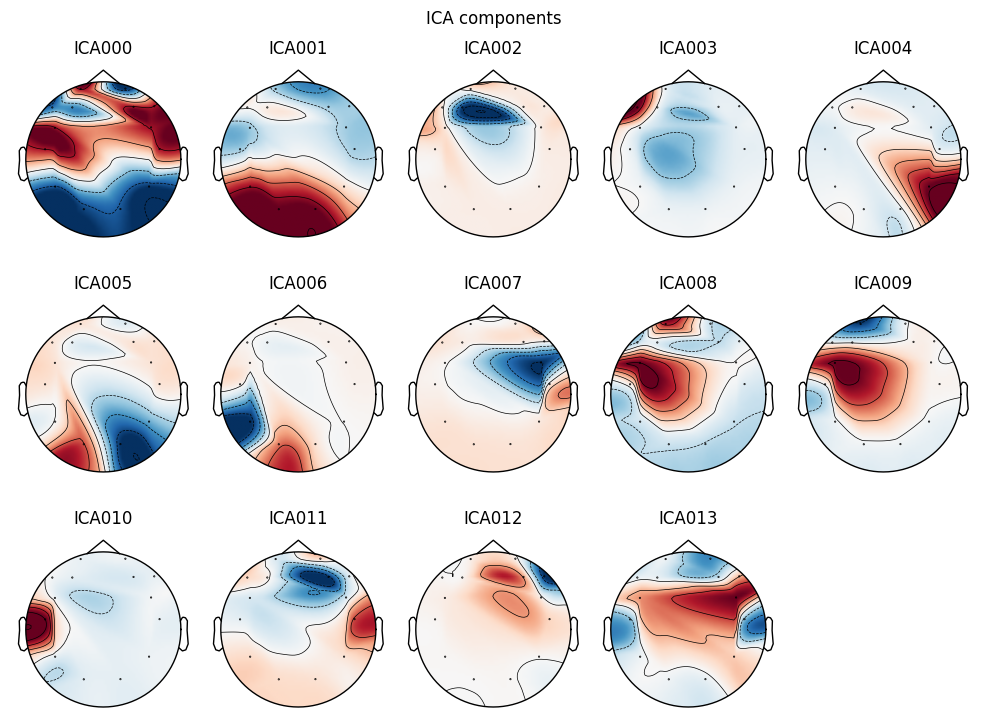

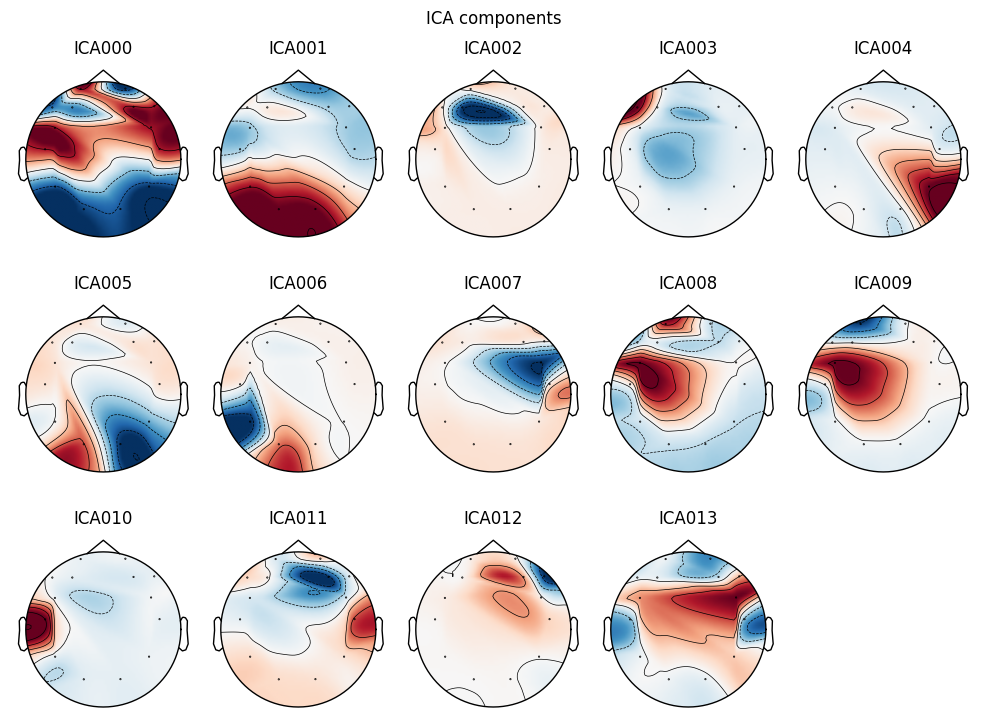

In [ ]:
dt.subjects[2].ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
7313 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7313 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7313 matching events found
No baseline correction applied
0 projection items activated


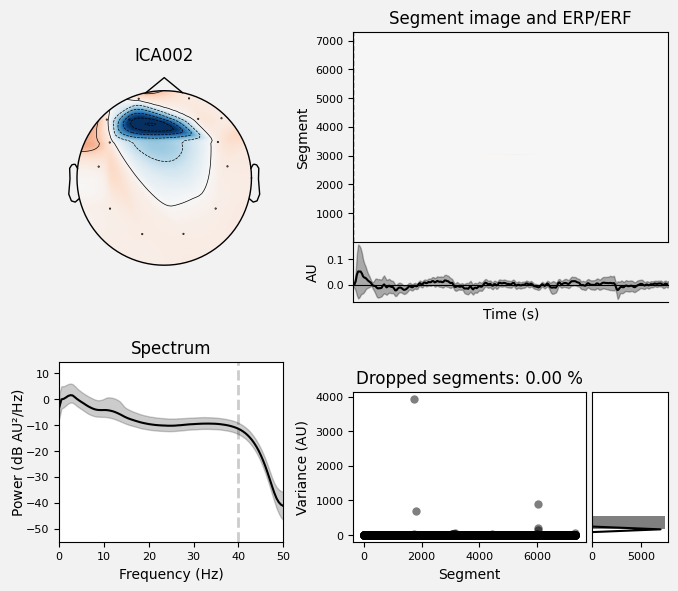

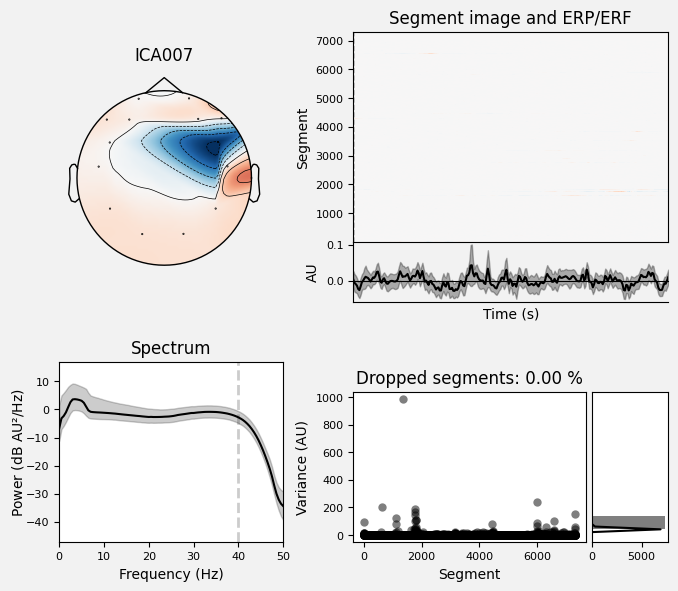

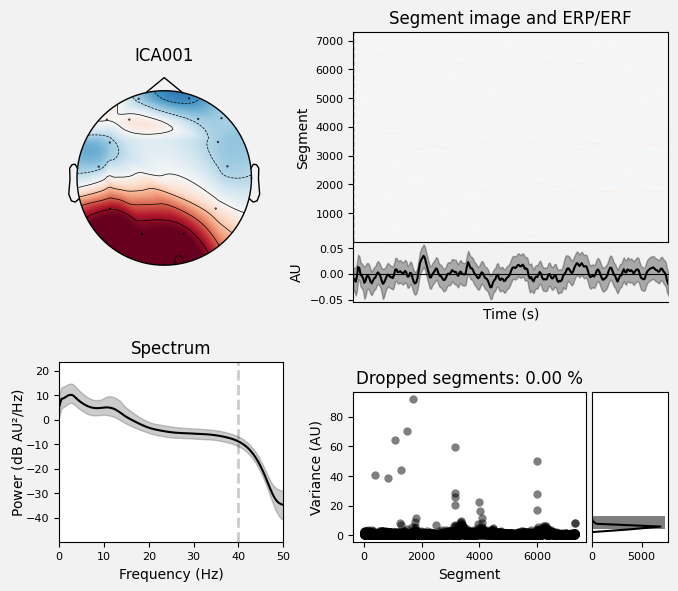

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
dt.subjects[2].ica.plot_properties(dt.subjects[2].raw_original, picks=[2,7,1, ])

Creating RawArray with float64 data, n_channels=3, n_times=1872140
    Range : 0 ... 1872139 =      0.000 ... 14626.086 secs
Ready.
Using matplotlib as 2D backend.


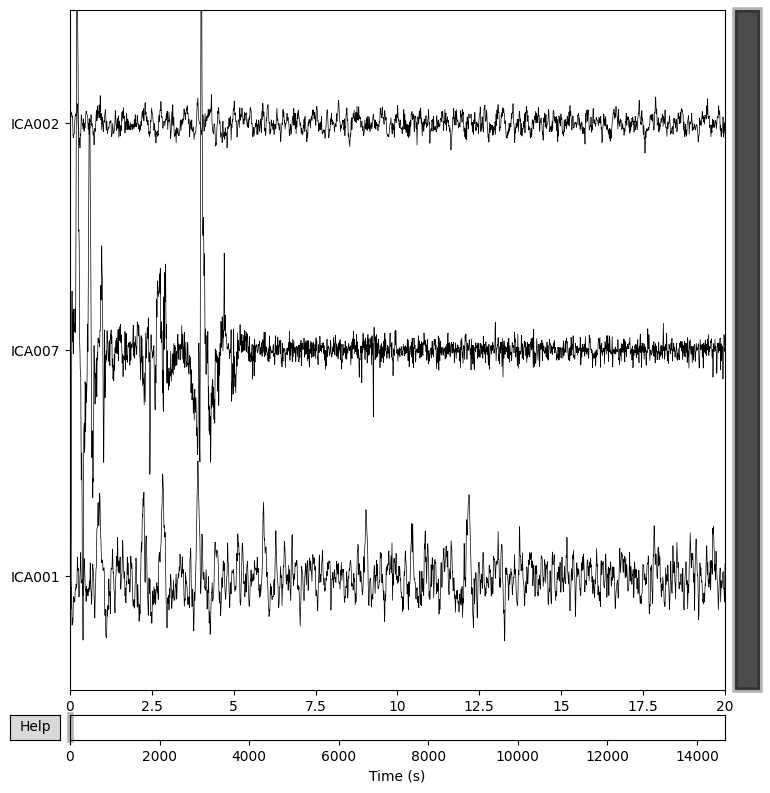

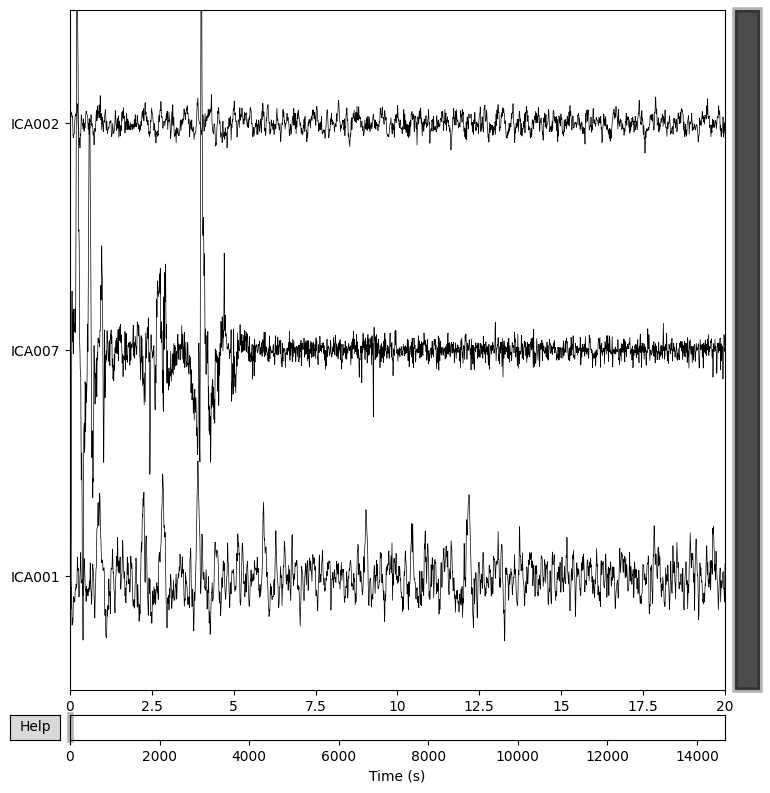

In [ ]:
dt.subjects[2].ica.plot_sources(dt.subjects[2].raw_original, picks=[2,7,1])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components


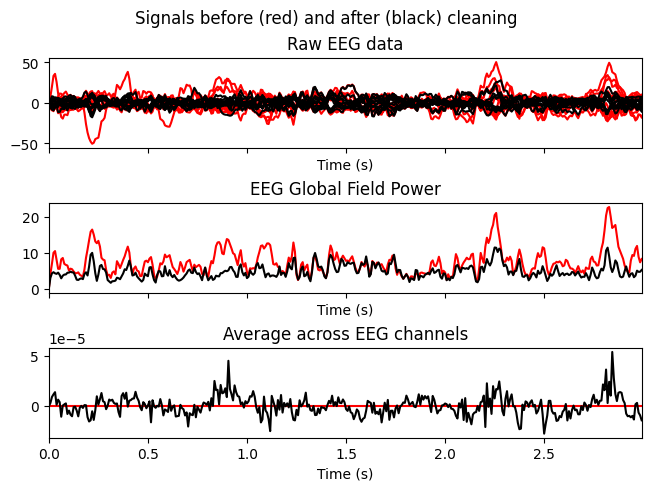

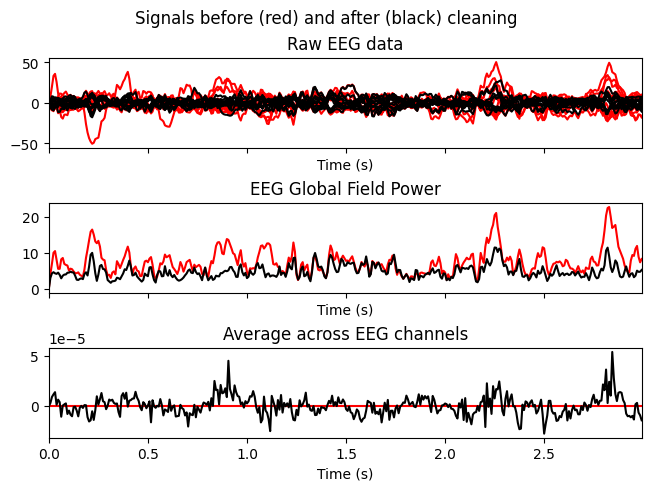

In [ ]:
dt.subjects[2].ica.plot_overlay(dt.subjects[2].raw_original, exclude=[7, 1, 2])

In [ ]:
from mne_icalabel import label_components

# assume `ica` is your fitted ICA object, and `raw` is your Raw
scores= label_components(dt.subjects[3].raw_original, dt.subjects[3].ica, method='iclabel')

<ipython-input-50-c53d7c65727d>:4: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  scores= label_components(dt.subjects[3].raw_original, dt.subjects[3].ica, method='iclabel')
<ipython-input-50-c53d7c65727d>:4: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  scores= label_components(dt.subjects[3].raw_original, dt.subjects[3].ica, method='iclabel')


In [ ]:
scores_df = pd.DataFrame(scores)
scores_df.groupby("labels").apply(lambda x: x).sort_values("y_pred_proba", ascending=False)

<ipython-input-51-cbbd866f139b>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  scores_df.groupby("labels").apply(lambda x: x).sort_values("y_pred_proba", ascending=False)


y_pred_proba labels
labels                        
brain  2       0.968012  brain
       7       0.947990  brain
       5       0.887801  brain
       9       0.856060  brain
other  12      0.769265  other
brain  8       0.652541  brain
       0       0.622164  brain
       6       0.577818  brain
other  10      0.541946  other
       11      0.511863  other
brain  1       0.508527  brain
       4       0.500898  brain
other  13      0.499132  other
       3       0.486534  other

In [ ]:
exclude_ica_grid = [
    [],
    [12],
    [10],
    [11],
    [12,10,11],
    [12,10],
    [12,11],
    [10,11]
]

subject3_results = {}

for exclude_ica in exclude_ica_grid:
  subject3_df_fe = dt.extract_features_df(3, exclude_ica=exclude_ica, average_bands=False)

  subject3_df_fe = average_bands(subject3_df_fe)
  subject3_df_fe["ABTR"] = subject3_df_fe["beta"] / (subject3_df_fe["theta"] + subject3_df_fe["alpha"])
  X = subject3_df_fe.drop(columns=["Mental_State"])
  y = subject3_df_fe["Mental_State"]
  y = y.apply(lambda x: 1 if x == 2 else 0)



  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  rf = RandomForestClassifier(n_estimators=350, random_state=42)

  rf.fit(X_train, y_train)

  y_pred = rf.predict(X_test)

  accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

  subject3_results[str(exclude_ica)] = {
      "accuracy": accuracy,
      "f1": f1,
      "classification_rep": classification_rep,
      "confusion": confusion
  }

  print(f"Exclude ICA: {exclude_ica}")
  print("Accuracy:", accuracy)
  print("F1:", f1)
  print(classification_rep)
  print(confusion)

subject3_res_df = pd.DataFrame(subject3_results).T
subject3_res_df.sort_values(by="f1", ascending=False)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components
Not setting metadata
1329 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1329 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 3: Counter({0: 782, 1: 274, 2: 273})
Exclude ICA: []
Accuracy: 0.9360902255639098
F1: 0.9333514695128893
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       211
           1       0.93      0.75      0.83        55

    accuracy                           0.94       266
   macro avg       0.93      0.87      0.89       266
weighted avg       0.94      0.94      0.93       266

[[208   3]
 [ 14  41]]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting ba

,accuracy,f1,classification_rep,confusion
[],0.93609,0.933351,precision recall f1-score ...,"[[208, 3], [14, 41]]"
[11],0.932331,0.929731,precision recall f1-score ...,"[[207, 4], [14, 41]]"
[10],0.928571,0.924852,precision recall f1-score ...,"[[208, 3], [16, 39]]"
"[10, 11]",0.921053,0.916942,precision recall f1-score ...,"[[207, 4], [17, 38]]"
"[12, 10]",0.917293,0.911765,precision recall f1-score ...,"[[208, 3], [19, 36]]"
"[12, 11]",0.913534,0.908192,precision recall f1-score ...,"[[207, 4], [19, 36]]"
[12],0.913534,0.907305,precision recall f1-score ...,"[[208, 3], [20, 35]]"
"[12, 10, 11]",0.909774,0.902794,precision recall f1-score ...,"[[208, 3], [21, 34]]"


We will remove artifacts 11

## Subject 4 Artifact Removal

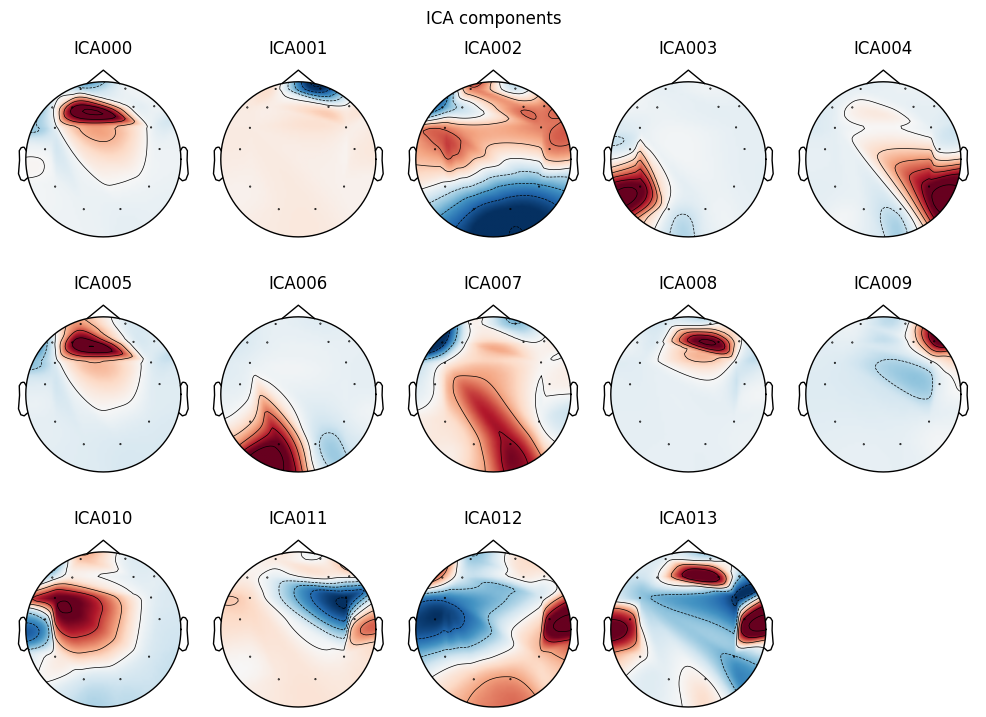

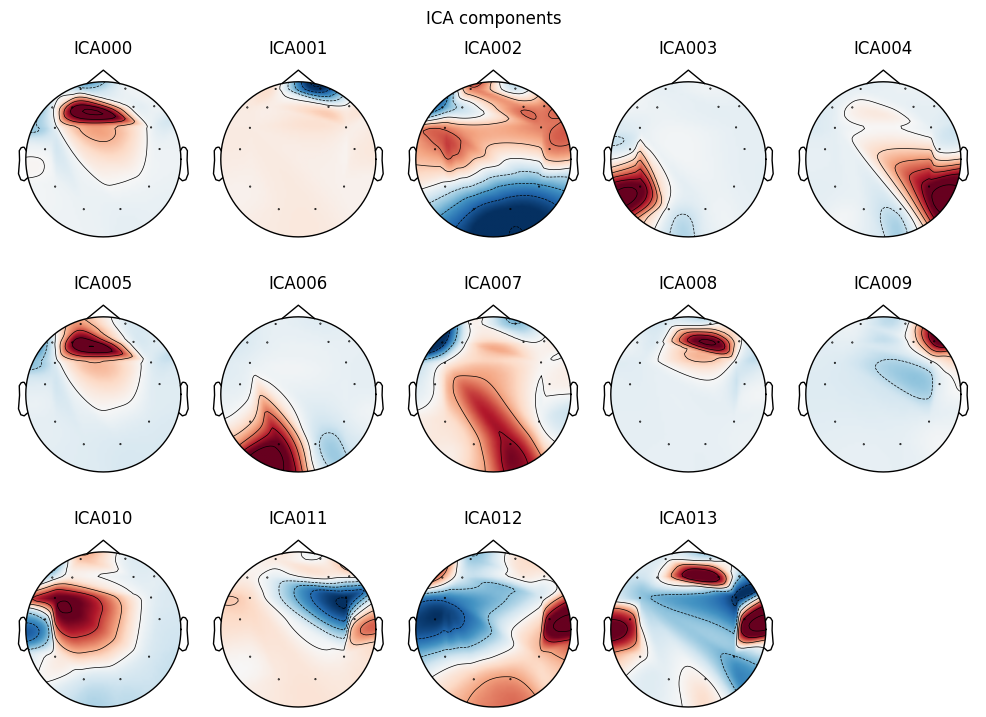

In [ ]:
dt.subjects[3].ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
6646 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6646 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6646 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
6646 matching events found
No baseline correction applied
0 projection items activated


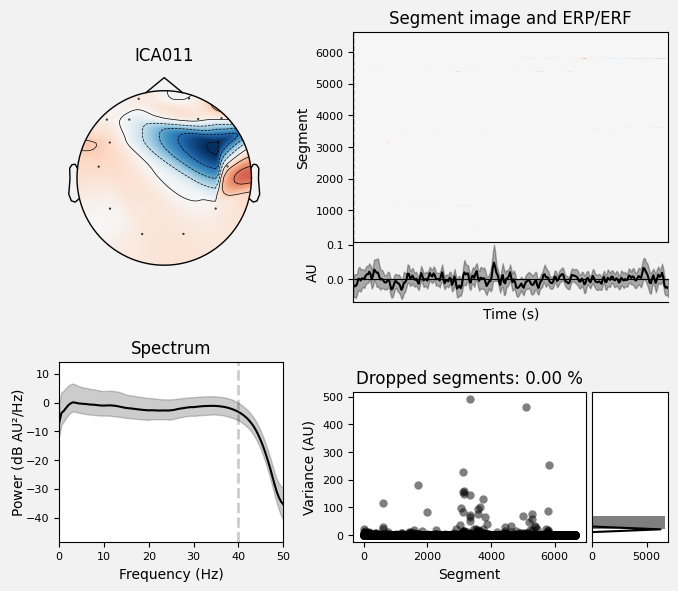

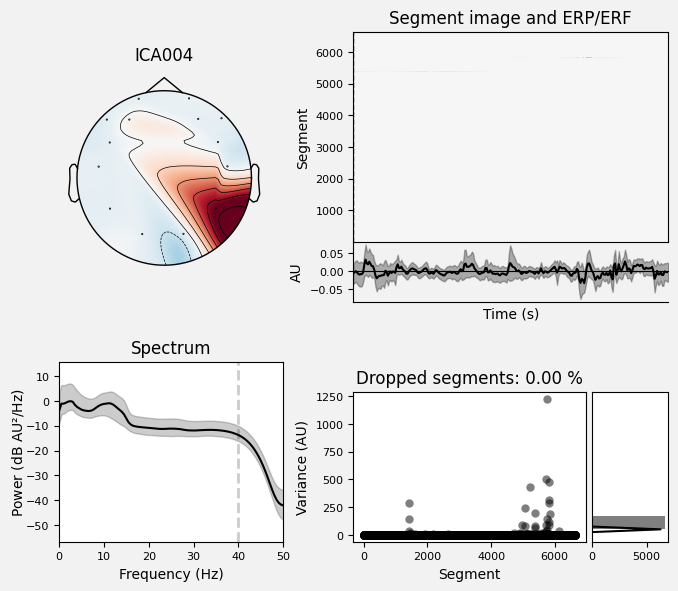

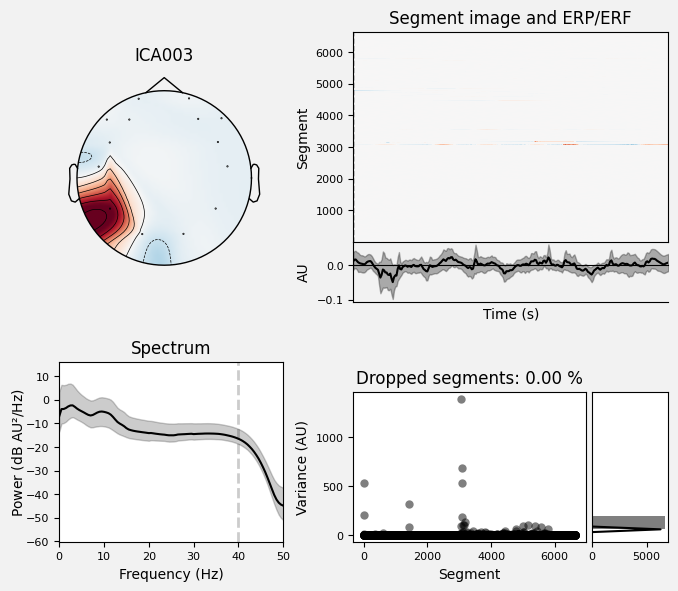

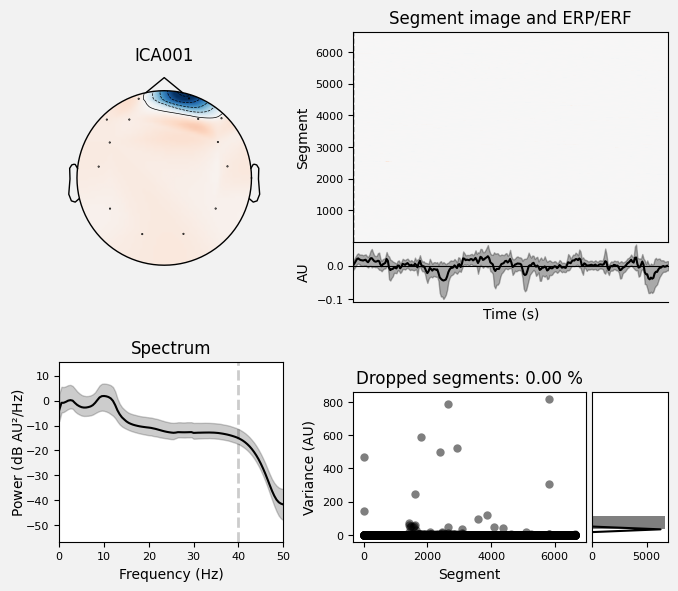

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
dt.subjects[3].ica.plot_properties(dt.subjects[3].raw_original, picks=[11, 4, 3, 1])

Creating RawArray with float64 data, n_channels=4, n_times=1701412
    Range : 0 ... 1701411 =      0.000 ... 13292.273 secs
Ready.


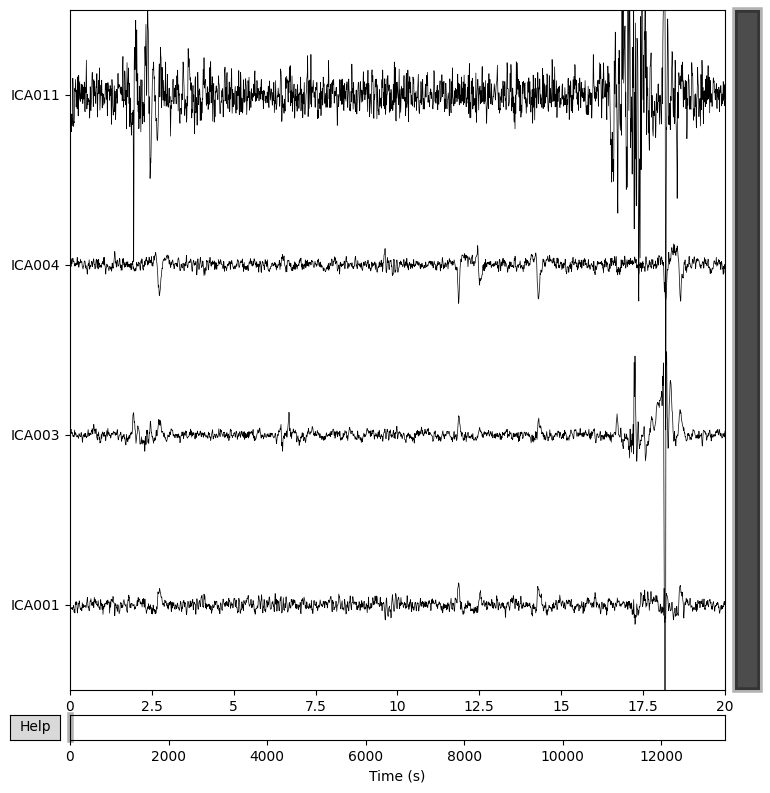

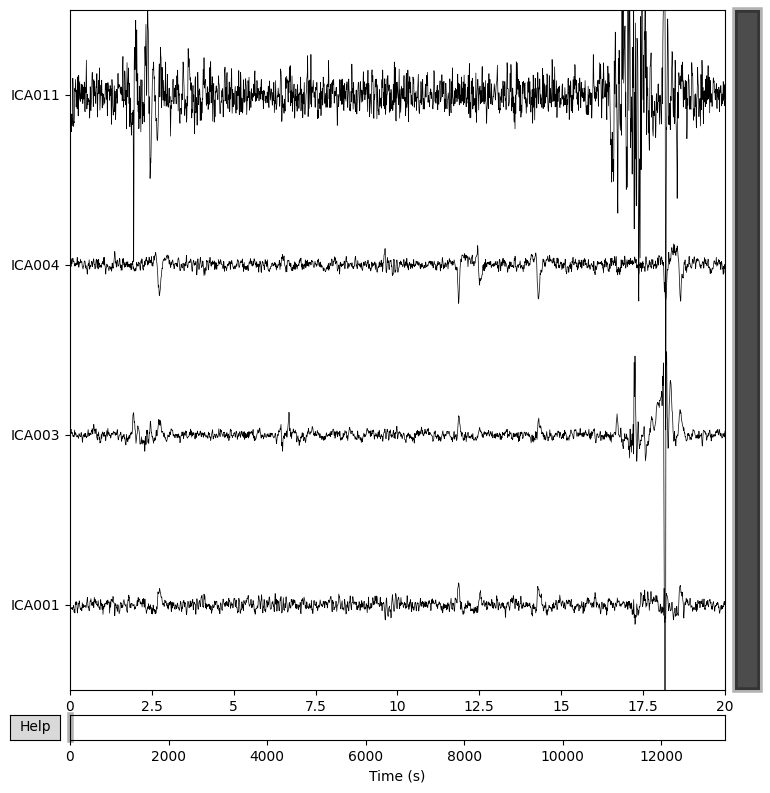

In [ ]:
dt.subjects[3].ica.plot_sources(dt.subjects[3].raw_original, picks=[11, 4, 3, 1])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components


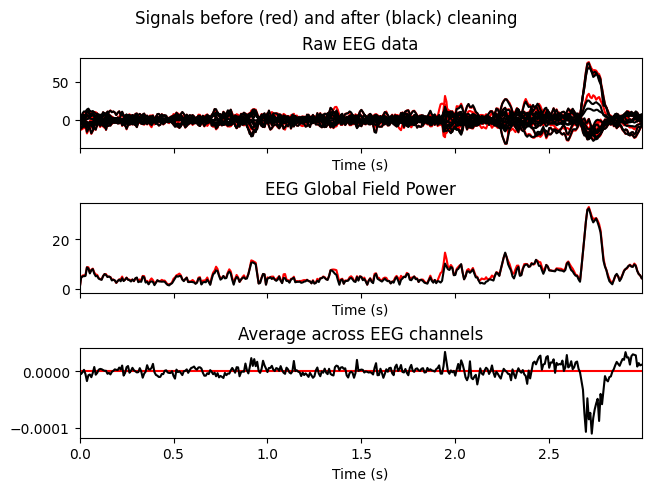

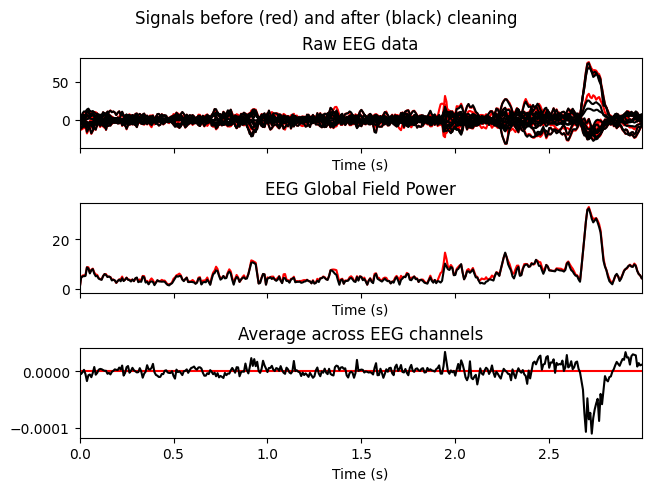

In [ ]:
dt.subjects[3].ica.plot_overlay(dt.subjects[3].raw_original, exclude=[11, 4, 3])

In [ ]:
exclude_ica_grid = [
    [],
    [11],
    [4],
    [3],
    [11,4,3],
    [11,4],
    [11,3],
    [4,3]
]

subject4_results = {}

for exclude_ica in exclude_ica_grid:
  subject4_df_fe = dt.extract_features_df(4, exclude_ica=exclude_ica, average_bands=False)

  subject4_df_fe = average_bands(subject4_df_fe)
  subject4_df_fe["ABTR"] = subject4_df_fe["beta"] / (subject4_df_fe["theta"] + subject4_df_fe["alpha"])
  X = subject4_df_fe.drop(columns=["Mental_State"])
  y = subject4_df_fe["Mental_State"]
  y = y.apply(lambda x: 1 if x == 2 else 0)



  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  rf = RandomForestClassifier(n_estimators=350, random_state=42)

  rf.fit(X_train, y_train)

  y_pred = rf.predict(X_test)

  accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

  subject4_results[str(exclude_ica)] = {
      "accuracy": accuracy,
      "f1": f1,
      "classification_rep": classification_rep,
      "confusion": confusion
  }

  print(f"Exclude ICA: {exclude_ica}")
  print("Accuracy:", accuracy)
  print("F1:", f1)
  print(classification_rep)
  print(confusion)

subject4_res_df = pd.DataFrame(subject4_results).T
subject4_res_df.sort_values(by="f1", ascending=False)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components
Not setting metadata
1208 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1208 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 4: Counter({0: 662, 1: 275, 2: 271})
Exclude ICA: []
Accuracy: 0.9049586776859504
F1: 0.9014537299857291
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       191
           1       0.83      0.69      0.75        51

    accuracy                           0.90       242
   macro avg       0.88      0.82      0.85       242
weighted avg       0.90      0.90      0.90       242

[[184   7]
 [ 16  35]]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting ba

,accuracy,f1,classification_rep,confusion
[4],0.921488,0.919971,precision recall f1-score ...,"[[184, 7], [12, 39]]"
"[11, 4]",0.917355,0.915412,precision recall f1-score ...,"[[184, 7], [13, 38]]"
[11],0.913223,0.909193,precision recall f1-score ...,"[[186, 5], [16, 35]]"
[],0.904959,0.901454,precision recall f1-score ...,"[[184, 7], [16, 35]]"
"[11, 4, 3]",0.900826,0.898494,precision recall f1-score ...,"[[182, 9], [15, 36]]"
"[4, 3]",0.900826,0.897623,precision recall f1-score ...,"[[183, 8], [16, 35]]"
[3],0.892562,0.888093,precision recall f1-score ...,"[[183, 8], [18, 33]]"
"[11, 3]",0.884298,0.879485,precision recall f1-score ...,"[[182, 9], [19, 32]]"


We will remove components 11 and 4

## Subject 5 Artifact Removal

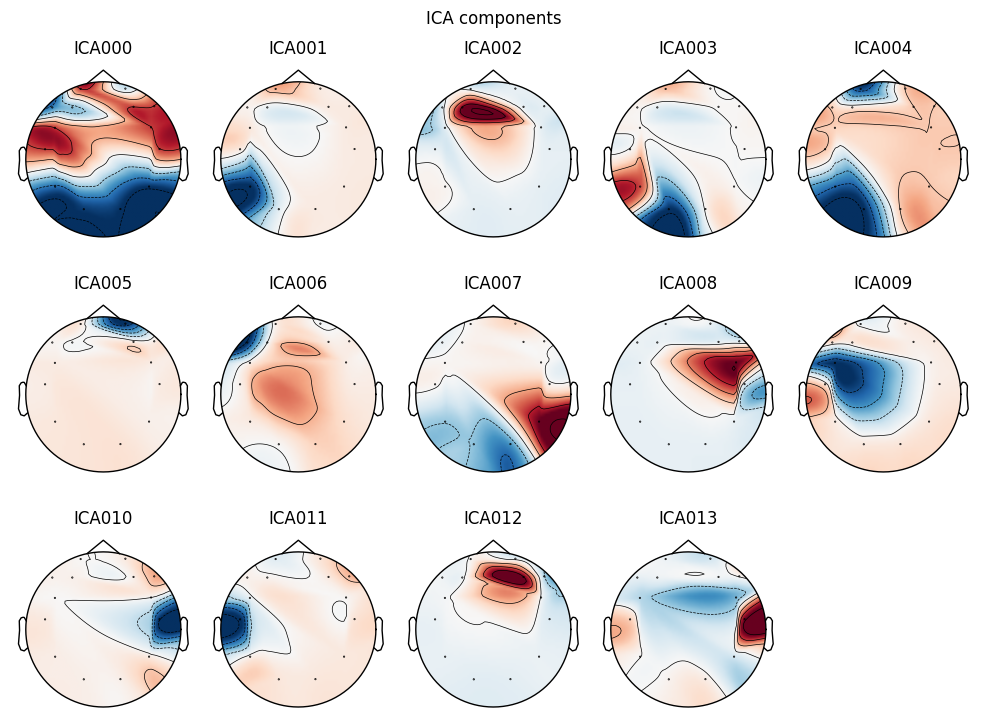

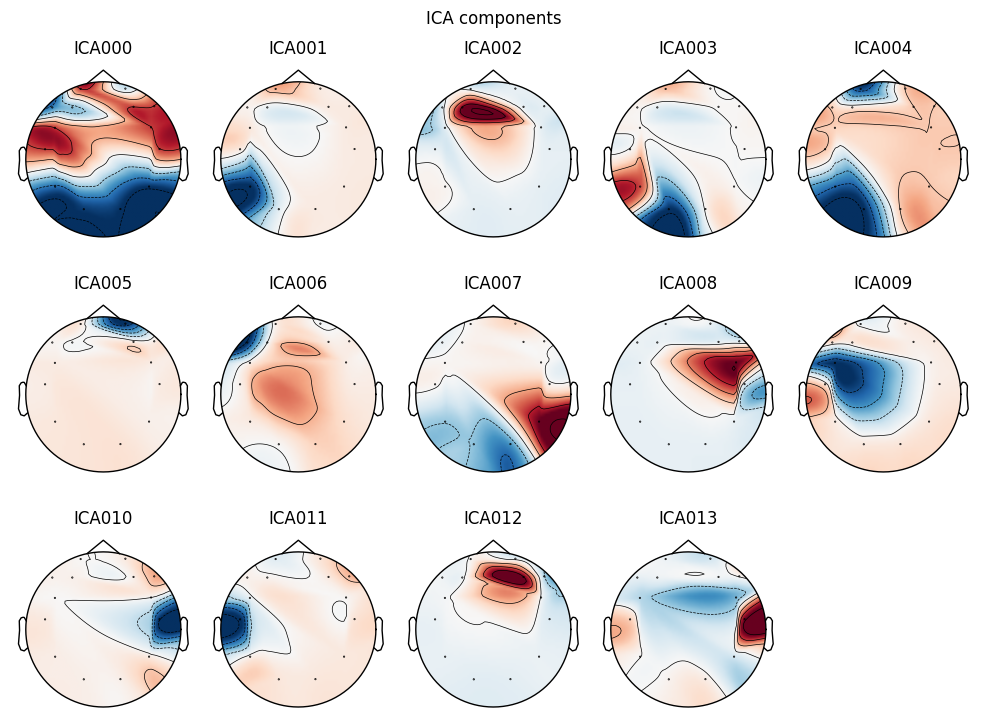

In [ ]:
dt.subjects[4].ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
7050 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7050 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7050 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7050 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
7050 matching events found
No baseline correction applied
0 projection items activated


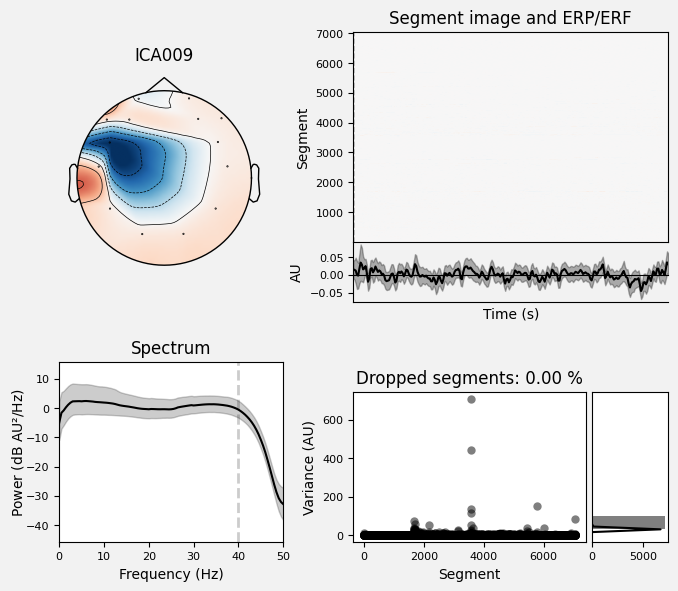

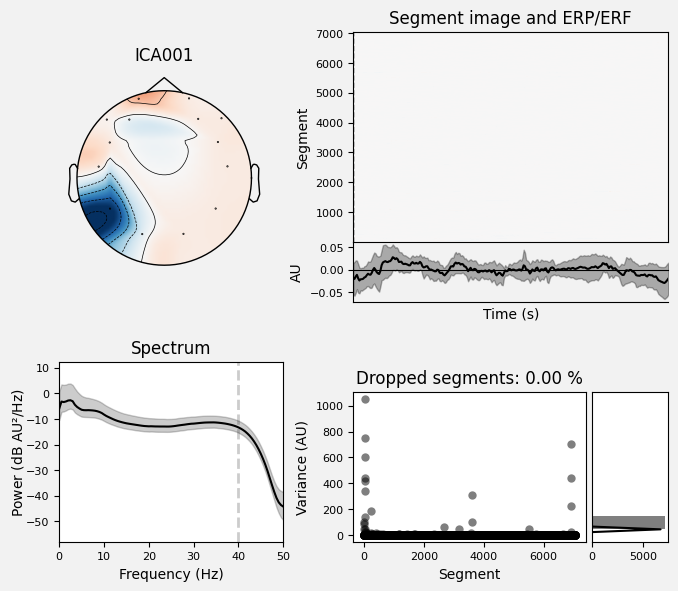

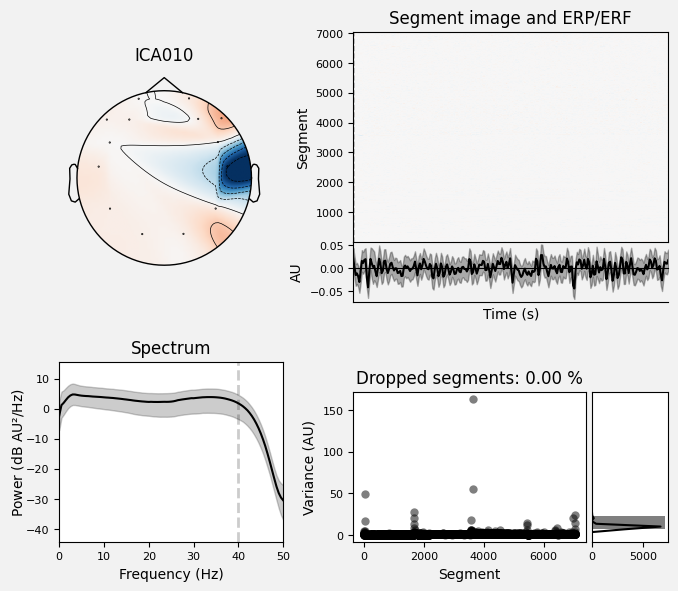

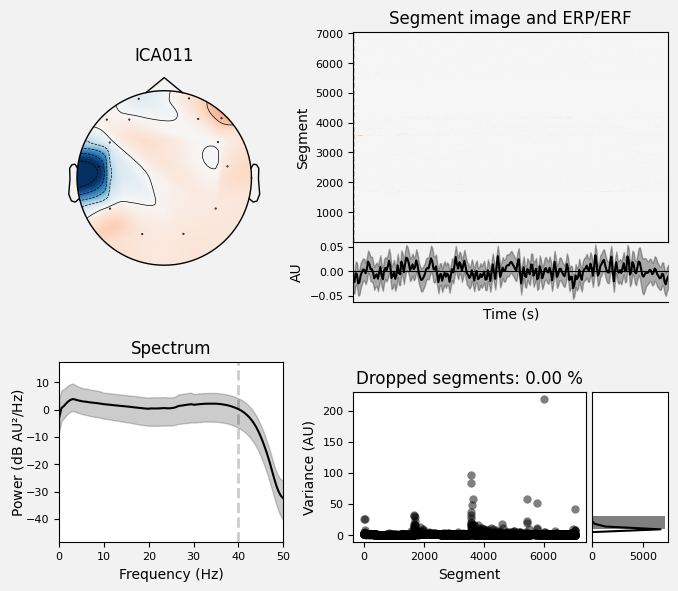

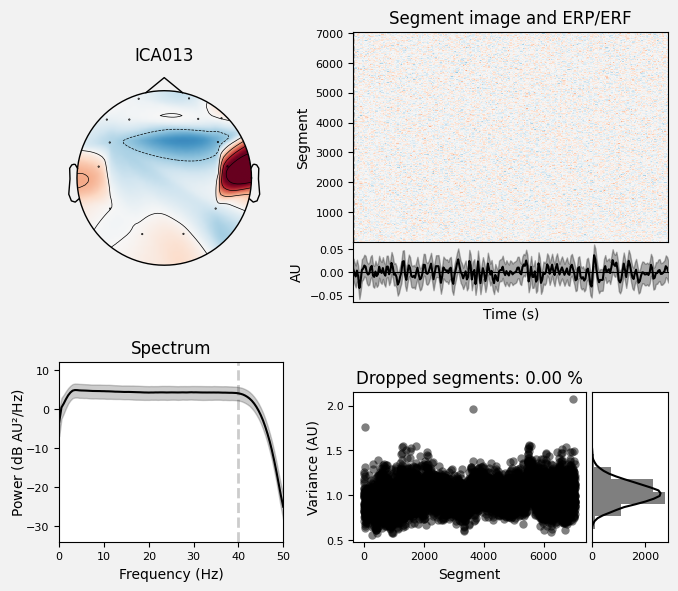

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
dt.subjects[4].ica.plot_properties(dt.subjects[4].raw_original, picks=[9, 1, 10, 11, 13])

Creating RawArray with float64 data, n_channels=6, n_times=1804932
    Range : 0 ... 1804931 =      0.000 ... 14101.023 secs
Ready.


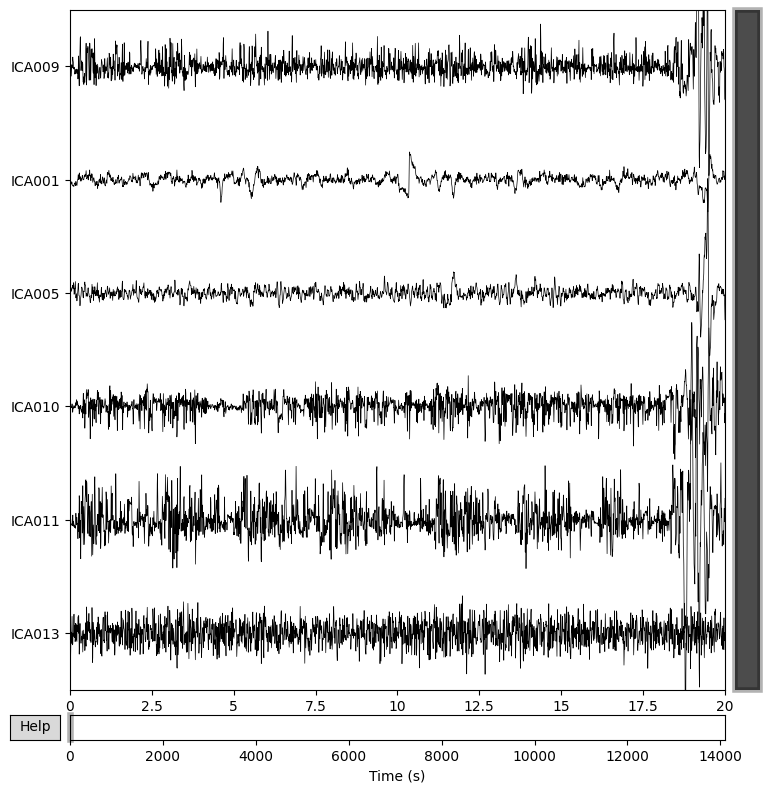

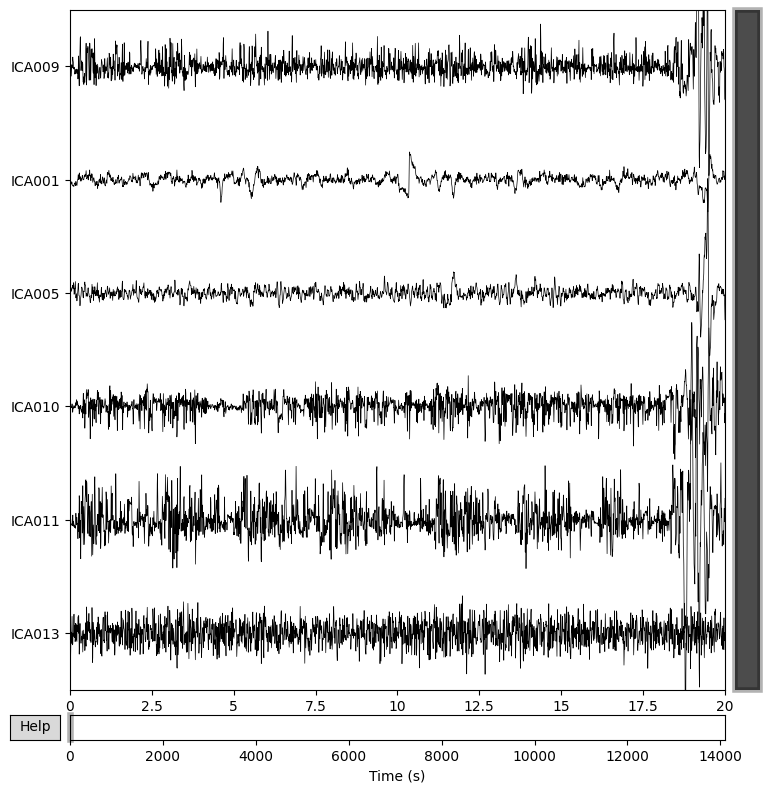

In [ ]:
dt.subjects[4].ica.plot_sources(dt.subjects[4].raw_original, picks=[9, 1, 5, 10, 11, 13])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 5 ICA components
    Projecting back using 14 PCA components


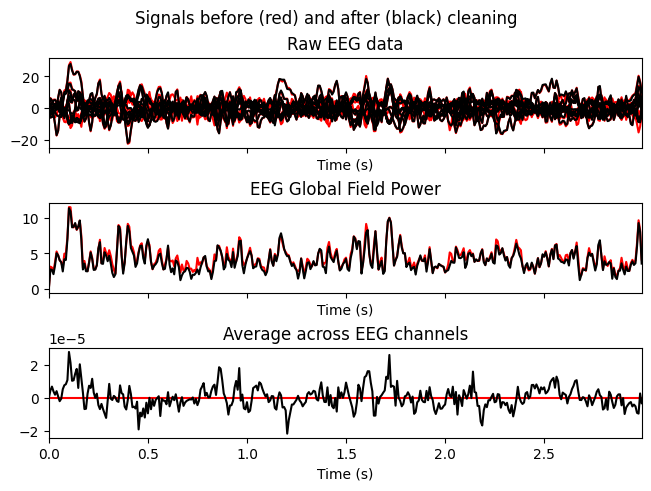

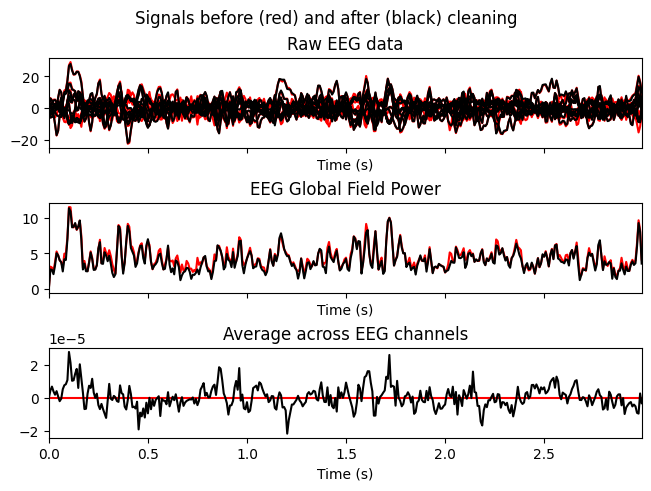

In [ ]:
dt.subjects[4].ica.plot_overlay(dt.subjects[4].raw_original, exclude=[11, 10, 9, 5, 13])

In [ ]:
!pip install mne-icalabel

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.6/21.6 MB 46.0 MB/s eta 0:00:00


In [ ]:


# assume `ica` is your fitted ICA object, and `raw` is your Raw
scores= label_components(dt.subjects[4].raw_original, dt.subjects[4].ica, method='iclabel')


# attach to ica
# ica.labels_ = labels        # a dict: { 'brain': [0,2,5], 'muscle': [1,4], ... }
# ica.labels_scores_ = scores # array of shape (n_components, n_classes)
# # see how many “brain” vs “artifact”
# print({k: len(v) for k, v in ica.labels_.items()})

# auto-exclude anything that’s > 50% muscle or eye
# to_exclude = []
# for idx, score in enumerate(scores):
#     if score['muscle'] > 0.5 or score['eye'] > 0.5:
#         to_exclude.append(idx)
# ica.exclude = to_exclude


<ipython-input-40-206c226dc2a5>:4: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  scores= label_components(dt.subjects[4].raw_original, dt.subjects[4].ica, method='iclabel')
<ipython-input-40-206c226dc2a5>:4: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  scores= label_components(dt.subjects[4].raw_original, dt.subjects[4].ica, method='iclabel')


In [ ]:
scores_df = pd.DataFrame(scores)
scores_df.groupby("labels").apply(lambda x: x).sort_values("y_pred_proba", ascending=False)

<ipython-input-48-cbbd866f139b>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  scores_df.groupby("labels").apply(lambda x: x).sort_values("y_pred_proba", ascending=False)


y_pred_proba           labels
labels                                           
brain           7       0.880126            brain
other           1       0.820602            other
brain           6       0.816672            brain
                5       0.782728            brain
                0       0.728266            brain
other           13      0.712510            other
                2       0.679709            other
muscle artifact 10      0.537264  muscle artifact
other           9       0.534990            other
                8       0.532606            other
brain           12      0.485333            brain
                4       0.475888            brain
other           3       0.444761            other
                11      0.440753            other

In [ ]:
exclude_ica_grid = [
    [],
    [1],
    [13],
    [10],
    [1,13,10],
    [1,13],
    [1,10],
    [13,10]
]

subject5_results = {}

for exclude_ica in exclude_ica_grid:
  subject5_df_fe = dt.extract_features_df(5, exclude_ica=exclude_ica, average_bands=False)

  subject5_df_fe = average_bands(subject5_df_fe)
  subject5_df_fe["ABTR"] = subject5_df_fe["beta"] / (subject5_df_fe["theta"] + subject5_df_fe["alpha"])
  X = subject5_df_fe.drop(columns=["Mental_State"])
  y = subject5_df_fe["Mental_State"]
  y = y.apply(lambda x: 1 if x == 2 else 0)



  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  rf = RandomForestClassifier(n_estimators=350, random_state=42)

  rf.fit(X_train, y_train)

  y_pred = rf.predict(X_test)

  accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

  subject5_results[str(exclude_ica)] = {
      "accuracy": accuracy,
      "f1": f1,
      "classification_rep": classification_rep,
      "confusion": confusion
  }

  print(f"Exclude ICA: {exclude_ica}")
  print("Accuracy:", accuracy)
  print("F1:", f1)
  print(classification_rep)
  print(confusion)

subject5_res_df = pd.DataFrame(subject5_results).T
subject5_res_df.sort_values(by="f1", ascending=False)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components
Not setting metadata
1281 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1281 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 5: Counter({0: 844, 1: 219, 2: 218})
Exclude ICA: []
Accuracy: 0.933852140077821
F1: 0.9312847926971612
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       207
           1       0.90      0.74      0.81        50

    accuracy                           0.93       257
   macro avg       0.92      0.86      0.89       257
weighted avg       0.93      0.93      0.93       257

[[203   4]
 [ 13  37]]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting bac

,accuracy,f1,classification_rep,confusion
"[13, 10]",0.945525,0.943673,precision recall f1-score ...,"[[204, 3], [11, 39]]"
[13],0.937743,0.935019,precision recall f1-score ...,"[[204, 3], [13, 37]]"
"[1, 13]",0.937743,0.934375,precision recall f1-score ...,"[[205, 2], [14, 36]]"
[],0.933852,0.931285,precision recall f1-score ...,"[[203, 4], [13, 37]]"
[10],0.933852,0.93062,precision recall f1-score ...,"[[204, 3], [14, 36]]"
"[1, 10]",0.933852,0.929917,precision recall f1-score ...,"[[205, 2], [15, 35]]"
"[1, 13, 10]",0.929961,0.925406,precision recall f1-score ...,"[[205, 2], [16, 34]]"
[1],0.92607,0.920839,precision recall f1-score ...,"[[205, 2], [17, 33]]"


We will remove artifacts 13, 10

## Final Model

In [ ]:
dt = DataTransformer(path_to_data)

for i in range(1,6):
  dt.get_subject_data(i, include_habituation=False)
  dt.preprocess_apply_ica(i)




Data for Subject 1 is successfully retrieved
Subject 1 has 1776340 rows
Creating RawArray with float64 data, n_channels=14, n_times=1776340
    Range : 0 ... 1776339 =      0.000 ... 13877.648 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    8.5s finished


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.1) and smallest (3.4e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 142.7s.
Data for Subject 2 is successfully retrieved
Subject 2 has 1848160 rows
Creating RawArray with float64 data, n_channels=14, n_times=1848160
    Range : 0 ... 1848159 =      0.000 ... 14438.742 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data usi

[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.7s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.7) and smallest (3.7e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 178.2s.
Data for Subject 3 is successfully retrieved
Subject 3 has 1872140 rows
Creating RawArray with float64 data, n_channels=14, n_times=1872140
    Range : 0 ... 1872139 =      0.000 ... 14626.086 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    5.1s finished


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.4) and smallest (2.9e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 157.2s.
Data for Subject 4 is successfully retrieved
Subject 4 has 1701412 rows
Creating RawArray with float64 data, n_channels=14, n_times=1701412
    Range : 0 ... 1701411 =      0.000 ... 13292.273 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Fitting ICA to data usi

[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.0s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (3.4) and smallest (1.1e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 79.7s.
list index out of range
Data for Subject 5 is successfully retrieved
Subject 5 has 1804932 rows
Creating RawArray with float64 data, n_channels=14, n_times=1804932
    Range : 0 ... 1804931 =      0.000 ... 14101.023 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.0s finished


Selecting by number: 14 components


<ipython-input-3-2f1f8d60a9a6>:158: RuntimeWarning: Using n_components=14 (resulting in n_components_=14) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.1) and smallest (1.5e-26) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 13
  ica.fit(raw_original)


Fitting ICA took 116.4s.


In [ ]:
final_df = []

for i in range(1,6):
  if i == 1:
    subject_df = dt.extract_features_df(i, exclude_ica=[9], average_bands=False)
  elif i == 2:
    subject_df = dt.extract_features_df(i, exclude_ica=[1], average_bands=False)
  elif i == 3:
    subject_df = dt.extract_features_df(i, exclude_ica=[11], average_bands=False)
  elif i == 4:
    subject_df = dt.extract_features_df(i, exclude_ica=[11,4], average_bands=False)
  else:
    subject_df = dt.extract_features_df(i, exclude_ica=[13,10], average_bands=False)

  final_df.append(subject_df)

final_df = pd.concat(final_df)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 2: Counter({0: 765, 2: 274, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing

In [ ]:
df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true, all_y_pred = [], []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # apply SMOTE to balance classes
    sm = SMOTE(random_state=42)
    X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

    clf = RandomForestClassifier(n_estimators=350, random_state=42)
    clf.fit(X_train_bal, y_train_bal)

    y_pred = clf.predict(X_test)
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"\nFold {fold} Report:")
    accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("F1:", f1)
    print(classification_report(y_test, y_pred, digits=2))
    print(confusion)

print("\n=== Overall Cross-Validation Report ===")
accuracy, f1, classification_rep, confusion = compute_metrics(all_y_true, all_y_pred)
print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(all_y_true, all_y_pred, digits=2))
print(confusion)



Fold 1 Report:
Accuracy: 0.9061767005473026
F1: 0.9040096703103202
              precision    recall  f1-score   support

           0       0.93      0.96      0.94      1017
           1       0.81      0.71      0.76       262

    accuracy                           0.91      1279
   macro avg       0.87      0.83      0.85      1279
weighted avg       0.90      0.91      0.90      1279

[[972  45]
 [ 75 187]]

Fold 2 Report:
Accuracy: 0.9092331768388107
F1: 0.9087075322176765
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      1016
           1       0.79      0.76      0.78       262

    accuracy                           0.91      1278
   macro avg       0.86      0.86      0.86      1278
weighted avg       0.91      0.91      0.91      1278

[[962  54]
 [ 62 200]]

Fold 3 Report:
Accuracy: 0.9014084507042254
F1: 0.9014084507042254
              precision    recall  f1-score   support

           0       0.94      0.94      0.

In [ ]:
# --- basic SMOTE workflow (no cross-validation) --------------------

df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

# 1. hold-out split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)

# 2. oversample only the training part
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

# 3. train model
clf = RandomForestClassifier(n_estimators=350, random_state=42)
clf.fit(X_train_bal, y_train_bal)

# 4. predict on untouched test set
y_pred = clf.predict(X_test)
accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)

print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(y_test, y_pred, digits=3))
print(confusion)


Accuracy: 0.9038311180609852
F1: 0.9040338177692586
              precision    recall  f1-score   support

           0      0.941     0.938     0.939      1017
           1      0.762     0.771     0.767       262

    accuracy                          0.904      1279
   macro avg      0.852     0.855     0.853      1279
weighted avg      0.904     0.904     0.904      1279

[[954  63]
 [ 60 202]]


### Hyperparameter Tuning

Hyperparameter tuning is going to be performed by Bayesian Optimization via Optuna library:
* Logging is automated via SQLite Database
* More efficient compared to GridSearch or RandomizedSearch
* Hyperparameter importance can be computed and visualized

In [ ]:
import joblib
# Setup cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Prepare data - get mean bands(alpha,thetha, gamma...) + engineer ABTR feature
df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

def _save_every_trial(study, trial):
    # dump full Study
    joblib.dump(study, '/content/drive/MyDrive/study.pkl')
    # also dump a simple table of trials to CSV
    df = study.trials_dataframe(attrs=("number","value","params","state"))
    df.to_csv('/content/drive/MyDrive/trials_snapshot.csv', index=False)

# Pick a path for the DB
DB_PATH = "/content/drive/MyDrive/optuna_study.db"

storage = f"sqlite:///{DB_PATH}"
study = optuna.create_study(
    study_name="RF_f1_opt",
    storage=storage,
    direction="maximize",
    sampler=optuna.samplers.TPESampler(seed=42),  # Bayesian optimization
    pruner=optuna.pruners.MedianPruner(),
    load_if_exists=True# <-- important to pick up where we left off in case colab crashes

)



def objective(trial):
    """Objective function for Optuna optimization"""

    # Define hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 100, 950, step=50)
    max_depth = trial.suggest_categorical('max_depth', list(range(5, 51, 5)) + [None])
    min_samples_split = trial.suggest_int('min_samples_split', 2, 15)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)

    # Create pipeline
    rf_pipe = Pipeline([
        ('smote', SMOTE(random_state=42)),
        ('rf', RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            random_state=42,
            n_jobs=-1
        ))
    ])

    scores = cross_val_score(rf_pipe, X, y, cv=skf, scoring='f1_weighted', n_jobs=-1)
    return scores.mean()






# Optimize
study.optimize(objective, n_trials=7, show_progress_bar=True, callbacks = [_save_every_trial])

# Get best results
print("Best trial:")
print(f"Value (F1 Score): {study.best_value:.4f}")
print("Params:")
for key, value in study.best_params.items():
    print(f"    {key}: {value}")

#Train final model with best parameters
best_params = study.best_params
rf_best_pipe = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('rf', RandomForestClassifier(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42,
        n_jobs=-1
    ))
])

#Fit the best model
rf_best_pipe.fit(X, y)

#Get optimization history and statistics
print(f"\nNumber of finished trials: {len(study.trials)}")
print(f"Best trial number: {study.best_trial.number}")


[I 2025-05-29 14:31:31,724] Using an existing study with name 'RF_f1_opt' instead of creating a new one.


  0%|          | 0/7 [00:00<?, ?it/s]

[I 2025-05-29 14:34:17,840] Trial 54 finished with value: 0.8149354445974284 and parameters: {'n_estimators': 800, 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 1}. Best is trial 25 with value: 0.9067583601517587.
[I 2025-05-29 14:36:31,301] Trial 55 finished with value: 0.9044988934787994 and parameters: {'n_estimators': 400, 'max_depth': 50, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 25 with value: 0.9067583601517587.
[I 2025-05-29 14:38:57,483] Trial 56 finished with value: 0.8988627733087619 and parameters: {'n_estimators': 450, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 25 with value: 0.9067583601517587.
[I 2025-05-29 14:42:14,838] Trial 57 finished with value: 0.9056977202888511 and parameters: {'n_estimators': 550, 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 25 with value: 0.9067583601517587.
[I 2025-05-29 14:46:43,134] Trial 58 finished with value: 0.9059419858037907 and par

In [ ]:
hparams_df = study.trials_dataframe(attrs=("number","value","params","state"))
hparams_df.sort_values(by="value", ascending=False).head(10)

,number,value,params_max_depth,params_min_samples_leaf,params_min_samples_split,params_n_estimators,state
25,25,0.906758,25.0,2,8,600,COMPLETE
17,17,0.906471,50.0,1,7,500,COMPLETE
16,16,0.906182,50.0,1,7,450,COMPLETE
58,58,0.905942,50.0,1,9,700,COMPLETE
44,44,0.905942,50.0,1,9,700,COMPLETE
46,46,0.905942,50.0,1,9,700,COMPLETE
60,60,0.905721,50.0,2,10,750,COMPLETE
35,35,0.905698,50.0,1,9,550,COMPLETE
57,57,0.905698,50.0,1,9,550,COMPLETE
28,28,0.905698,50.0,1,9,550,COMPLETE


In [ ]:
import plotly.graph_objects as go

fig = optuna.visualization.plot_optimization_history(study)

# show values of trials
for trace in fig.data:
    if 'markers' in trace.mode:
        trace.text = [f"{y:.3f}" for y in trace.y]
        if 'text' not in trace.mode:
            trace.mode = trace.mode + '+text'
        trace.textposition = 'top center'
fig.show()

fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()




In [ ]:
# Best trial:
#   Value (F1 Score): 0.9080
#   Params:
#     n_estimators: 750
#     max_depth: 50
#     min_samples_split: 4
#     min_samples_leaf: 1


df = average_bands(final_df)
df["ABTR"] = df["beta"] / (df["theta"] + df["alpha"])

X = df.drop(columns="Mental_State").values
y = df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

all_y_true, all_y_pred = [], []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # apply SMOTE to balance classes
    sm = SMOTE(random_state=42)
    X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

    best_clf = RandomForestClassifier(n_estimators=750, max_depth=50, min_samples_split=4, min_samples_leaf=1, random_state=42)
    best_clf.fit(X_train_bal, y_train_bal)

    y_pred = best_clf.predict(X_test)
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"\nFold {fold} Report:")
    accuracy, f1, classification_rep, confusion = compute_metrics(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("F1:", f1)
    print(classification_report(y_test, y_pred, digits=2))
    print(confusion)

print("\n=== Overall Cross-Validation Report ===")
accuracy, f1, classification_rep, confusion = compute_metrics(all_y_true, all_y_pred)
print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(all_y_true, all_y_pred, digits=2))
print(confusion)




Fold 1 Report:
Accuracy: 0.9030492572322126
F1: 0.9011302396252386
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1017
           1       0.79      0.71      0.75       262

    accuracy                           0.90      1279
   macro avg       0.86      0.83      0.85      1279
weighted avg       0.90      0.90      0.90      1279

[[968  49]
 [ 75 187]]

Fold 2 Report:
Accuracy: 0.9076682316118936
F1: 0.9072694069031269
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1016
           1       0.78      0.76      0.77       262

    accuracy                           0.91      1278
   macro avg       0.86      0.85      0.86      1278
weighted avg       0.91      0.91      0.91      1278

[[960  56]
 [ 62 200]]

Fold 3 Report:
Accuracy: 0.905320813771518
F1: 0.9047022687295093
              precision    recall  f1-score   support

           0       0.94      0.94      0.9

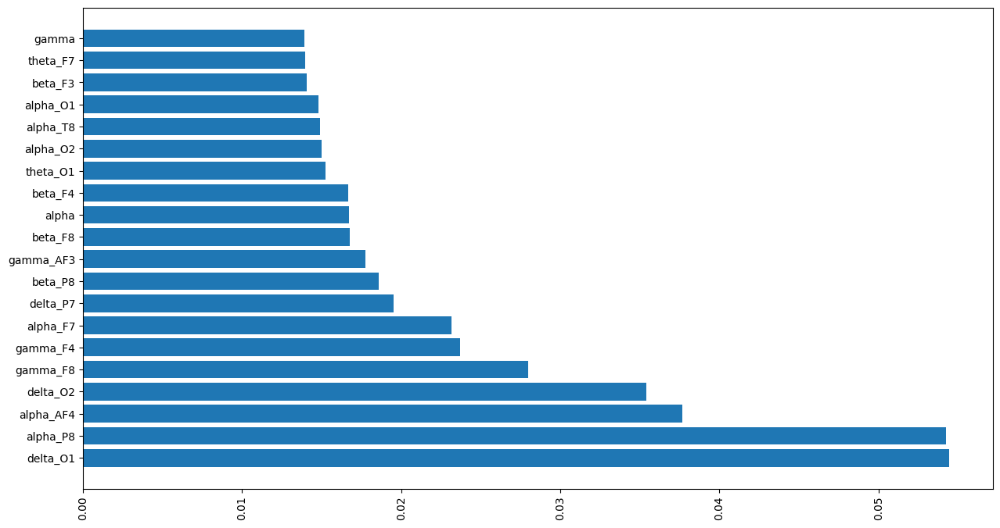

In [ ]:
feature_imp_df = pd.DataFrame(best_clf.feature_importances_, index=df.drop(columns="Mental_State").columns, columns=["Importance"])
feature_imp_df = feature_imp_df.sort_values(by="Importance", ascending=False)


top = 20
plt.figure(figsize=(15,8))
plt.barh(feature_imp_df.index[:top], feature_imp_df["Importance"][:top])
plt.xticks(rotation=90)
plt.show()

## Sanity Check model

In [ ]:
student1to4_df = []

for i in range(1, 5):
  if i == 1:
    subject_df = dt.extract_features_df(i, exclude_ica=[9], average_bands=False)
  elif i == 2:
    subject_df = dt.extract_features_df(i, exclude_ica=[1], average_bands=False)
  elif i == 3:
    subject_df = dt.extract_features_df(i, exclude_ica=[11], average_bands=False)
  elif i == 4:
    subject_df = dt.extract_features_df(i, exclude_ica=[11,4], average_bands=False)

  student1to4_df.append(subject_df)

student1to4_df = pd.concat(student1to4_df)

student5_test_df = dt.extract_features_df(5, exclude_ica = [13,10], average_bands=False)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1261 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1261 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 1: Counter({0: 715, 2: 273, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1312 events and 1536 original time points ...
0 bad epochs dropped
Effective window size : 12.000 (s)
Label counts for Subject 2: Counter({0: 765, 2: 274, 1: 273})
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing

In [ ]:
#   Params:
#     n_estimators: 750
#     max_depth: 50
#     min_samples_split: 4
#     min_samples_leaf: 1

student1to4_df = average_bands(student1to4_df)
student1to4_df["ABTR"] = student1to4_df["beta"] / (student1to4_df["theta"] + student1to4_df["alpha"])
X, y = student1to4_df.drop(columns=["Mental_State"]).values, student1to4_df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values


student5_test_df = average_bands(student5_test_df)
student5_test_df["ABTR"] = student5_test_df["beta"] / (student5_test_df["theta"] + student5_test_df["alpha"])
X_test, y_test = student5_test_df.drop(columns=["Mental_State"]).values, student5_test_df["Mental_State"].apply(lambda x: 1 if x == 2 else 0).values

smote = SMOTE(random_state=42)
X, y = smote.fit_resample(X, y)

sanity_clf = RandomForestClassifier(n_estimators=750, max_depth=50, min_samples_split=4, min_samples_leaf=1, random_state=42)
sanity_clf.fit(X, y)


test_preds = sanity_clf.predict(X_test)
accuracy, f1, classification_rep, confusion = compute_metrics(y_test, test_preds)
print("Accuracy:", accuracy)
print("F1:", f1)
print(classification_report(y_test, test_preds, digits=2))
print(confusion)


Accuracy: 0.8743169398907104
F1: 0.8515061412015984
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      1063
           1       0.82      0.33      0.48       218

    accuracy                           0.87      1281
   macro avg       0.85      0.66      0.70      1281
weighted avg       0.87      0.87      0.85      1281

[[1047   16]
 [ 145   73]]


8038

# Results

We tried 4 different models:
Noise - Eye-Blink, Muscle artifacts
* Random Forest with 3 classes
* Random Forest with 2 classes
* Random Forest with 2 classes and cleaned Noise
* RF-tuned (2 classes wihouth Noise)

In [ ]:
results = [
    ["RF-3", 0.7857701329163409, 0.7643848685808752],
    ["RF-2", 0.899, 0.8948],
    ["RF-cleaned-2", 0.9072132686590518, 0.9074348545483607],
    ["RF-tuned-cleaned-2", 0.9079956188389924, 0.9081511386537982]
]


results_cv_extended = {
    "RF-2": [
        {"K-fold": "Fold-1", "Metric": "Accuracy", "Metric_Value": 0.893},
        {"K-fold": "Fold-2", "Metric": "Accuracy", "Metric_Value": 0.901},
        {"K-fold": "Fold-3", "Metric": "Accuracy", "Metric_Value": 0.894},
        {"K-fold": "Fold-4", "Metric": "Accuracy", "Metric_Value": 0.902},
        {"K-fold": "Fold-5", "Metric": "Accuracy", "Metric_Value": 0.905},
        {"K-fold": "Overall", "Metric": "Accuracy", "Metric_Value": 0.899},
        {"K-fold": "Fold-1", "Metric": "F1", "Metric_Value": 0.886},
        {"K-fold": "Fold-2", "Metric": "F1", "Metric_Value": 0.896},
        {"K-fold": "Fold-3", "Metric": "F1", "Metric_Value": 0.890},
        {"K-fold": "Fold-4", "Metric": "F1", "Metric_Value": 0.900},
        {"K-fold": "Fold-5", "Metric": "F1", "Metric_Value": 0.902},
        {"K-fold": "Overall", "Metric": "F1", "Metric_Value": 0.8948},
             ],
    "RF-cleaned-2":[
    {"K-fold": "Fold-1", "Metric": "Accuracy", "Metric_Value": 0.9061767005473026},
    {"K-fold": "Fold-2", "Metric": "Accuracy", "Metric_Value": 0.9092331768388107},
    {"K-fold": "Fold-3", "Metric": "Accuracy", "Metric_Value": 0.9014084507042254},
    {"K-fold": "Fold-4", "Metric": "Accuracy", "Metric_Value": 0.9084507042253521},
    {"K-fold": "Fold-5", "Metric": "Accuracy", "Metric_Value": 0.9107981220657277},
    {"K-fold": "Overall", "Metric": "Accuracy", "Metric_Value": 0.9072132686590518},
    {"K-fold": "Fold-1", "Metric": "F1", "Metric_Value": 0.9040096703103202},
    {"K-fold": "Fold-2", "Metric": "F1", "Metric_Value": 0.9087075322176765},
    {"K-fold": "Fold-3", "Metric": "F1", "Metric_Value": 0.9014084507042254},
    {"K-fold": "Fold-4", "Metric": "F1", "Metric_Value": 0.9097364932206113},
    {"K-fold": "Fold-5", "Metric": "F1", "Metric_Value": 0.9127673016516364},
    {"K-fold": "Overall", "Metric": "F1", "Metric_Value": 0.9074348545483607}],

    "RF-tuned-cleaned-2":[
        {"K-fold": "Fold-1", "Metric": "Accuracy", "Metric_Value": 0.9030492572322126},
        {"K-fold": "Fold-1", "Metric": "F1", "Metric_Value": 0.9011302396252386},
        {"K-fold": "Fold-2", "Metric": "Accuracy", "Metric_Value": 0.9076682316118936},
        {"K-fold": "Fold-2", "Metric": "F1", "Metric_Value": 0.9072694069031269},
        {"K-fold": "Fold-3", "Metric": "Accuracy", "Metric_Value": 0.905320813771518},
        {"K-fold": "Fold-3", "Metric": "F1", "Metric_Value": 0.9047022687295093},
        {"K-fold": "Fold-4", "Metric": "Accuracy", "Metric_Value": 0.9123630672926447},
        {"K-fold": "Fold-4", "Metric": "F1", "Metric_Value": 0.9133136266156611},
        {"K-fold": "Fold-5", "Metric": "Accuracy", "Metric_Value": 0.9115805946791862},
        {"K-fold": "Fold-5", "Metric": "F1", "Metric_Value": 0.9136877101285227},
        {"K-fold": "Overall", "Metric": "Accuracy", "Metric_Value": 0.9079956188389924},
        {"K-fold": "Overall", "Metric": "F1", "Metric_Value": 0.9081511386537982}

    ]

    }

results_cv_df = []
for method, entries in results_cv_extended.items():
    for e in entries:
        rec = {
            "Method": method,
            "Fold": e["K-fold"],
            "Metric": e["Metric"],
            "Value": e["Metric_Value"],
        }
        results_cv_df.append(rec)

results_cv_df = pd.DataFrame.from_records(results_cv_df)

results_cv_df = results_cv_df.set_index(["Method","Fold","Metric"]).sort_index()

results_df = pd.DataFrame(results, columns=["Setup", "Accuracy", "F1"])


In [ ]:
results_df.sort_values(by="F1", ascending=False)

,Setup,Accuracy,F1
3,RF-tuned-cleaned-2,0.907996,0.908151
2,RF-cleaned-2,0.907213,0.907435
1,RF-2,0.899000,0.894800
0,RF-3,0.785770,0.764385


In [ ]:
results_cv_df

Value
Method             Fold    Metric            
RF-2               Fold-1  Accuracy  0.893000
                           F1        0.886000
                   Fold-2  Accuracy  0.901000
                           F1        0.896000
                   Fold-3  Accuracy  0.894000
                           F1        0.890000
                   Fold-4  Accuracy  0.902000
                           F1        0.900000
                   Fold-5  Accuracy  0.905000
                           F1        0.902000
                   Overall Accuracy  0.899000
                           F1        0.894800
RF-cleaned-2       Fold-1  Accuracy  0.906177
                           F1        0.904010
                   Fold-2  Accuracy  0.909233
                           F1        0.908708
                   Fold-3  Accuracy  0.901408
                           F1        0.901408
                   Fold-4  Accuracy  0.908451
                           F1        0.909736
                   Fold-5  Accuracy  0.910798
                           F1        0.912767
                   Overall Accuracy  0.907213
                           F1        0.907435
RF-tuned-cleaned-2 Fold-1  Accuracy  0.903049
                           F1        0.901130
                   Fold-2  Accuracy  0.907668
                           F1        0.907269
                   Fold-3  Accuracy  0.905321
                           F1        0.904702
                   Fold-4  Accuracy  0.912363
                           F1        0.913314
                   Fold-5  Accuracy  0.911581
                           F1        0.913688
                   Overall Accuracy  0.907996
                           F1        0.908151